# To make my life a bit easier...

In [1]:
def plot_sed(x, y, yerr):
    plt.clf()
    plt.errorbar(wavelength, flux, yerr=flux_err, c='red', ecolor='gray', capthick=2)
    plt.show()

In [2]:
def print_time(begin_time, end_time):
    """ 
    This function prints the time in minutes that a certain task took.
    """
    print ("--------------------------------------------------")
    print ("CPU process time: %.2f [min]" % float((end-start)/60))
    print ("--------------------------------------------------")

# Packages

### General packages

In [3]:
import numpy             as np
import pandas            as pd
import matplotlib.pyplot as plt
import seaborn           as sns
import astropy.io.fits   as pf
import astropy.constants as ct
import os
import time
import scipy.interpolate as sci
import ipywidgets        as widgets

### pPXF imports

In [4]:
import ppxf.miles_util   as lib  # MILES library embedded in ppxf
import ppxf.ppxf_util    as util
import ppxf              as ppxf_module
from ppxf.ppxf           import ppxf
from ppxf.ppxf_util      import log_rebin

# Config. inputs

### Paths and files

In [5]:
seds_path    = '../../../../GAMADR3_SPECTRA/DATABASE/'
ppxf_dir     = os.path.dirname(os.path.realpath(ppxf_module.__file__))
miles_lib    = ppxf_dir+'/miles_models/Mun1.30*.fits'

In [6]:
data          = pd.read_csv('uv_redseq_psmed_oneneighbor_magphys.csv')

In [7]:
seds_list = []
for i in data['SPECID']: seds_list.append(i+'.fit')

### Constants

In [8]:
light_speed = float(str(ct.c.to('km/s')).split(' ')[0])            # selecting the numerical values 
                                                                   # (must be in km/s)
gama_resol  = 1300.

# Plot parameters (because I'm lazy)

In [9]:
plotpars = {'axes.linewidth': 1.,
            'axes.labelsize': 18,
            'xtick.labelsize': 18,
            'ytick.labelsize': 18,
            'legend.framealpha': 0.6,
            'legend.loc': 'upper right',
            'legend.fontsize': 12,
            }

In [10]:
palette      = ['#ef8a62','#f7f7f7','#67a9cf']
transparency = 0.8
lw           = 2.

# Spectral fitting

## Configuring inputs

### pPXF "fixed" parameters

In [11]:
# Fit (V, sig, h3, h4) moments=4 for the stars; (V, sig) moments=2 for the two gas kinematic components
moments        = [4, 2, 2]
# degree         = -1       # Additive Legendre polynomial degrees
degree         = 100        # Additive Legendre polynomial degrees
mdegree        = 50         # Multiplicative Legendre polynomial degrees
regul_err      = 0.013      # Desired regularization error -- TODO: MUST CHECK WHY 0.013
tied_balmer    = True
limit_doublets = False
stellar_comp_w = [0]        # weight of the stellar component
balmer_comp_w  = [1]        # weight of the balmer emission lines
forbid_comp_w  = [2]        # weight of the forbidden lines
# wl_min         = 3540       # MILES RANGE MIN
# wl_max         = 7409       # MILES RANGE MAX
wl_min = 4350            # removing the bluest part of the spectra in order to mitigate noise effects
wl_max = 7409

In [12]:
new_path = 'd'+str(degree)+'m'+str(mdegree)

In [13]:
results_path = '../../LargeFilesResults/PSM_analysis/'+ new_path

#### Checking if the directory exists and, if not, creating it!

In [14]:
if not os.path.exists(results_path):
    os.makedirs(results_path)

### pPXF loop

In [15]:
bar = widgets.IntProgress(value=0, min=0, max=len(seds_list)+1, step=0.5, description='Running pPXF:',
                          orientation='horizontal')
display(bar)

IntProgress(value=0, description='Running pPXF:', max=139)

In [16]:
mean_age   = ['<logAge>']
mean_metal = ['<[M/H]>']
mass2light = ['MASS2LIGHT_R']
ids        = ['CATAID']
redshifts  = ['Z']
vel_disp   = ['VEL_DISP']

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47754       484    -0.023    -0.068
 comp.  1:     47815       660
 comp.  2:     45499       980
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008818
method = capfit; Jac calls: 11; Func calls: 678; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      27.71       7.2   47815   660
Comp:  2       Unknown          0   1.1e+02   45499   980
Comp:  2       Unknown  3.064e+05   1.1e+02   45499   980
Comp:  2       Unknown          0       9.3   45499   980
Comp:  2       Unknown      9.195       6.3   45499   980
---------------------------------------------------------
Weighted <logAge> [yr]: 9.65
Weighted <[M/H]>: -0.416
Weighted <logAge> [yr]: 9.65
Weighted <[M/H]>: -0.416
M/L_r: 1.484
Current $\chi^2$: 0.0088
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


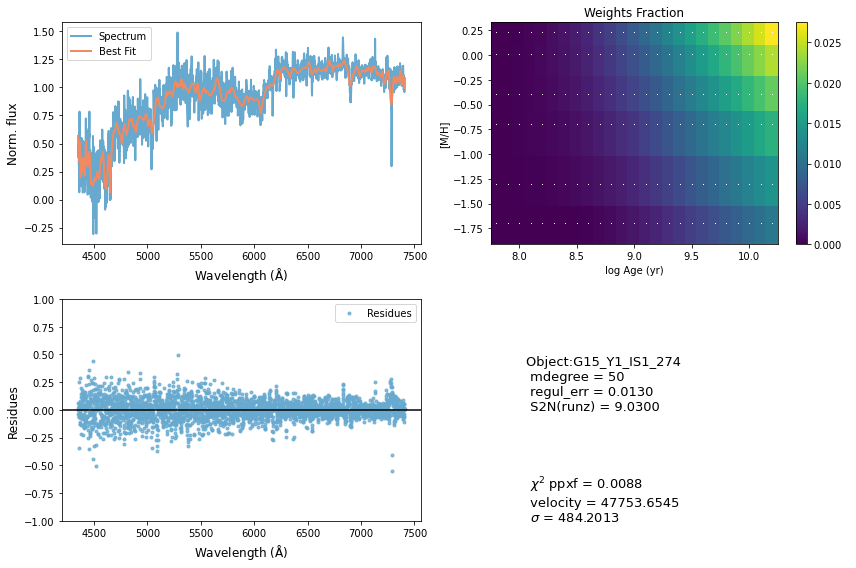

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41889      1000     0.013    -0.061
 comp.  1:     43877       180
 comp.  2:     44155       194
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004508
method = capfit; Jac calls: 18; Func calls: 1085; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  116 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.2   43877   180
Comp:  2       Unknown          0       4.3   44155   194
Comp:  2       Unknown      1.319       3.3   44155   194
---------------------------------------------------------
Weighted <logAge> [yr]: 9.57
Weighted <[M/H]>: -0.455
Weighted <logAge> [yr]: 9.57
Weighted <[M/H]>: -0.455
M/L_r: 1.192
Current $\chi^2$: 0.0045
Elapsed time in PPXF: 26.17 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


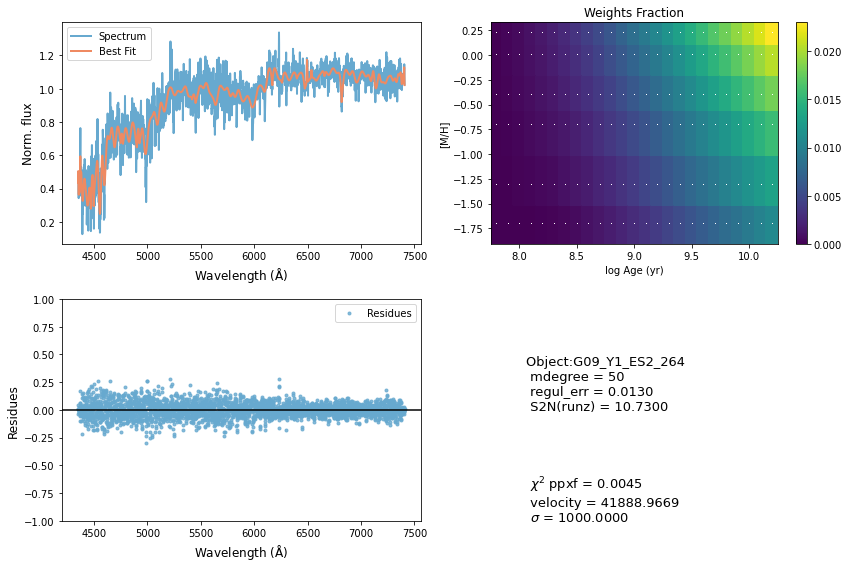

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37945       573    -0.044    -0.024
 comp.  1:     38048       714
 comp.  2:     40029       185
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004492
method = capfit; Jac calls: 17; Func calls: 1031; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  117 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      21.61       7.6   38048   714
Comp:  2       Unknown     0.4177       4.2   40029   185
Comp:  2       Unknown   0.005484       2.6   40029   185
---------------------------------------------------------
Weighted <logAge> [yr]: 9.39
Weighted <[M/H]>: -0.443
Weighted <logAge> [yr]: 9.39
Weighted <[M/H]>: -0.443
M/L_r: 0.8098
Current $\chi^2$: 0.0045
Elapsed time in PPXF: 28.52 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


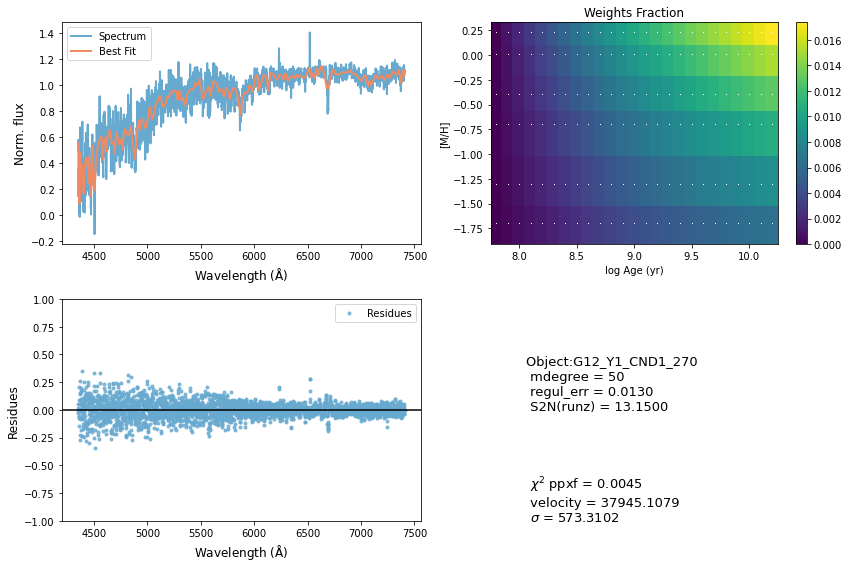

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39380       109     0.016     0.005
 comp.  1:     39368       230
 comp.  2:     39147       180
Gas Reddening E(B-V): 4.514
chi2/DOF: 0.01156
method = capfit; Jac calls: 12; Func calls: 734; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.536       2.4   39368   230
Comp:  2       Unknown          0       3.8   39147   180
Comp:  2       Unknown          0       2.8   39147   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.72
Weighted <[M/H]>: -0.175
Weighted <logAge> [yr]: 8.72
Weighted <[M/H]>: -0.175
M/L_r: 0.3916
Current $\chi^2$: 0.0116
Elapsed time in PPXF: 23.00 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


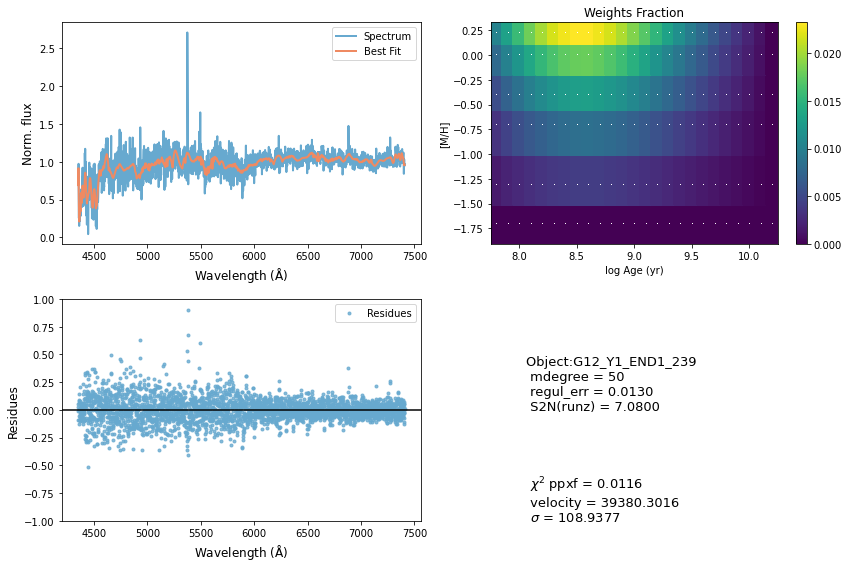

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     67090       250    -0.004     0.003
 comp.  1:     66912       242
 comp.  2:     66959         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006285
method = capfit; Jac calls: 15; Func calls: 906; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  71 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.907       4.8   66912   242
Comp:  2       Unknown          0       2.7   66959     1
Comp:  2       Unknown     0.5151       2.9   66959     1
Comp:  2       Unknown          0         2   66959     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.307
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.307
M/L_r: 2.545
Current $\chi^2$: 0.0063
Elapsed time in PPXF: 22.28 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


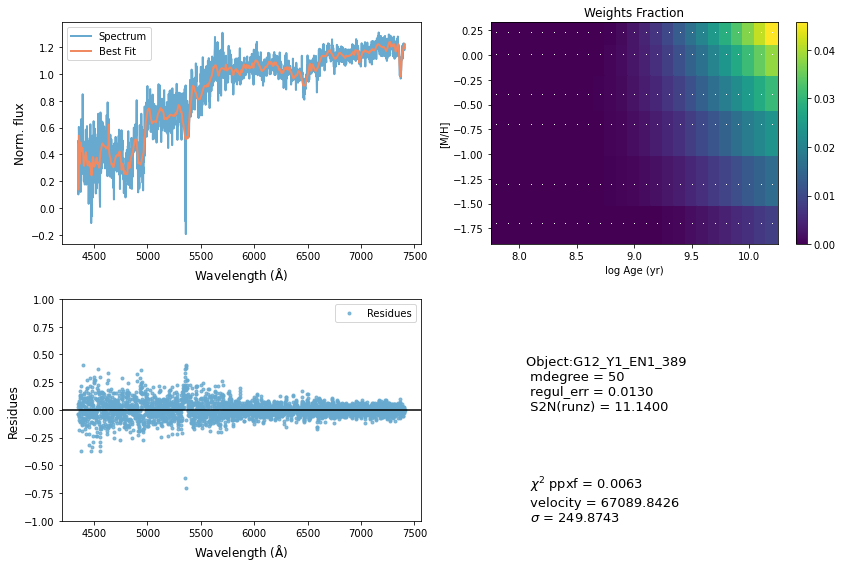

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34790       119     0.001     0.001
 comp.  1:     34768       143
 comp.  2:     34851       189
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01762
method = capfit; Jac calls: 12; Func calls: 731; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  97 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8241       3.8   34768   143
Comp:  2       Unknown          0       3.9   34851   189
Comp:  2       Unknown     0.0419       2.9   34851   189
Comp:  2       Unknown          0       2.4   34851   189
---------------------------------------------------------
Weighted <logAge> [yr]: 9.58
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 9.58
Weighted <[M/H]>: -1.1
M/L_r: 0.9607
Current $\chi^2$: 0.0176
Elapsed time in PPXF: 15.06 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


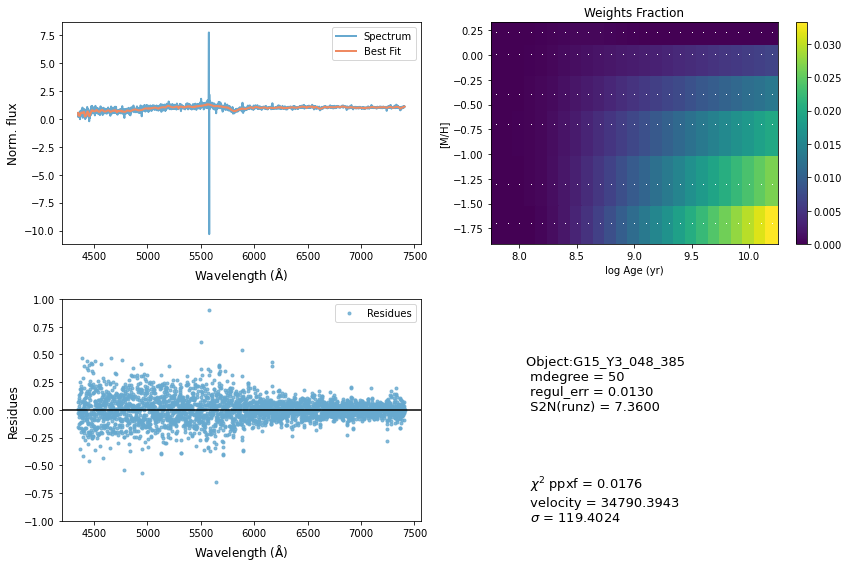

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     58669       414     0.045     0.232
 comp.  1:     58803       473
 comp.  2:     58530       326
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01588
method = capfit; Jac calls: 33; Func calls: 1992; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  47 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       7.98       8.1   58803   473
Comp:  2       Unknown        1.9        15   58530   326
Comp:  2       Unknown          0        15   58530   326
Comp:  2       Unknown      1.997         6   58530   326
---------------------------------------------------------
Weighted <logAge> [yr]: 8.42
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 8.42
Weighted <[M/H]>: -1.11
M/L_r: 0.2183
Current $\chi^2$: 0.0159
Elapsed time in PPXF: 45.43 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


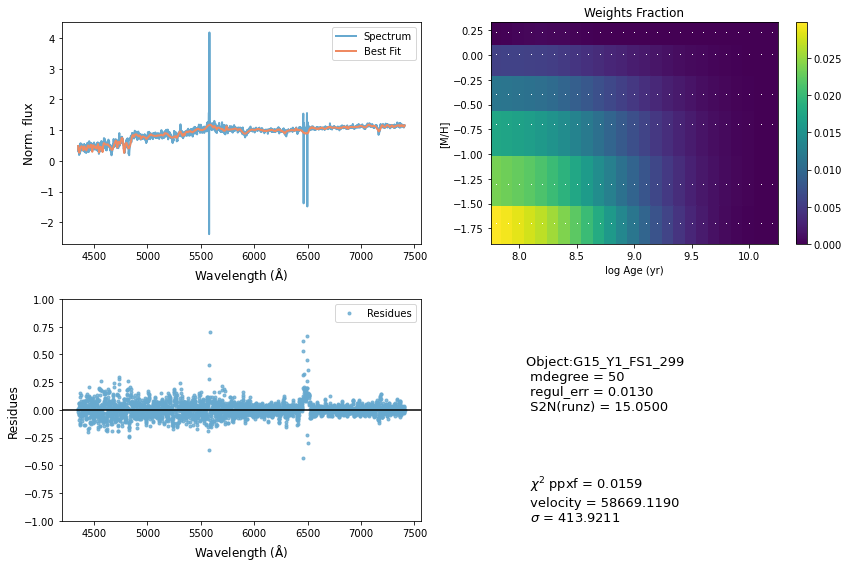

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48943       449     0.011     0.035
 comp.  1:     48302       149
 comp.  2:     49921       917
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01542
method = capfit; Jac calls: 13; Func calls: 793; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.3   48302   149
Comp:  2       Unknown          0        62   49921   917
Comp:  2       Unknown       1243        62   49921   917
Comp:  2       Unknown      13.96        10   49921   917
---------------------------------------------------------
Weighted <logAge> [yr]: 9.61
Weighted <[M/H]>: -0.422
Weighted <logAge> [yr]: 9.61
Weighted <[M/H]>: -0.422
M/L_r: 1.03
Current $\chi^2$: 0.0154
Elapsed time in PPXF: 17.13 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


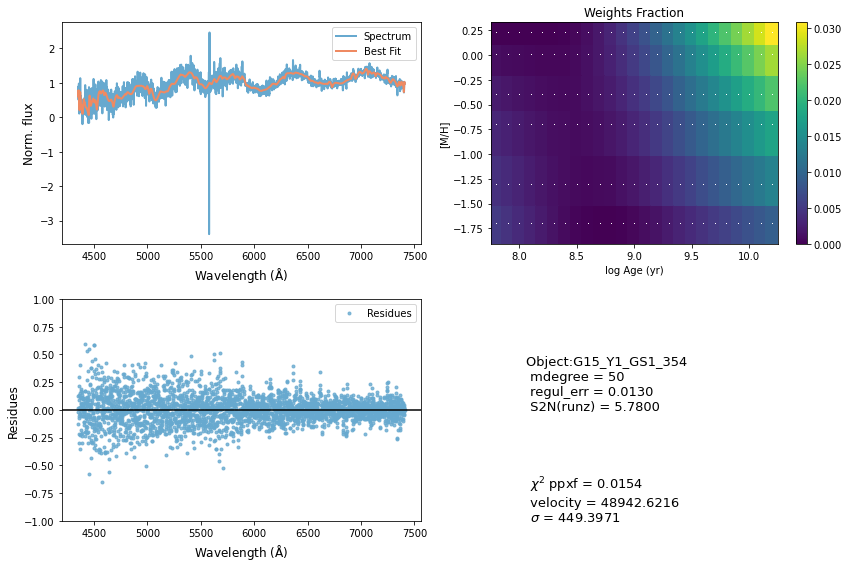

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53187       328     0.003     0.013
 comp.  1:     53544       396
 comp.  2:     53357       117
Gas Reddening E(B-V): 6.798
chi2/DOF: 0.02713
method = capfit; Jac calls: 16; Func calls: 965; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       2.45       2.2   53544   396
Comp:  2       Unknown      1.041       4.5   53357   117
Comp:  2       Unknown          0        10   53357   117
Comp:  2       Unknown     0.7578       4.6   53357   117
---------------------------------------------------------
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.637
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.637
M/L_r: 1.854
Current $\chi^2$: 0.0271
Elapsed time in PPXF: 22.48 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


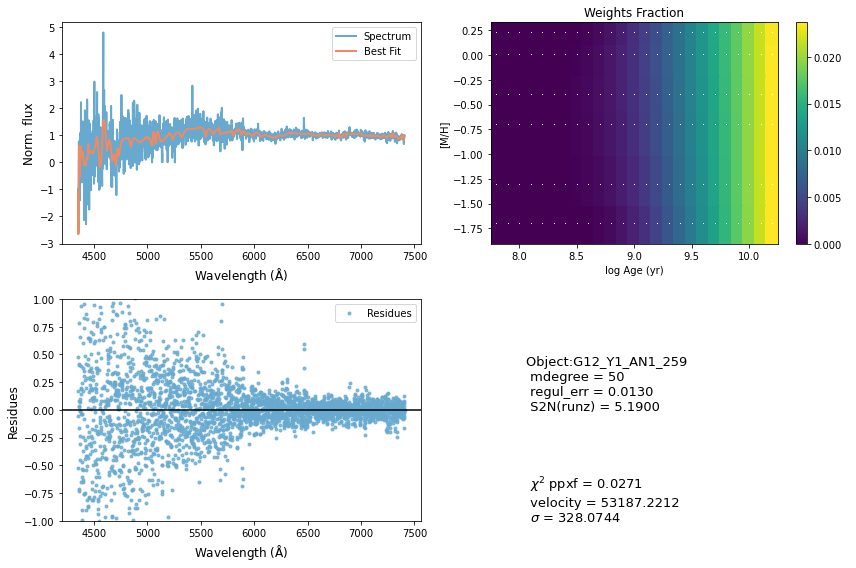

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47427       786    -0.004     0.006
 comp.  1:     44412       742
 comp.  2:     45303       182
Gas Reddening E(B-V): 4.844
chi2/DOF: 0.003638
method = capfit; Jac calls: 16; Func calls: 968; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.654       4.6   44412   742
Comp:  2       Unknown     0.7921         4   45303   182
Comp:  2       Unknown          0         3   45303   182
---------------------------------------------------------
Weighted <logAge> [yr]: 9.22
Weighted <[M/H]>: -0.187
Weighted <logAge> [yr]: 9.22
Weighted <[M/H]>: -0.187
M/L_r: 0.6613
Current $\chi^2$: 0.0036
Elapsed time in PPXF: 23.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


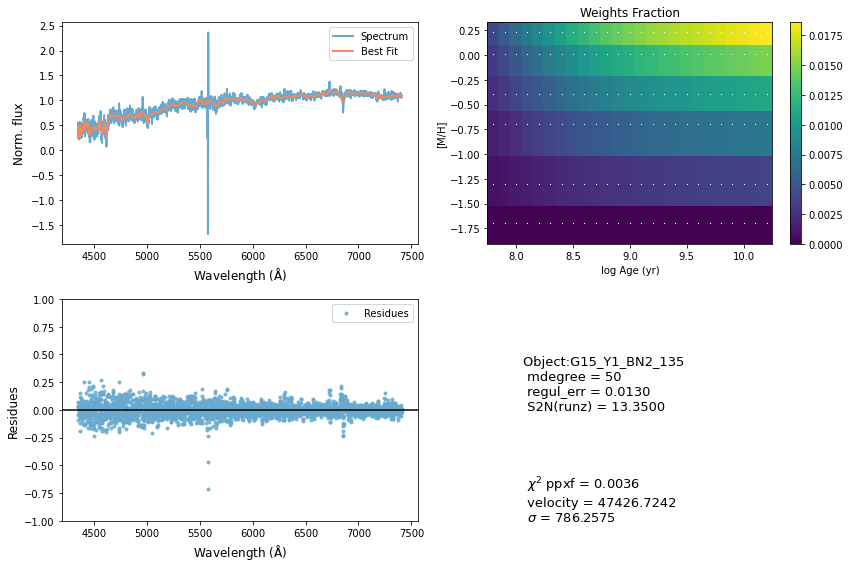

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43422       616    -0.127     0.049
 comp.  1:     41488       152
 comp.  2:     41895        61
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004517
method = capfit; Jac calls: 16; Func calls: 974; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  100 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6465       3.2   41488   152
Comp:  2       Unknown      0.498         3   41895    61
Comp:  2       Unknown          0       1.6   41895    61
---------------------------------------------------------
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -0.793
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -0.793
M/L_r: 1.173
Current $\chi^2$: 0.0045
Elapsed time in PPXF: 22.25 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


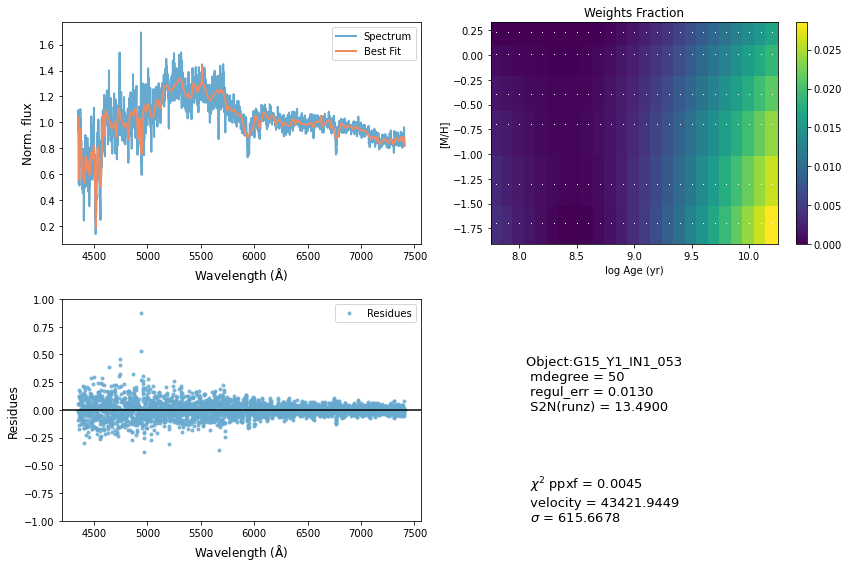

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48674       998     0.005    -0.064
 comp.  1:     49630       112
 comp.  2:     49635       199
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01045
method = capfit; Jac calls: 9; Func calls: 553; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  92 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3995       2.8   49630   112
Comp:  2       Unknown          0       8.2   49635   199
Comp:  2       Unknown      3.741       8.8   49635   199
Comp:  2       Unknown          0       4.7   49635   199
---------------------------------------------------------
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.494
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.494
M/L_r: 1.627
Current $\chi^2$: 0.0105
Elapsed time in PPXF: 12.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


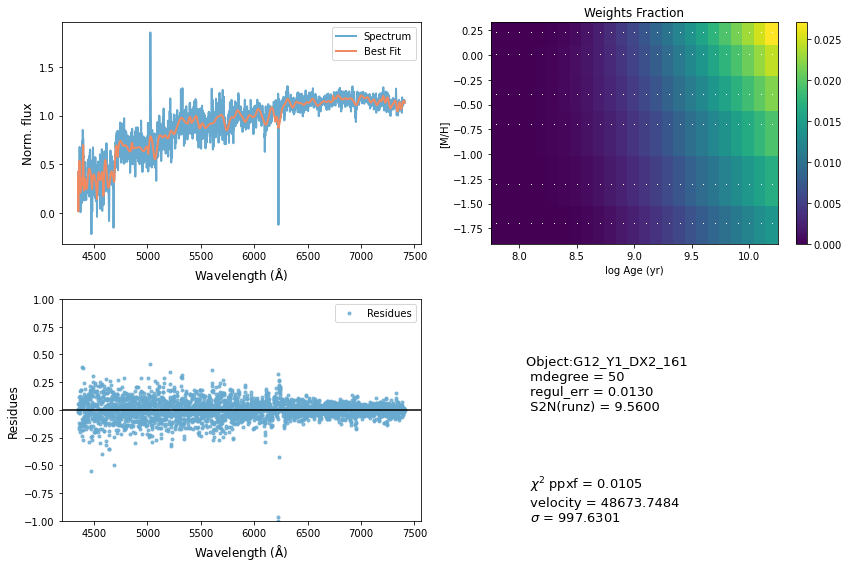

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     29845       739    -0.045     0.072
 comp.  1:     31832       288
 comp.  2:     31890        45
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.002973
method = capfit; Jac calls: 15; Func calls: 907; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  102 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6363       5.7   31832   288
Comp:  2       Unknown     0.4868       2.5   31890    45
Comp:  2       Unknown    0.03723         2   31890    45
Comp:  2       Unknown          0       1.9   31890    45
---------------------------------------------------------
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: -0.523
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: -0.523
M/L_r: 1.489
Current $\chi^2$: 0.0030
Elapsed time in PPXF: 17.19 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


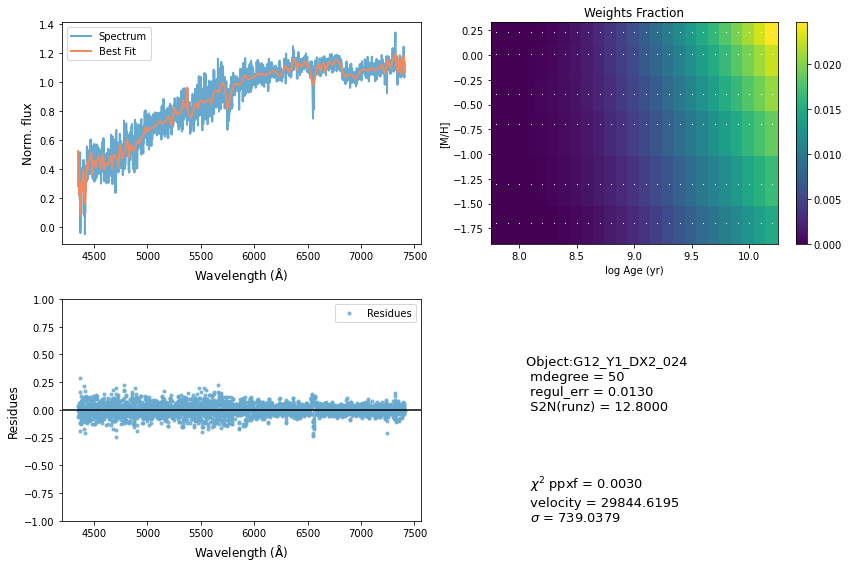

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44231       180     0.000     0.000
 comp.  1:     44231       180
 comp.  2:     44231       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02583
method = capfit; Jac calls: 1; Func calls: 68; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.238       3.8   44231   180
Comp:  2       Unknown    0.05553       4.1   44231   180
Comp:  2       Unknown      0.388       2.7   44231   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0258
Elapsed time in PPXF: 0.97 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


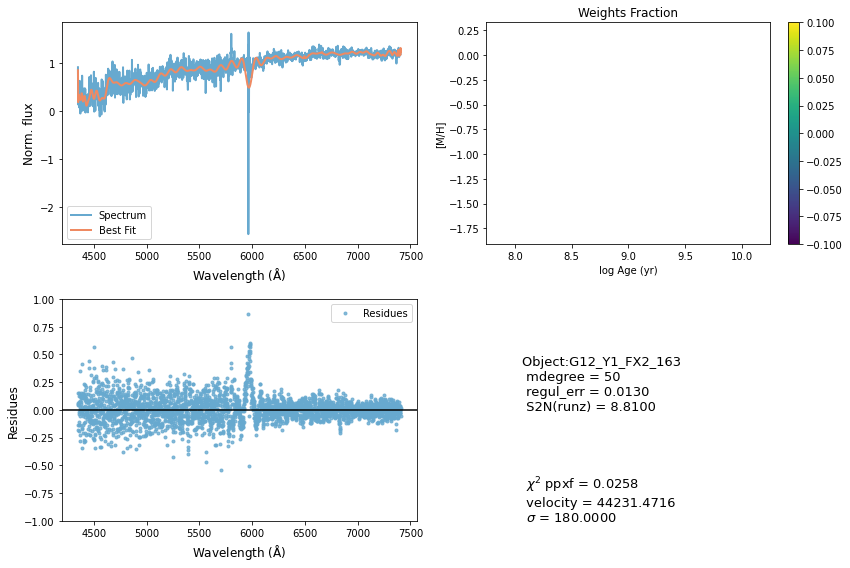

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51067       628     0.217    -0.178
 comp.  1:     50829       218
 comp.  2:     51039       182
Gas Reddening E(B-V): 0.132
chi2/DOF: 0.008022
method = capfit; Jac calls: 14; Func calls: 848; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  72 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.9   50829   218
Comp:  2       Unknown      3.977       6.9   51039   182
Comp:  2       Unknown      4.331       6.7   51039   182
Comp:  2       Unknown     0.2837       4.7   51039   182
---------------------------------------------------------
Weighted <logAge> [yr]: 9.66
Weighted <[M/H]>: -0.192
Weighted <logAge> [yr]: 9.66
Weighted <[M/H]>: -0.192
M/L_r: 1.678
Current $\chi^2$: 0.0080
Elapsed time in PPXF: 17.98 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


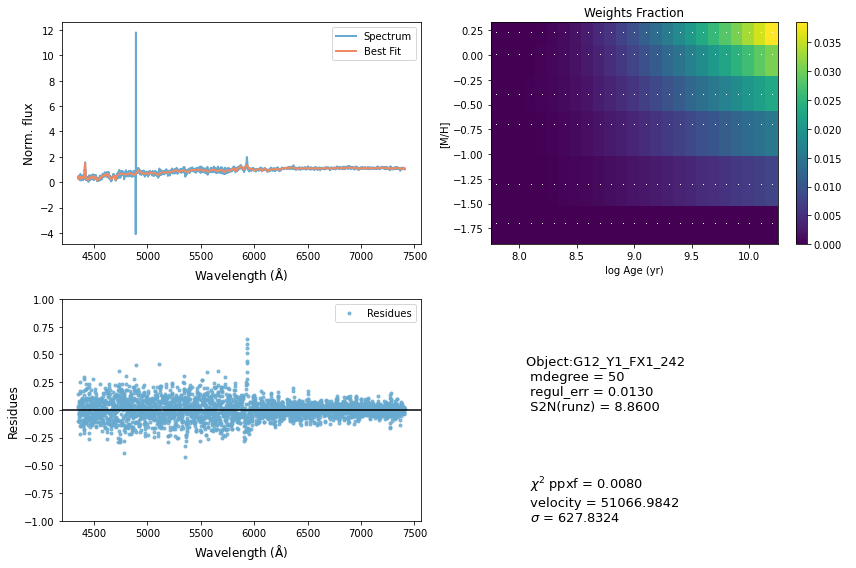

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56447       455     0.009     0.023
 comp.  1:     56339       148
 comp.  2:     56467       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005917
method = capfit; Jac calls: 12; Func calls: 737; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  118 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8317       4.2   56339   148
Comp:  2       Unknown          0       7.2   56467   180
Comp:  2       Unknown          0       7.1   56467   180
Comp:  2       Unknown          0       5.4   56467   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.5
Weighted <[M/H]>: -0.447
Weighted <logAge> [yr]: 8.5
Weighted <[M/H]>: -0.447
M/L_r: 0.2584
Current $\chi^2$: 0.0059
Elapsed time in PPXF: 15.10 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


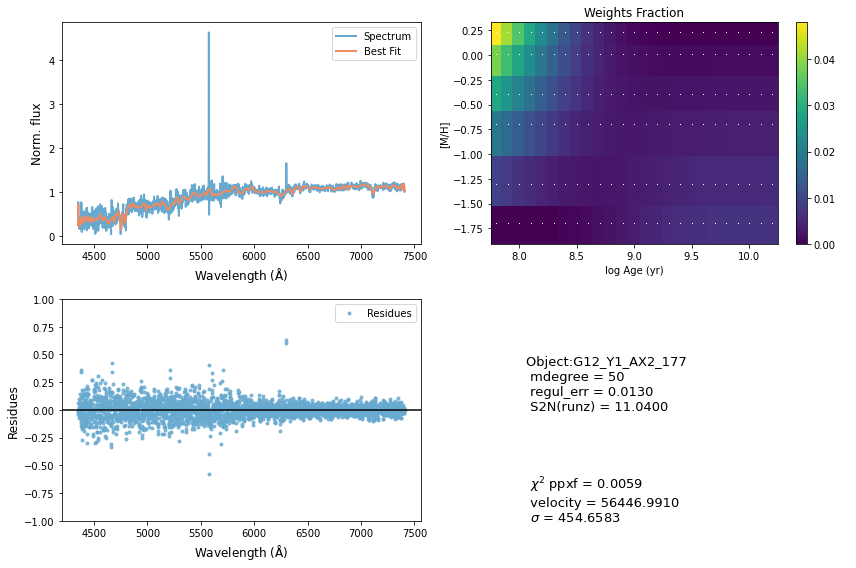

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44009       524     0.043     0.065
 comp.  1:     43978       264
 comp.  2:     43933        99
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01381
method = capfit; Jac calls: 6; Func calls: 372; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  29 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.608       5.7   43978   264
Comp:  2       Unknown          0       3.9   43933    99
Comp:  2       Unknown     0.8199       2.5   43933    99
---------------------------------------------------------
Weighted <logAge> [yr]: 7.97
Weighted <[M/H]>: -1.08
Weighted <logAge> [yr]: 7.97
Weighted <[M/H]>: -1.08
M/L_r: 0.1615
Current $\chi^2$: 0.0138
Elapsed time in PPXF: 7.95 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


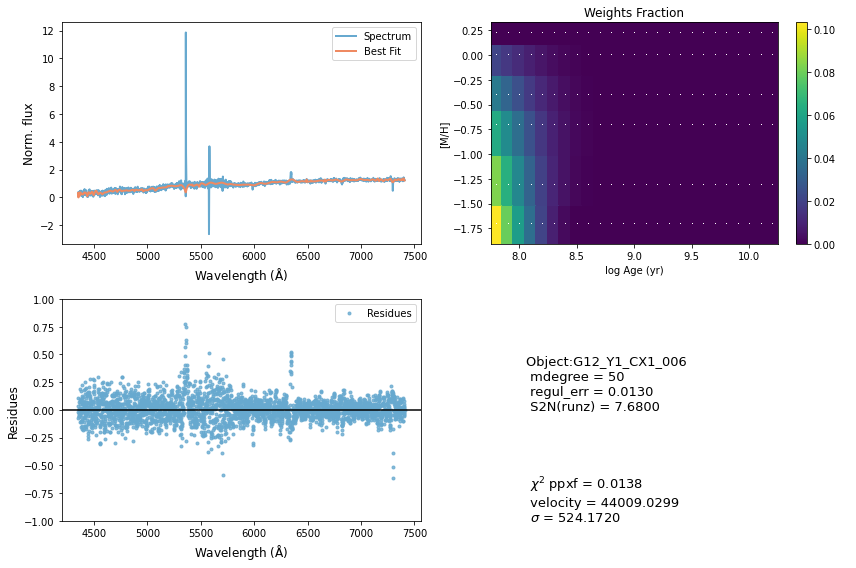

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50777       647     0.002     0.010
 comp.  1:     50975       169
 comp.  2:     51240       120
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003646
method = capfit; Jac calls: 14; Func calls: 853; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  107 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.2   50975   169
Comp:  2       Unknown      1.264       4.7   51240   120
Comp:  2       Unknown      1.121       4.6   51240   120
Comp:  2       Unknown     0.6934       3.8   51240   120
---------------------------------------------------------
Weighted <logAge> [yr]: 9.49
Weighted <[M/H]>: -0.19
Weighted <logAge> [yr]: 9.49
Weighted <[M/H]>: -0.19
M/L_r: 1.088
Current $\chi^2$: 0.0036
Elapsed time in PPXF: 18.35 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


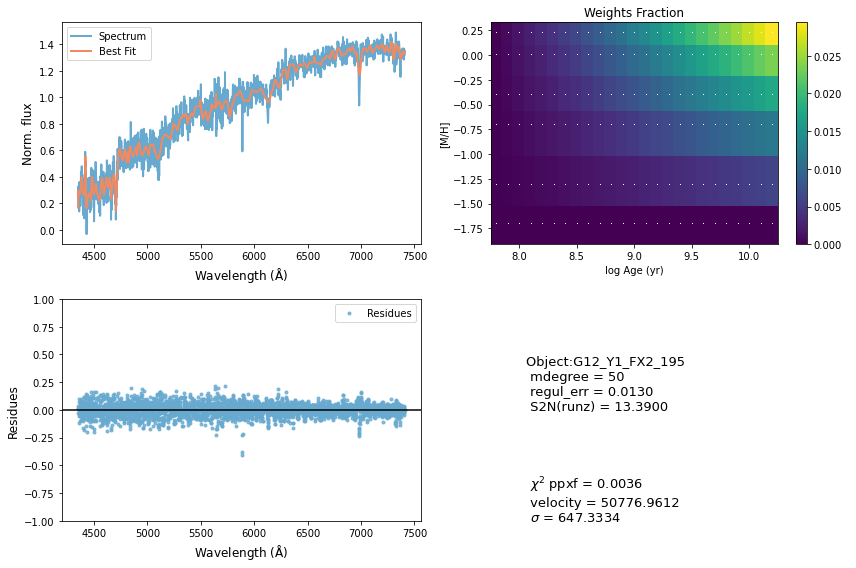

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     21370       440    -0.015    -0.034
 comp.  1:     22516       265
 comp.  2:     22691       812
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003651
method = capfit; Jac calls: 32; Func calls: 1929; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  76 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.273       6.3   22516   265
Comp:  2       Unknown      1.376       8.3   22691   812
Comp:  2       Unknown          0       8.3   22691   812
Comp:  2       Unknown          0       8.1   22691   812
Comp:  2       Unknown       2.04         6   22691   812
Comp:  2       Unknown      2.713       5.7   22691   812
---------------------------------------------------------
Weighted <logAge> [yr]: 9.72
Weighted <[M/H]>: -0.664
Weighted <logAge> [yr]: 9.72
Weighted

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


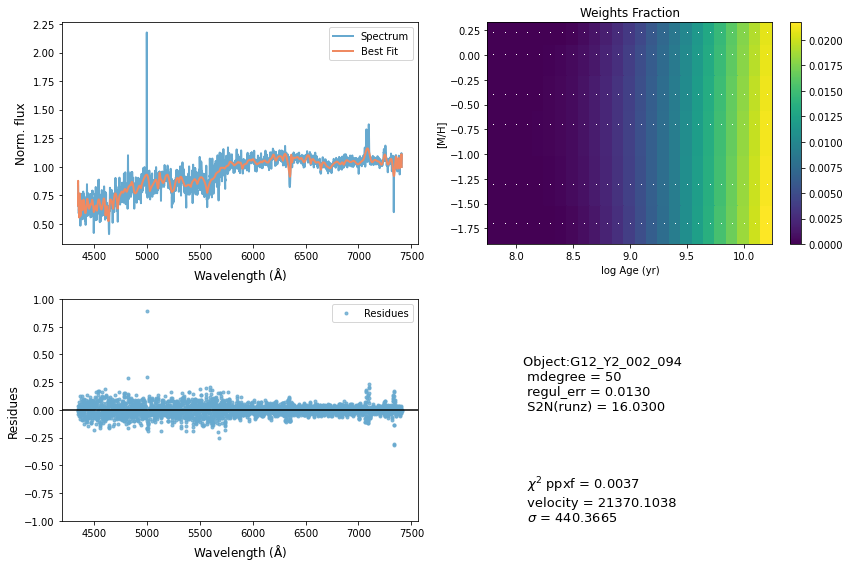

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46542      1000    -0.019    -0.059
 comp.  1:     48266        85
 comp.  2:     48241       470
Gas Reddening E(B-V): 9.211
chi2/DOF: 0.003611
method = capfit; Jac calls: 18; Func calls: 1093; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2345       1.6   48266    85
Comp:  2       Unknown       3381   1.6e+02   48241   470
Comp:  2       Unknown       3537   1.7e+02   48241   470
Comp:  2       Unknown          0       7.7   48241   470
Comp:  2       Unknown      1.226       5.1   48241   470
---------------------------------------------------------
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -0.358
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -0.358
M/L_r: 1.464
Current $\chi^2$: 0.0036
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


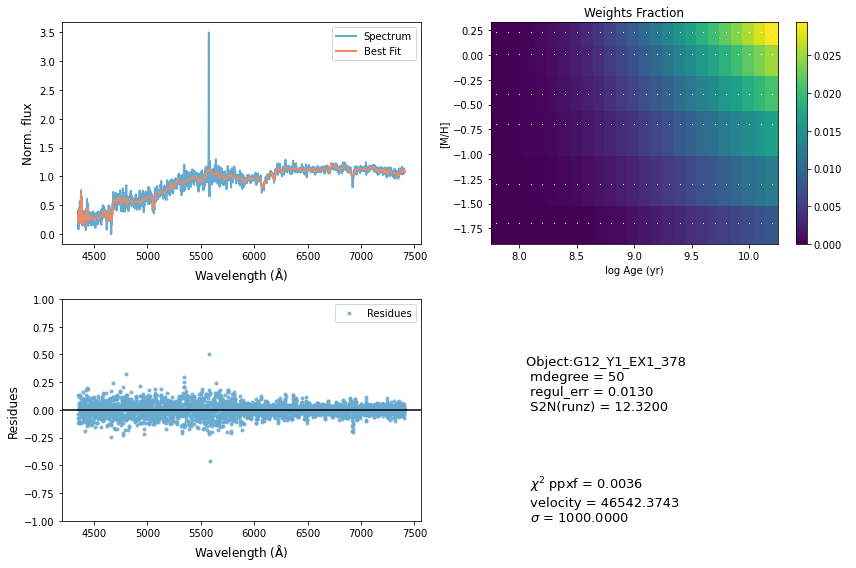

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51329       750    -0.057     0.045
 comp.  1:     51068       181
 comp.  2:     51283       169
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00395
method = capfit; Jac calls: 15; Func calls: 913; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  82 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1799       4.1   51068   181
Comp:  2       Unknown          0       5.6   51283   169
Comp:  2       Unknown      1.913       5.7   51283   169
Comp:  2       Unknown      1.079       4.6   51283   169
---------------------------------------------------------
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.388
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.388
M/L_r: 1.997
Current $\chi^2$: 0.0040
Elapsed time in PPXF: 20.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


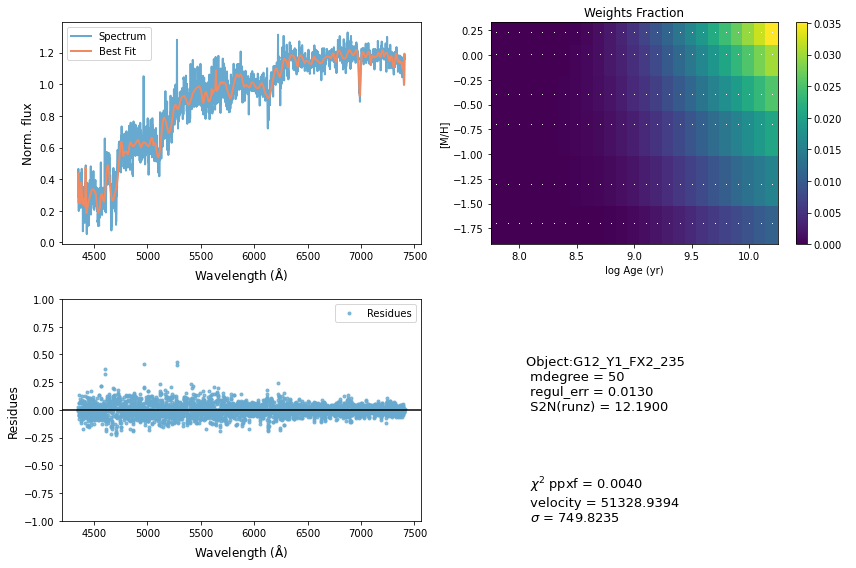

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72863       407    -0.002    -0.001
 comp.  1:     72745      1000
 comp.  2:     73015         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.008906
method = capfit; Jac calls: 11; Func calls: 669; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      12.04       8.3   72745  1000
Comp:  2       Unknown          0       2.9   73015     1
Comp:  2       Unknown       1.07         3   73015     1
Comp:  2       Unknown     0.2633       1.8   73015     1
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0089
Elapsed time in PPXF: 8.71 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


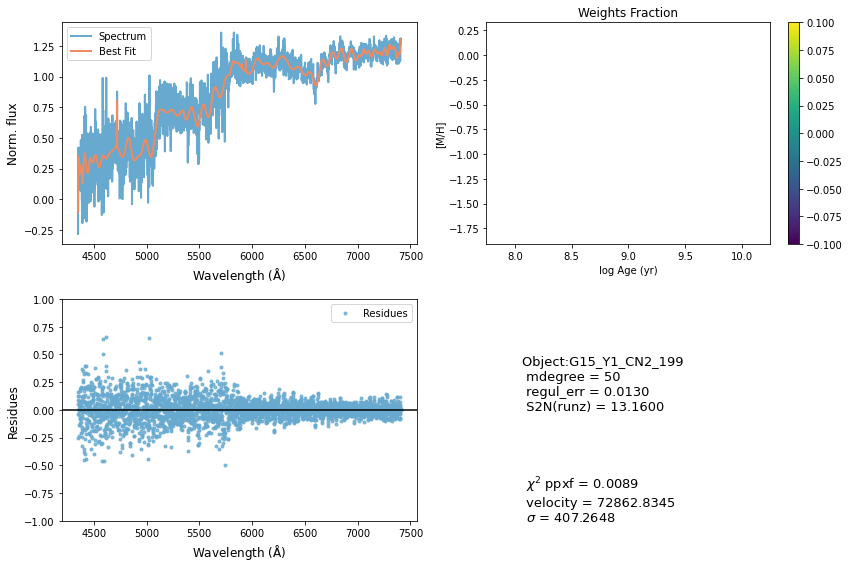

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48325      1000    -0.024    -0.024
 comp.  1:     46325       180
 comp.  2:     46349       179
Gas Reddening E(B-V): 4.851
chi2/DOF: 0.003255
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.9   46325   180
Comp:  2       Unknown          0       4.9   46349   179
Comp:  2       Unknown    0.02602       4.5   46349   179
Comp:  2       Unknown          0       2.5   46349   179
---------------------------------------------------------
Weighted <logAge> [yr]: 8.16
Weighted <[M/H]>: -0.178
Weighted <logAge> [yr]: 8.16
Weighted <[M/H]>: -0.178
M/L_r: 0.2235
Current $\chi^2$: 0.0033
Elapsed time in PPXF: 0.79 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


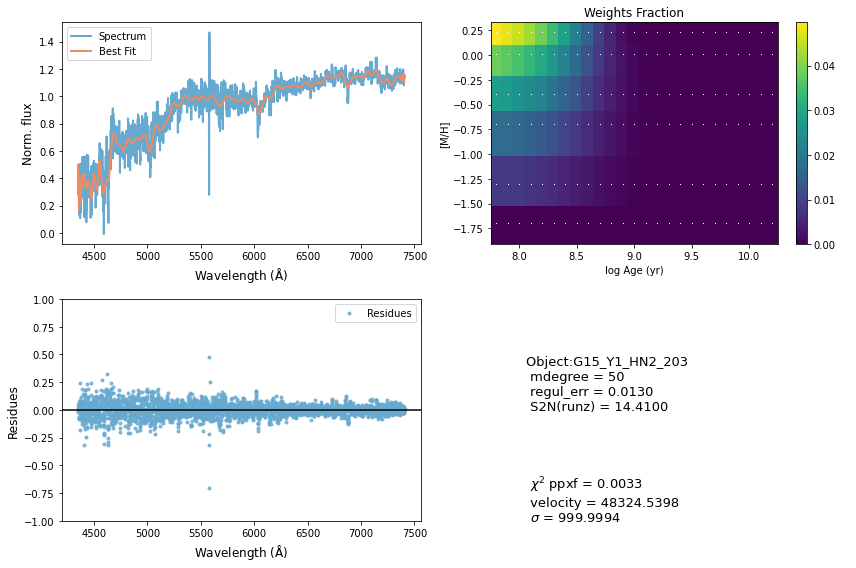

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59538       728    -0.011    -0.021
 comp.  1:     59441       524
 comp.  2:     59999        54
Gas Reddening E(B-V): 0.059
chi2/DOF: 0.01019
method = capfit; Jac calls: 22; Func calls: 1324; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  91 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      12.13       8.6   59441   524
Comp:  2       Unknown          0       2.8   59999    54
Comp:  2       Unknown          0       2.8   59999    54
Comp:  2       Unknown     0.6718       2.8   59999    54
---------------------------------------------------------
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.406
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.406
M/L_r: 1.73
Current $\chi^2$: 0.0102
Elapsed time in PPXF: 27.09 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


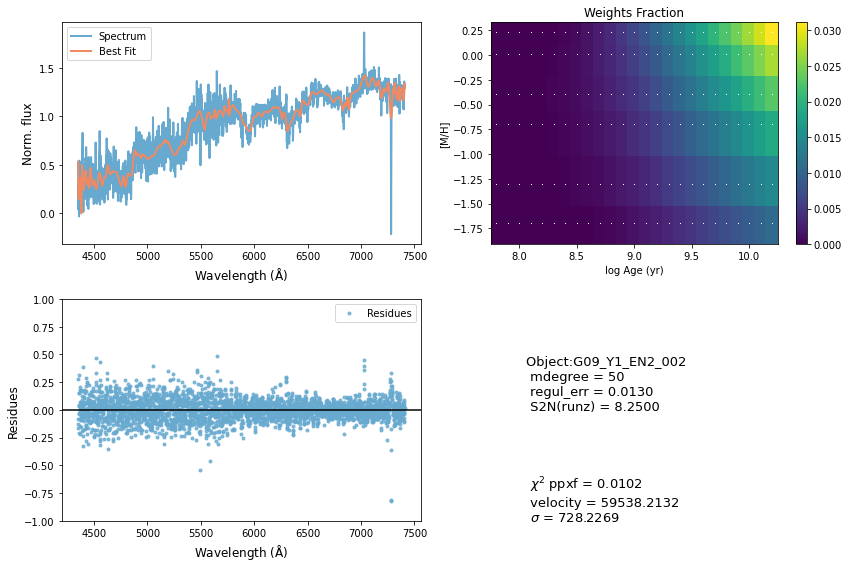

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35808      1000     0.101    -0.099
 comp.  1:     35241       104
 comp.  2:     35016       234
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.002368
method = capfit; Jac calls: 33; Func calls: 1991; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  129 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8375       3.2   35241   104
Comp:  2       Unknown          0       4.5   35016   234
Comp:  2       Unknown          0       3.5   35016   234
Comp:  2       Unknown     0.7279       3.2   35016   234
---------------------------------------------------------
Weighted <logAge> [yr]: 9.18
Weighted <[M/H]>: -1.03
Weighted <logAge> [yr]: 9.18
Weighted <[M/H]>: -1.03
M/L_r: 0.4628
Current $\chi^2$: 0.0024
Elapsed time in PPXF: 37.51 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


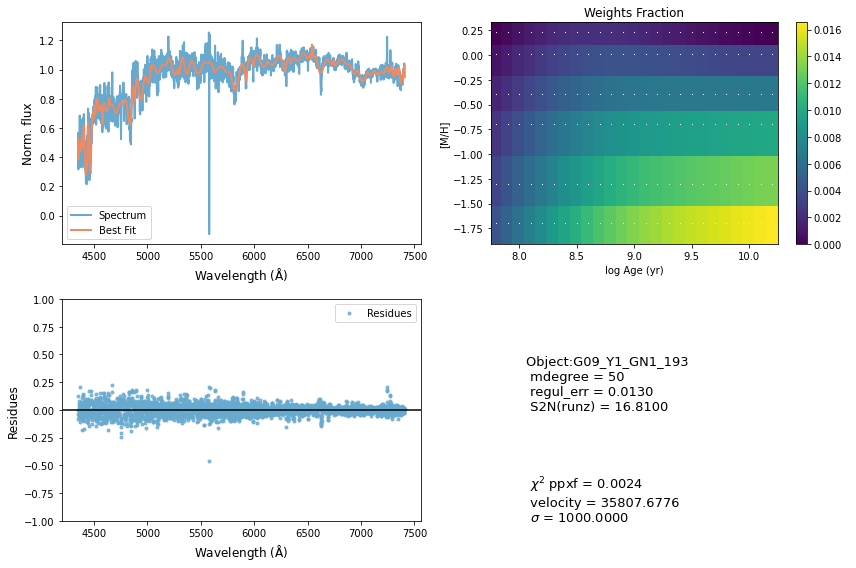

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48197       926    -0.076    -0.011
 comp.  1:     46367       252
 comp.  2:     46195        76
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.006277
method = capfit; Jac calls: 15; Func calls: 909; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8401       2.3   46367   252
Comp:  2       Unknown      0.166       1.3   46195    76
Comp:  2       Unknown          0       2.8   46195    76
Comp:  2       Unknown          0       1.9   46195    76
---------------------------------------------------------
Weighted <logAge> [yr]: 8.14
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 8.14
Weighted <[M/H]>: -1.1
M/L_r: 0.1769
Current $\chi^2$: 0.0063
Elapsed time in PPXF: 18.20 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


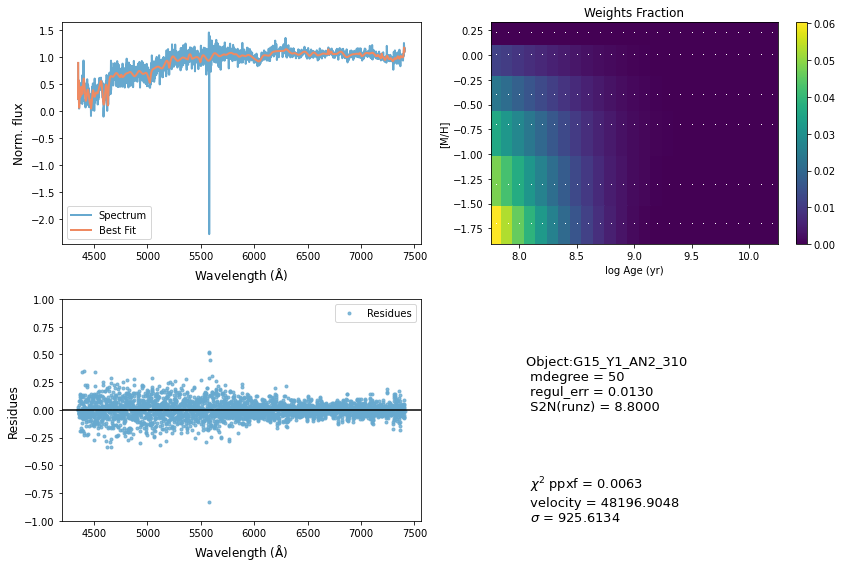

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38088       424     0.022    -0.005
 comp.  1:     36347       608
 comp.  2:     36611        64
Gas Reddening E(B-V): 4.774
chi2/DOF: 0.04804
method = capfit; Jac calls: 10; Func calls: 614; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.919       4.7   36347   608
Comp:  2       Unknown      2.269       2.6   36611    64
Comp:  2       Unknown          0         2   36611    64
---------------------------------------------------------
Weighted <logAge> [yr]: 8.02
Weighted <[M/H]>: -1.09
Weighted <logAge> [yr]: 8.02
Weighted <[M/H]>: -1.09
M/L_r: 0.1651
Current $\chi^2$: 0.0480
Elapsed time in PPXF: 12.88 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


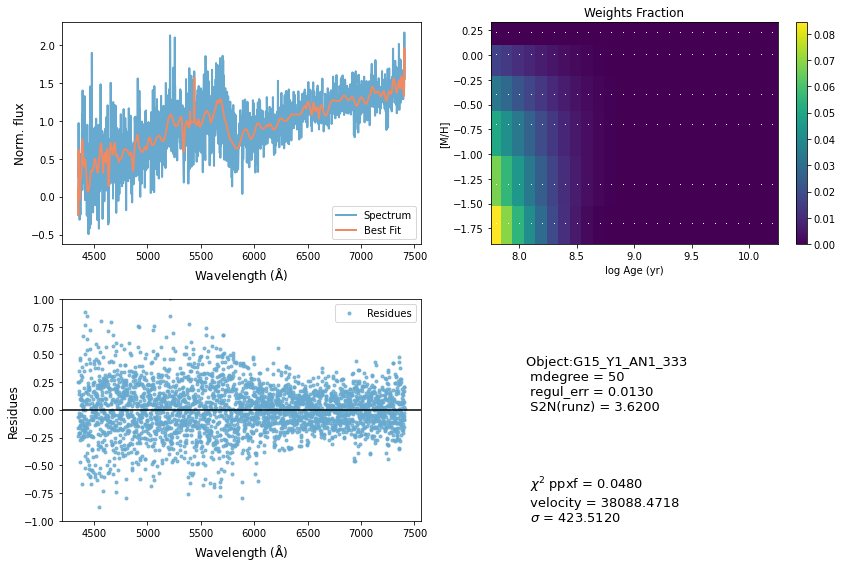

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44495       872    -0.104    -0.088
 comp.  1:     45771       416
 comp.  2:     46019       180
Gas Reddening E(B-V): 9.937
chi2/DOF: 0.00286
method = capfit; Jac calls: 10; Func calls: 612; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7584       3.4   45771   416
Comp:  2       Unknown          0         4   46019   180
Comp:  2       Unknown          0       3.2   46019   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.316
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.316
M/L_r: 1.831
Current $\chi^2$: 0.0029
Elapsed time in PPXF: 14.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


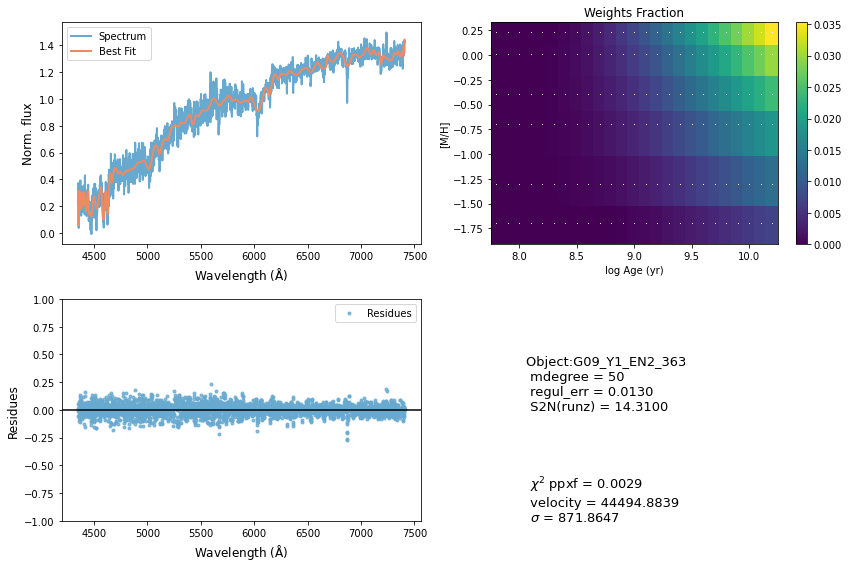

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41427       234    -0.004     0.019
 comp.  1:     41431       265
 comp.  2:     41258       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009461
method = capfit; Jac calls: 14; Func calls: 850; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  83 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      7.465       4.8   41431   265
Comp:  2       Unknown          0         4   41258   180
Comp:  2       Unknown          0       2.8   41258   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -1.11
M/L_r: 1.088
Current $\chi^2$: 0.0095
Elapsed time in PPXF: 18.90 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


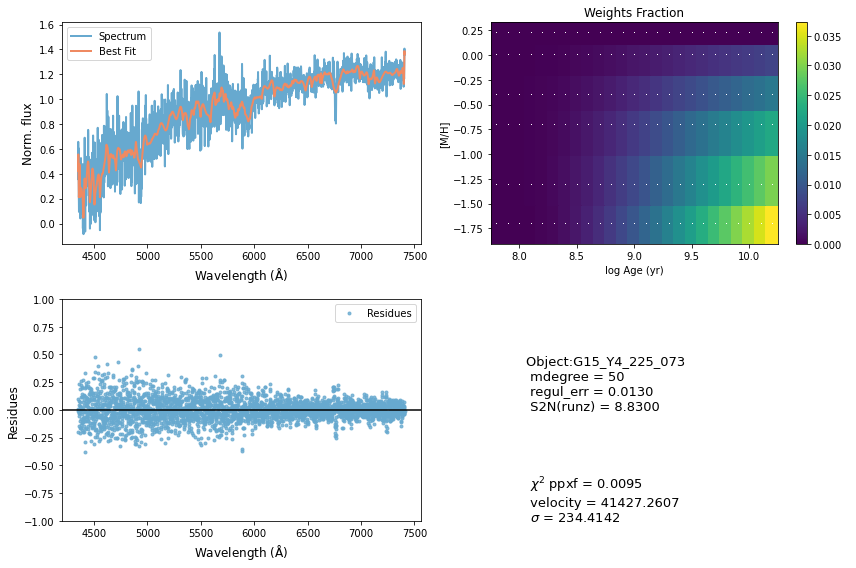

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     26972       323     0.025     0.062
 comp.  1:     26979       479
 comp.  2:     26911        70
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.008635
method = capfit; Jac calls: 15; Func calls: 913; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      13.32       3.4   26979   479
Comp:  2       Unknown          0       1.4   26911    70
Comp:  2       Unknown     0.1962       1.5   26911    70
Comp:  2       Unknown     0.2641       2.6   26911    70
Comp:  2       Unknown     0.8122       2.4   26911    70
Comp:  2       Unknown     0.0731       1.7   26911    70
---------------------------------------------------------
Weighted <logAge> [yr]: 8.09
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 8.09
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


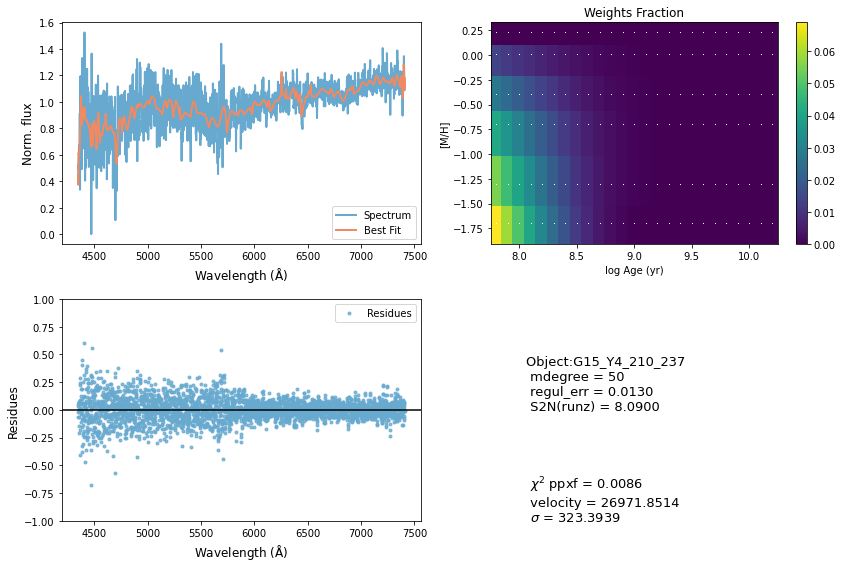

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36555         1     0.011     0.011
 comp.  1:     34555       180
 comp.  2:     34549       122
Gas Reddening E(B-V): 9.418
chi2/DOF: 0.00581
method = capfit; Jac calls: 5; Func calls: 309; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.4   34555   180
Comp:  2       Unknown     0.8055       3.1   34549   122
Comp:  2       Unknown          0       3.4   34549   122
Comp:  2       Unknown          0       2.3   34549   122
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0058
Elapsed time in PPXF: 4.72 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


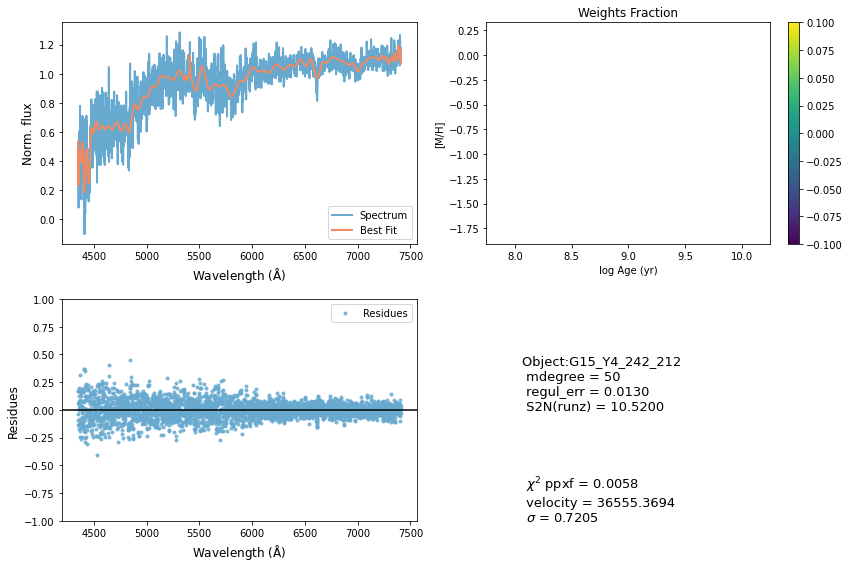

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     75486      1000     0.065    -0.076
 comp.  1:     77880        90
 comp.  2:     77339         1
Gas Reddening E(B-V): 3.602
chi2/DOF: 0.0485
method = capfit; Jac calls: 15; Func calls: 910; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7713       1.6   77880    90
Comp:  2       Unknown          0       2.2   77339     1
Comp:  2       Unknown      1.179       2.3   77339     1
Comp:  2       Unknown          0       1.8   77339     1
---------------------------------------------------------
Weighted <logAge> [yr]: 8.13
Weighted <[M/H]>: -1.01
Weighted <logAge> [yr]: 8.13
Weighted <[M/H]>: -1.01
M/L_r: 0.1783
Current $\chi^2$: 0.0485
Elapsed time in PPXF: 18.43 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


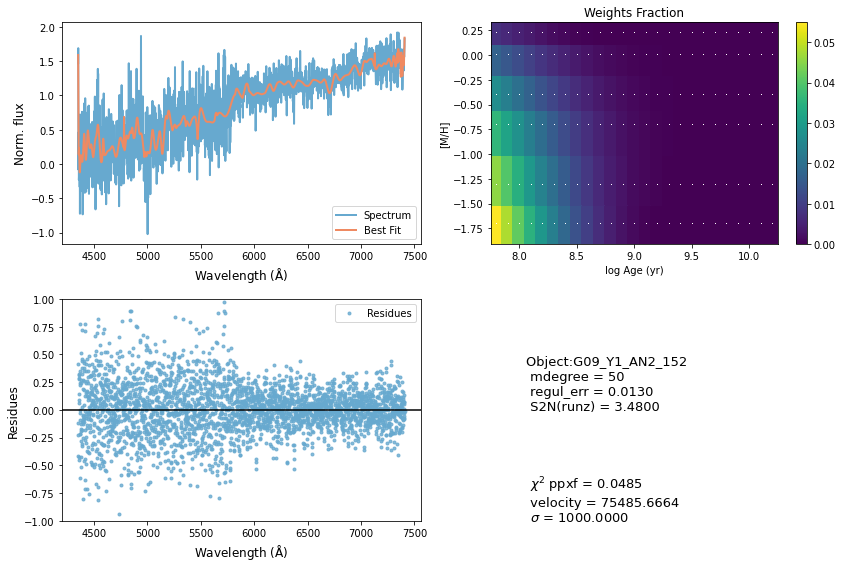

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51778       662     0.059     0.076
 comp.  1:     51669       102
 comp.  2:     51760        96
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.008354
method = capfit; Jac calls: 19; Func calls: 1150; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  111 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.937       3.1   51669   102
Comp:  2       Unknown          0       4.8   51760    96
Comp:  2       Unknown      2.655         5   51760    96
Comp:  2       Unknown          0       3.5   51760    96
---------------------------------------------------------
Weighted <logAge> [yr]: 9.1
Weighted <[M/H]>: -0.188
Weighted <logAge> [yr]: 9.1
Weighted <[M/H]>: -0.188
M/L_r: 0.5343
Current $\chi^2$: 0.0084
Elapsed time in PPXF: 26.01 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


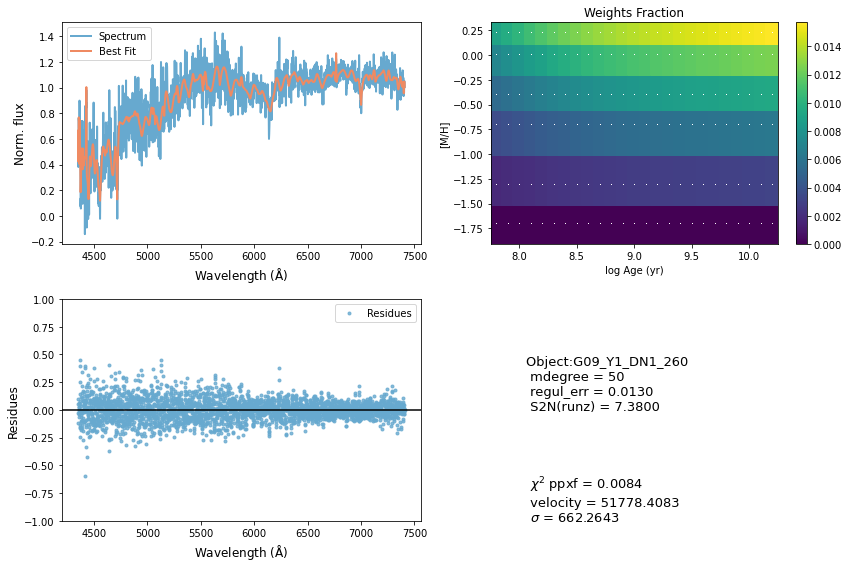

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54799       131    -0.001    -0.001
 comp.  1:     54917        58
 comp.  2:     55085       124
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008504
method = capfit; Jac calls: 9; Func calls: 553; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  74 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9614       2.6   54917    58
Comp:  2       Unknown          0       4.6   55085   124
Comp:  2       Unknown          0       4.5   55085   124
Comp:  2       Unknown      1.069       5.3   55085   124
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.847
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.847
M/L_r: 1.89
Current $\chi^2$: 0.0085
Elapsed time in PPXF: 11.17 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


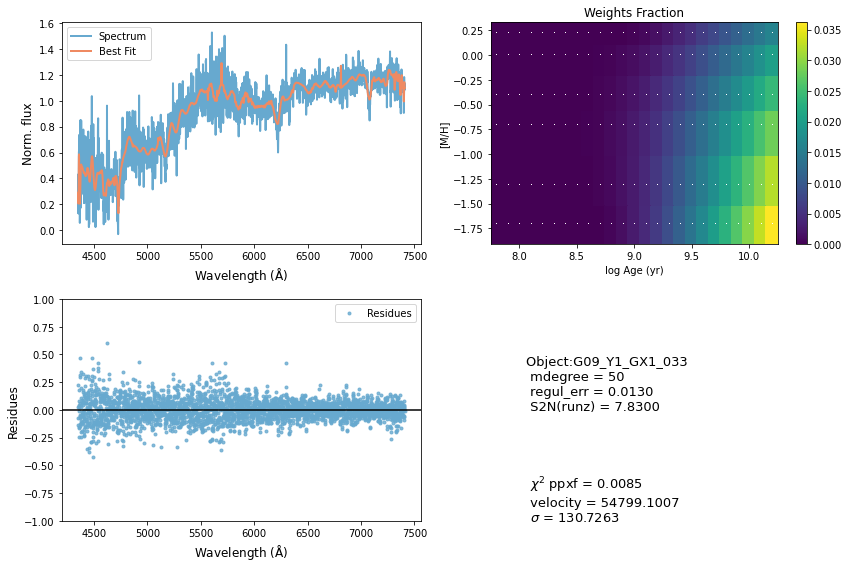

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53631       185    -0.026    -0.026
 comp.  1:     53628       180
 comp.  2:     53621       204
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.002657
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.01105       2.3   53628   180
Comp:  2       Unknown          0     3e+02   53621   204
Comp:  2       Unknown     0.2828     3e+02   53621   204
Comp:  2       Unknown     0.3022       5.7   53621   204
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0027
Elapsed time in PPXF: 0.76 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


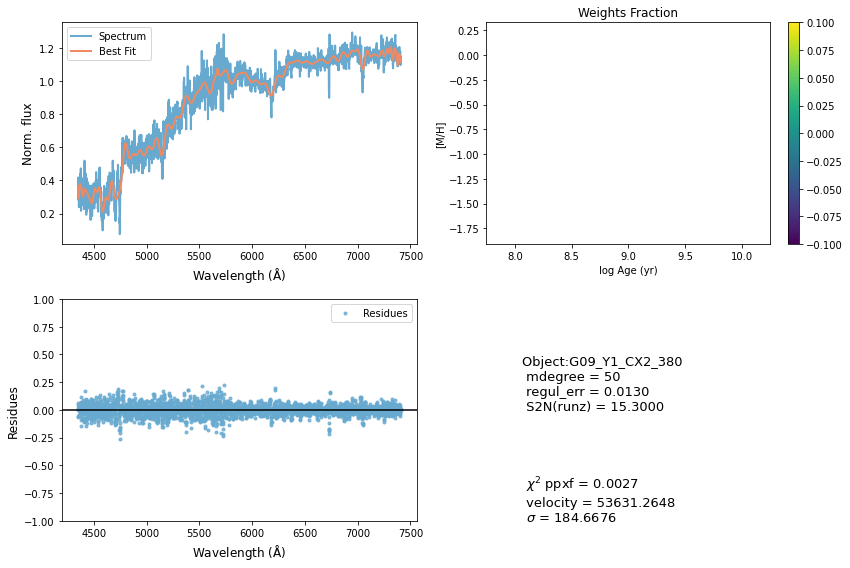

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56701       429     0.140     0.107
 comp.  1:     56591       295
 comp.  2:     56812       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003714
method = capfit; Jac calls: 9; Func calls: 549; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  49 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.261       6.4   56591   295
Comp:  2       Unknown          0       5.6   56812   180
Comp:  2       Unknown          0       5.6   56812   180
Comp:  2       Unknown          0       5.6   56812   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.13
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 8.13
Weighted <[M/H]>: -1.11
M/L_r: 0.1757
Current $\chi^2$: 0.0037
Elapsed time in PPXF: 10.56 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


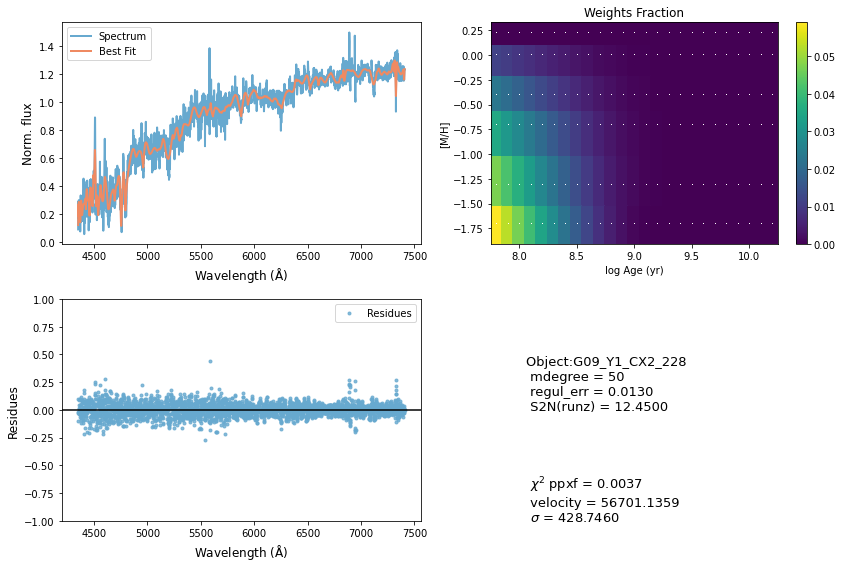

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74700       251    -0.001     0.005
 comp.  1:     74589       476
 comp.  2:     74669        38
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02442
method = capfit; Jac calls: 13; Func calls: 791; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  26 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.311       5.8   74589   476
Comp:  2       Unknown          0       3.1   74669    38
Comp:  2       Unknown      1.191       3.8   74669    38
Comp:  2       Unknown          0       1.8   74669    38
---------------------------------------------------------
Weighted <logAge> [yr]: 8.06
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 8.06
Weighted <[M/H]>: -1.11
M/L_r: 0.1681
Current $\chi^2$: 0.0244
Elapsed time in PPXF: 17.88 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


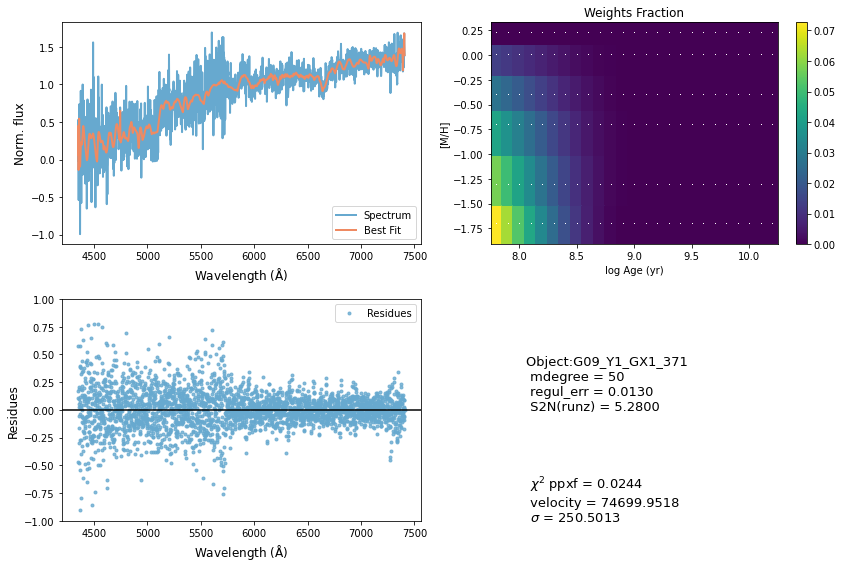

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     18548       550     0.086    -0.194
 comp.  1:     19060       502
 comp.  2:     19591       398
Gas Reddening E(B-V): 4.191
chi2/DOF: 0.002263
method = capfit; Jac calls: 17; Func calls: 1033; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown        6.5       4.8   19060   502
Comp:  2       Unknown     0.3402       4.5   19591   398
Comp:  2       Unknown          0       4.4   19591   398
Comp:  2       Unknown          0       5.4   19591   398
Comp:  2       Unknown     0.7655       5.4   19591   398
Comp:  2       Unknown       2.06       5.3   19591   398
---------------------------------------------------------
Weighted <logAge> [yr]: 8.2
Weighted <[M/H]>: -0.86
Weighted <logAge> [yr]: 8.2
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


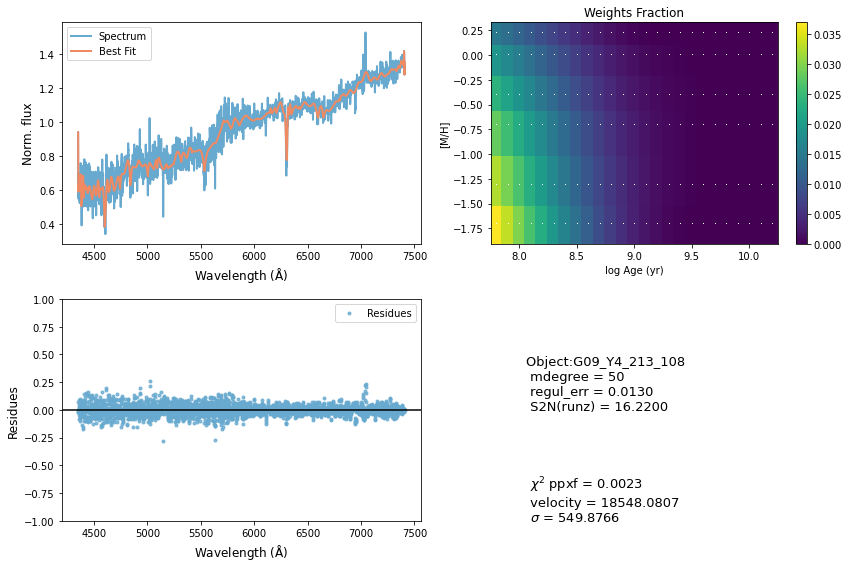

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45922       741     0.041    -0.244
 comp.  1:     47892         1
 comp.  2:     47170       531
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.001766
method = capfit; Jac calls: 15; Func calls: 913; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.02988       1.6   47892     1
Comp:  2       Unknown  4.099e+04   8.2e+02   47170   531
Comp:  2       Unknown  4.133e+04   8.3e+02   47170   531
Comp:  2       Unknown          0       6.8   47170   531
Comp:  2       Unknown      1.613       6.8   47170   531
---------------------------------------------------------
Weighted <logAge> [yr]: 9.03
Weighted <[M/H]>: -0.189
Weighted <logAge> [yr]: 9.03
Weighted <[M/H]>: -0.189
M/L_r: 0.4742
Current $\chi^2$: 0.0018
Ela

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


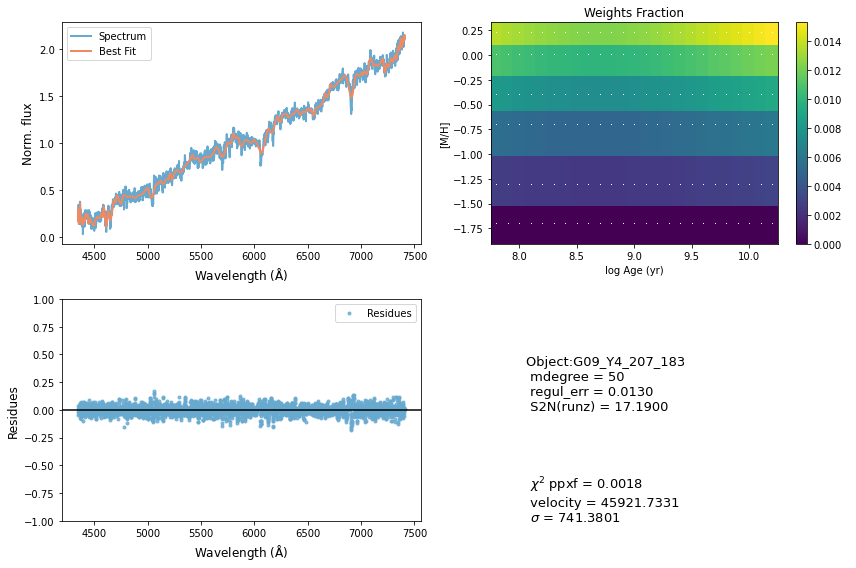

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38278       456    -0.021     0.059
 comp.  1:     38358       656
 comp.  2:     38515       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003692
method = capfit; Jac calls: 16; Func calls: 970; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  95 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      15.12       8.3   38358   656
Comp:  2       Unknown          0         4   38515   180
Comp:  2       Unknown     0.1287         3   38515   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -0.342
Weighted <logAge> [yr]: 9.64
Weighted <[M/H]>: -0.342
M/L_r: 1.48
Current $\chi^2$: 0.0037
Elapsed time in PPXF: 21.26 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


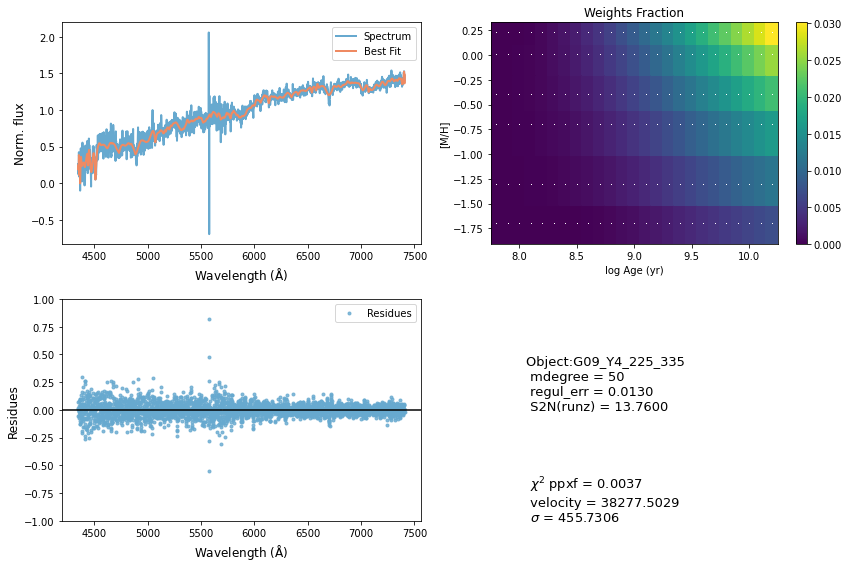

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43409       413     0.018     0.051
 comp.  1:     43535       213
 comp.  2:     43672       110
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01622
method = capfit; Jac calls: 9; Func calls: 552; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  80 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.455       3.9   43535   213
Comp:  2       Unknown     0.7267       3.4   43672   110
Comp:  2       Unknown      0.802       1.9   43672   110
---------------------------------------------------------
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -1.11
M/L_r: 1.072
Current $\chi^2$: 0.0162
Elapsed time in PPXF: 9.86 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


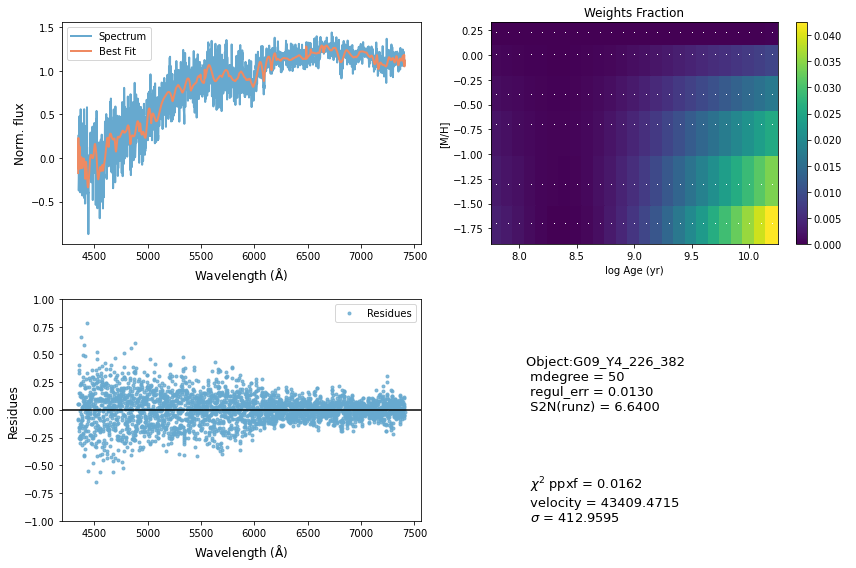

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60780       272    -0.094     0.019
 comp.  1:     60934       149
 comp.  2:     60746       189
Gas Reddening E(B-V): 9.791
chi2/DOF: 0.01374
method = capfit; Jac calls: 12; Func calls: 728; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6298       1.8   60934   149
Comp:  2       Unknown          0   1.7e+02   60746   189
Comp:  2       Unknown      0.683   1.8e+02   60746   189
Comp:  2       Unknown          0       4.1   60746   189
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.327
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.327
M/L_r: 2.545
Current $\chi^2$: 0.0137
Elapsed time in PPXF: 14.47 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


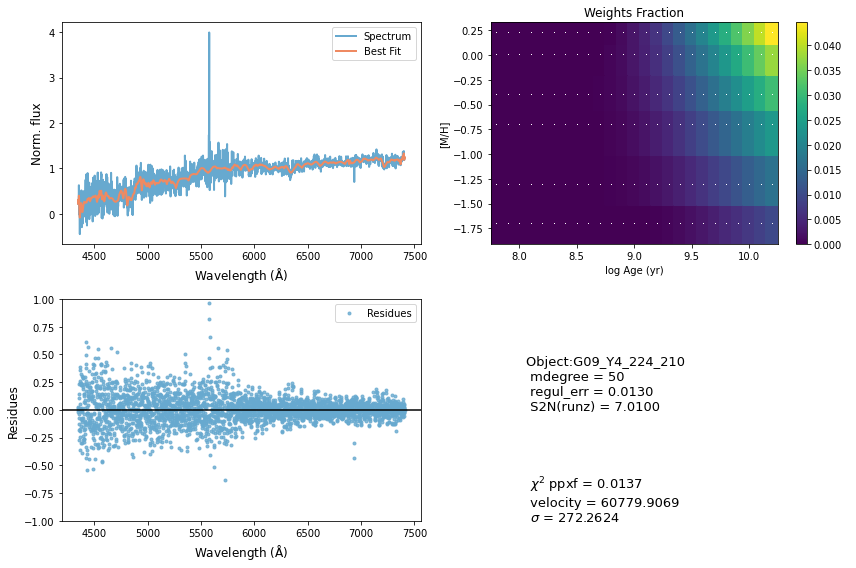

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43005       173    -0.034    -0.034
 comp.  1:     42998       180
 comp.  2:     43019       302
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.0027
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  10 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.06035       3.9   42998   180
Comp:  2       Unknown          0       5.2   43019   302
Comp:  2       Unknown     0.2393       3.4   43019   302
---------------------------------------------------------
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.34
Weighted <logAge> [yr]: 7.88
Weighted <[M/H]>: -1.34
M/L_r: 0.1581
Current $\chi^2$: 0.0027
Elapsed time in PPXF: 0.89 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


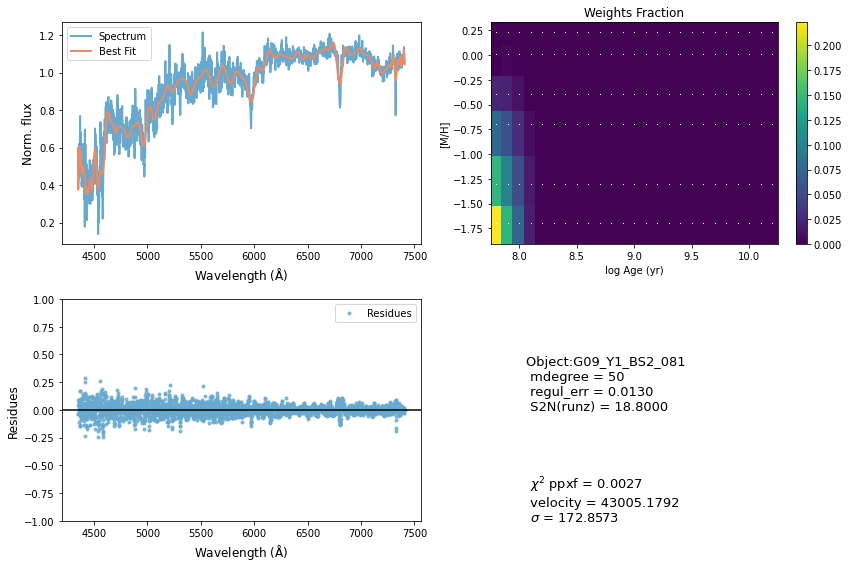

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45406       978     0.028    -0.105
 comp.  1:     47259        79
 comp.  2:     47730       315
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005374
method = capfit; Jac calls: 19; Func calls: 1151; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  53 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.8   47259    79
Comp:  2       Unknown      35.37        15   47730   315
Comp:  2       Unknown     0.2549        14   47730   315
Comp:  2       Unknown      1.323       5.5   47730   315
Comp:  2       Unknown          0       3.6   47730   315
---------------------------------------------------------
Weighted <logAge> [yr]: 9.5
Weighted <[M/H]>: -0.241
Weighted <logAge> [yr]: 9.5
Weighted <[M/H]>: -0.241
M/L_r: 1.091
Current $\chi^2$: 0.0054
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


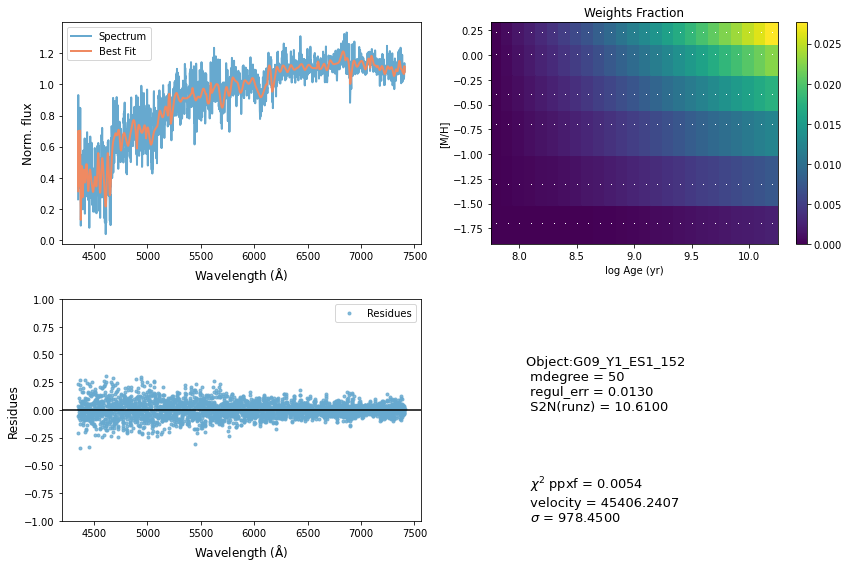

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68731       744    -0.149     0.218
 comp.  1:     69002       202
 comp.  2:     69196        45
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.005158
method = capfit; Jac calls: 18; Func calls: 1090; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.137         2   69002   202
Comp:  2       Unknown  0.0003226     0.041   69196    45
Comp:  2       Unknown          0       0.1   69196    45
Comp:  2       Unknown     0.4653       3.1   69196    45
---------------------------------------------------------
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.345
Weighted <logAge> [yr]: 9.76
Weighted <[M/H]>: -0.345
M/L_r: 2.082
Current $\chi^2$: 0.0052
Elapsed time in PPXF: 21.29 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


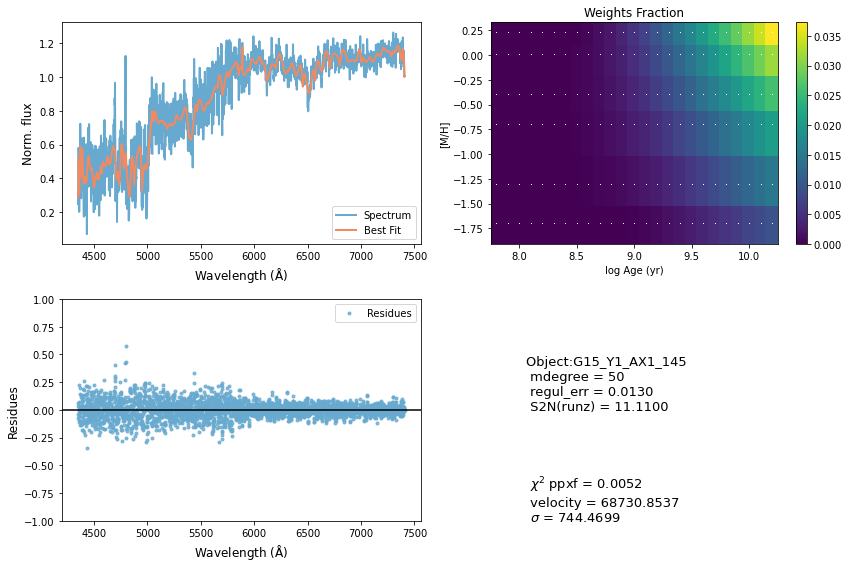

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     25882       381     0.105     0.174
 comp.  1:     25914       481
 comp.  2:     25880       425
Gas Reddening E(B-V): 6.530
chi2/DOF: 0.003066
method = capfit; Jac calls: 19; Func calls: 1153; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.94       4.4   25914   481
Comp:  2       Unknown     0.4005       4.5   25880   425
Comp:  2       Unknown     0.2177       4.2   25880   425
Comp:  2       Unknown     0.5178       5.6   25880   425
Comp:  2       Unknown      1.931       5.4   25880   425
Comp:  2       Unknown          0       4.9   25880   425
---------------------------------------------------------
Weighted <logAge> [yr]: 8.5
Weighted <[M/H]>: -0.543
Weighted <logAge> [yr]: 8.5
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


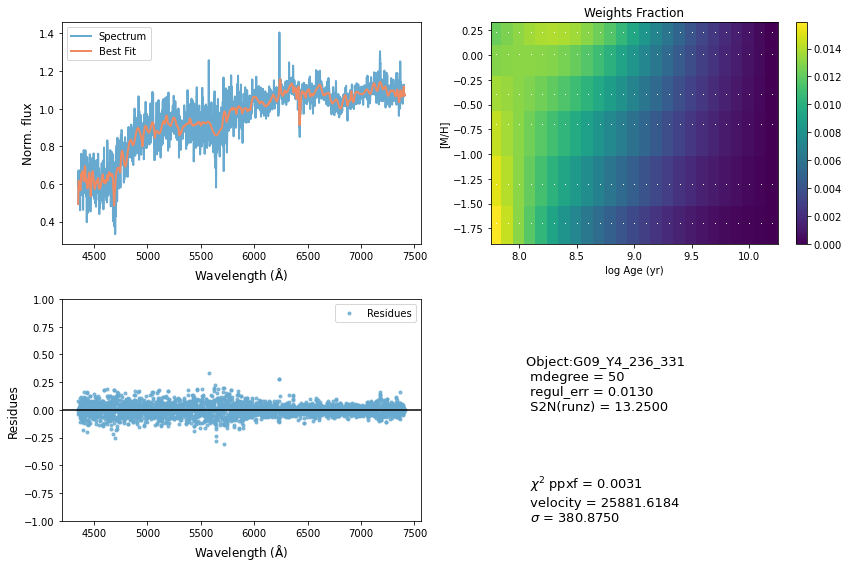

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     69889       180     0.000     0.000
 comp.  1:     69889       180
 comp.  2:     69889       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006097
method = capfit; Jac calls: 1; Func calls: 64; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  21 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4296       5.3   69889   180
Comp:  2       Unknown          0       5.7   69889   180
Comp:  2       Unknown          0       5.7   69889   180
Comp:  2       Unknown          0       3.4   69889   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.58
Weighted <[M/H]>: -0.0112
Weighted <logAge> [yr]: 8.58
Weighted <[M/H]>: -0.0112
M/L_r: 0.4228
Current $\chi^2$: 0.0061
Elapsed time in PPXF: 1.32 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


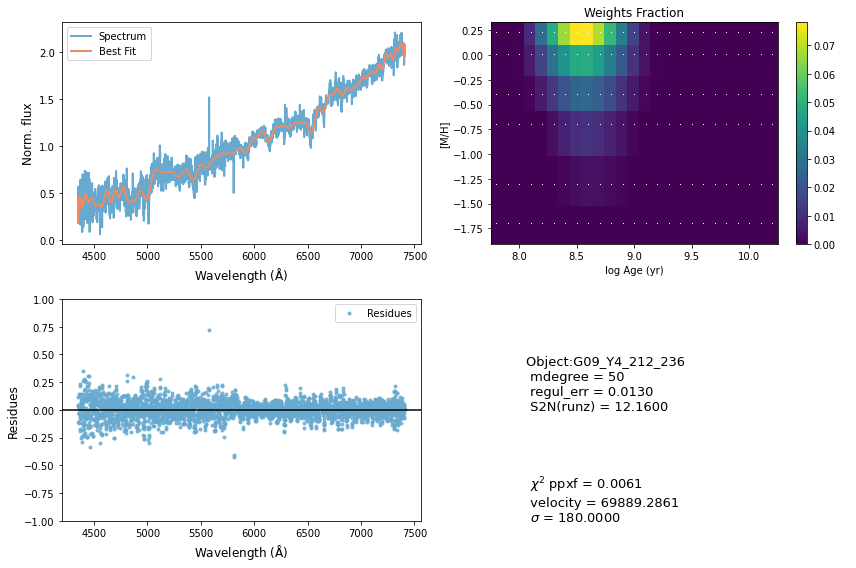

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55615       649    -0.016     0.002
 comp.  1:     53637       120
 comp.  2:     54064       178
Gas Reddening E(B-V): 0.083
chi2/DOF: 0.005425
method = capfit; Jac calls: 15; Func calls: 907; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  67 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1678       2.9   53637   120
Comp:  2       Unknown      5.743       8.1   54064   178
Comp:  2       Unknown      1.846       7.9   54064   178
Comp:  2       Unknown          0       5.5   54064   178
---------------------------------------------------------
Weighted <logAge> [yr]: 9.37
Weighted <[M/H]>: -1.05
Weighted <logAge> [yr]: 9.37
Weighted <[M/H]>: -1.05
M/L_r: 0.6204
Current $\chi^2$: 0.0054
Elapsed time in PPXF: 20.22 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


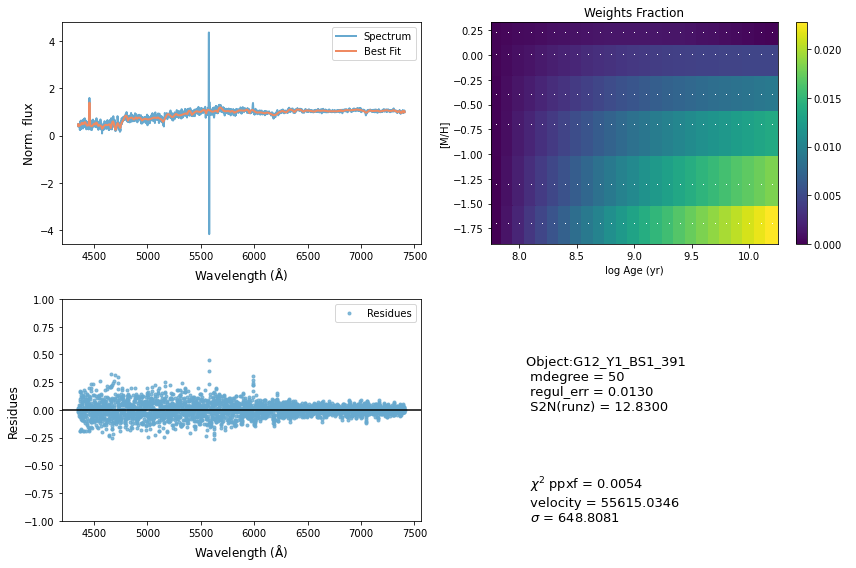

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42357       745    -0.043     0.027
 comp.  1:     42471       660
 comp.  2:     42848        15
Gas Reddening E(B-V): 1.006
chi2/DOF: 0.01516
method = capfit; Jac calls: 15; Func calls: 909; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       19.2       4.7   42471   660
Comp:  2       Unknown     0.5068       2.2   42848    15
Comp:  2       Unknown          0       1.3   42848    15
---------------------------------------------------------
Weighted <logAge> [yr]: 8.96
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 8.96
Weighted <[M/H]>: -1.11
M/L_r: 0.3285
Current $\chi^2$: 0.0152
Elapsed time in PPXF: 19.10 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


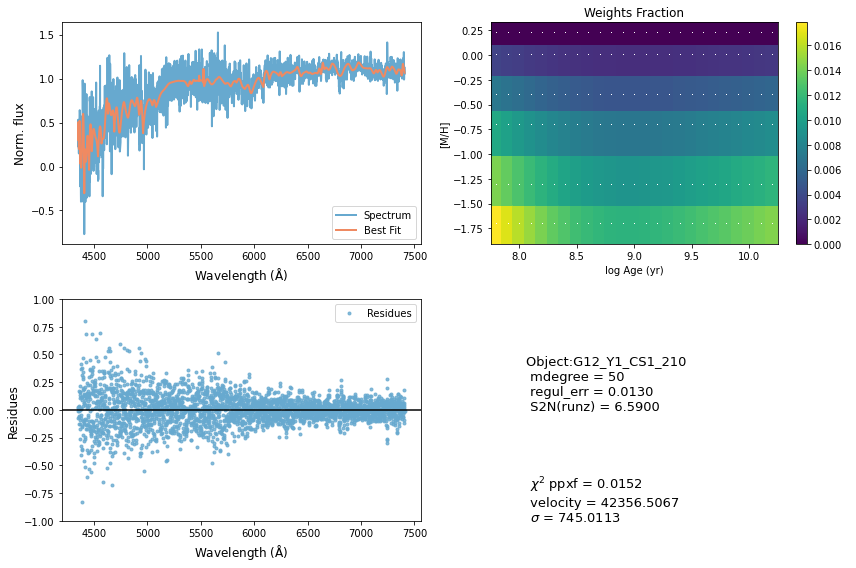

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30657       378    -0.002    -0.075
 comp.  1:     30547       526
 comp.  2:     30470       106
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01011
method = capfit; Jac calls: 18; Func calls: 1089; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  77 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.805       6.3   30547   526
Comp:  2       Unknown      1.579       3.4   30470   106
Comp:  2       Unknown          0       2.6   30470   106
Comp:  2       Unknown     0.1139       1.8   30470   106
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.455
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -0.455
M/L_r: 2.246
Current $\chi^2$: 0.0101
Elapsed time in PPXF: 23.01 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


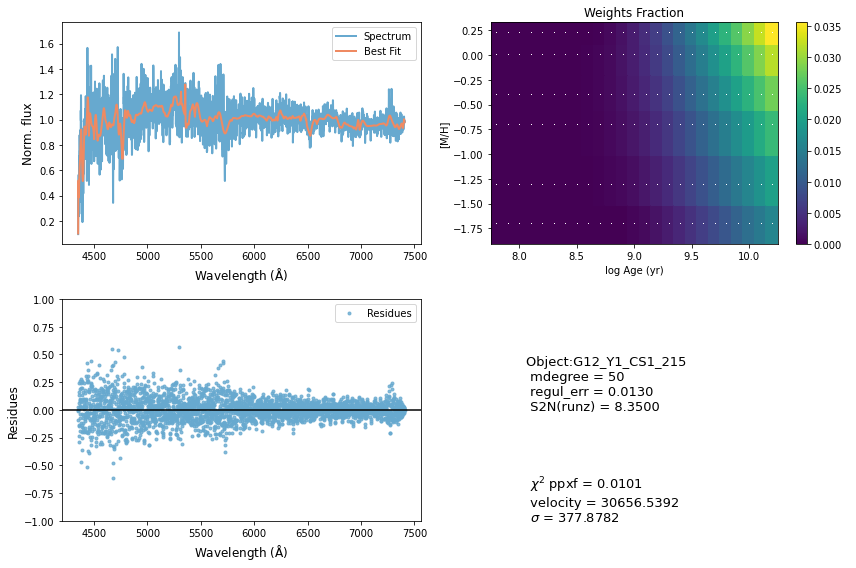

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     75631       792     0.026    -0.132
 comp.  1:     75203       125
 comp.  2:     75184       340
Gas Reddening E(B-V): 0.942
chi2/DOF: 0.002879
method = capfit; Jac calls: 10; Func calls: 612; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.02277       2.9   75203   125
Comp:  2       Unknown     0.7172        12   75184   340
Comp:  2       Unknown      1.354        12   75184   340
Comp:  2       Unknown     0.4466       5.2   75184   340
---------------------------------------------------------
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.315
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.315
M/L_r: 2.013
Current $\chi^2$: 0.0029
Elapsed time in PPXF: 11.39 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


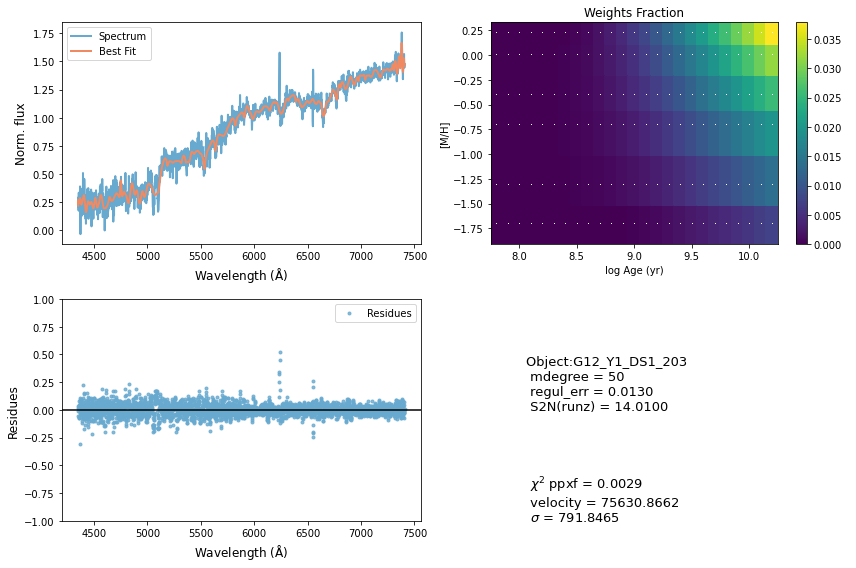

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     58762       607    -0.008    -0.018
 comp.  1:     59254        63
 comp.  2:     59254        74
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01063
method = capfit; Jac calls: 13; Func calls: 791; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  98 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.6019       3.5   59254    63
Comp:  2       Unknown     0.0968       3.1   59254    74
Comp:  2       Unknown          0         3   59254    74
Comp:  2       Unknown     0.7643       3.1   59254    74
---------------------------------------------------------
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.429
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.429
M/L_r: 1.674
Current $\chi^2$: 0.0106
Elapsed time in PPXF: 15.30 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


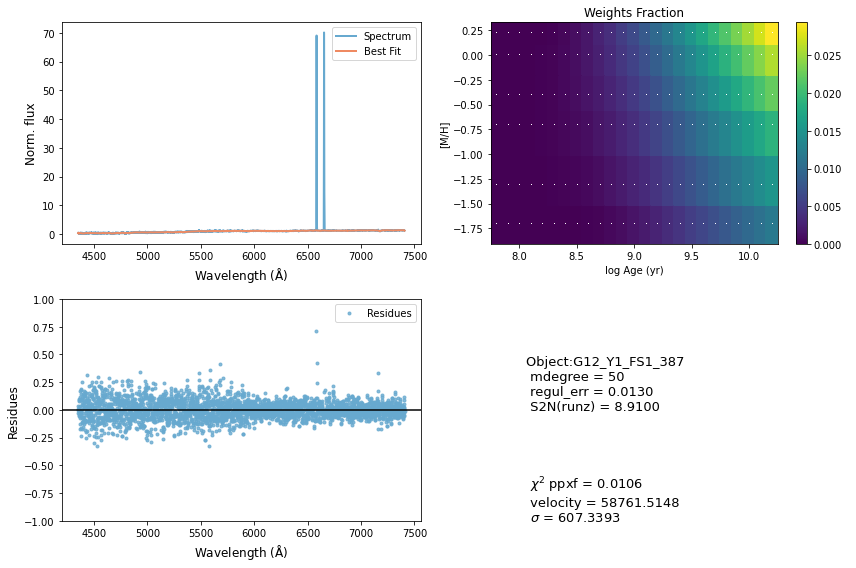

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43995       986    -0.082    -0.053
 comp.  1:     45774       180
 comp.  2:     45700        32
Gas Reddening E(B-V): 8.097
chi2/DOF: 0.007106
method = capfit; Jac calls: 12; Func calls: 734; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         2   45774   180
Comp:  2       Unknown     0.7239       2.6   45700    32
Comp:  2       Unknown          0       1.4   45700    32
---------------------------------------------------------
Weighted <logAge> [yr]: 9.59
Weighted <[M/H]>: -0.24
Weighted <logAge> [yr]: 9.59
Weighted <[M/H]>: -0.24
M/L_r: 1.352
Current $\chi^2$: 0.0071
Elapsed time in PPXF: 14.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


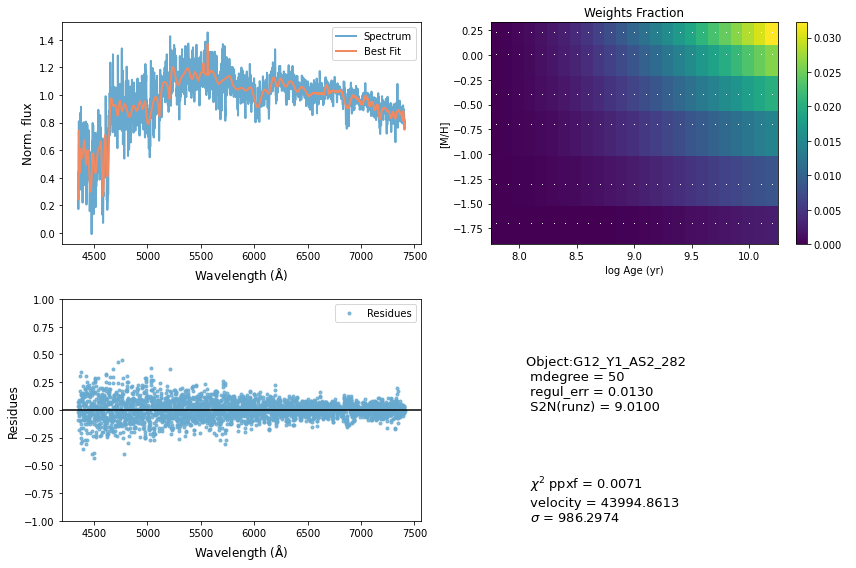

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54170       374    -0.073     0.007
 comp.  1:     54192       539
 comp.  2:     54237       813
Gas Reddening E(B-V): 0.222
chi2/DOF: 0.003477
method = capfit; Jac calls: 14; Func calls: 852; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.312       6.2   54192   539
Comp:  2       Unknown      28.05        57   54237   813
Comp:  2       Unknown          0        57   54237   813
Comp:  2       Unknown      4.351        10   54237   813
---------------------------------------------------------
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.69
Weighted <[M/H]>: -1.11
M/L_r: 1.147
Current $\chi^2$: 0.0035
Elapsed time in PPXF: 16.59 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


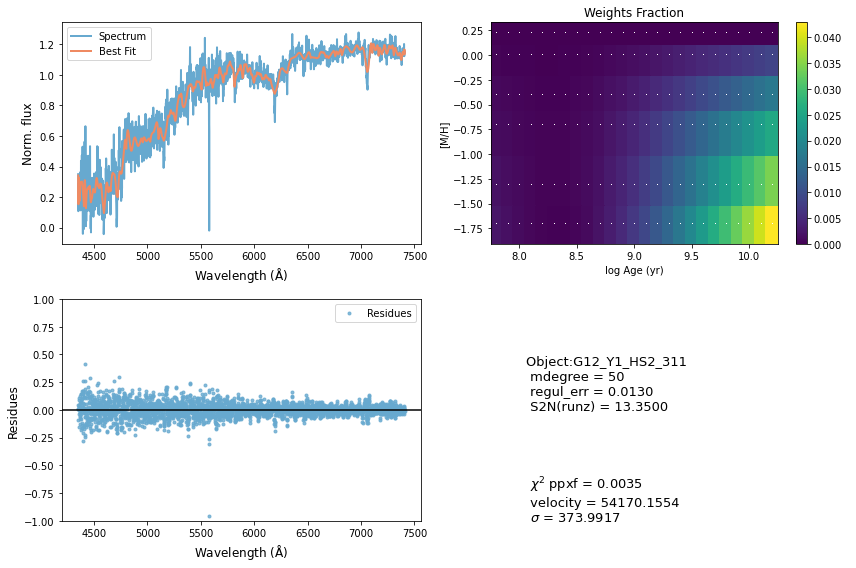

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39170       399    -0.073     0.075
 comp.  1:     39225       228
 comp.  2:     39158       217
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003318
method = capfit; Jac calls: 15; Func calls: 904; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  96 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.284       4.7   39225   228
Comp:  2       Unknown    0.08881       4.3   39158   217
Comp:  2       Unknown          0       3.1   39158   217
---------------------------------------------------------
Weighted <logAge> [yr]: 9.61
Weighted <[M/H]>: -0.192
Weighted <logAge> [yr]: 9.61
Weighted <[M/H]>: -0.192
M/L_r: 1.435
Current $\chi^2$: 0.0033
Elapsed time in PPXF: 17.78 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


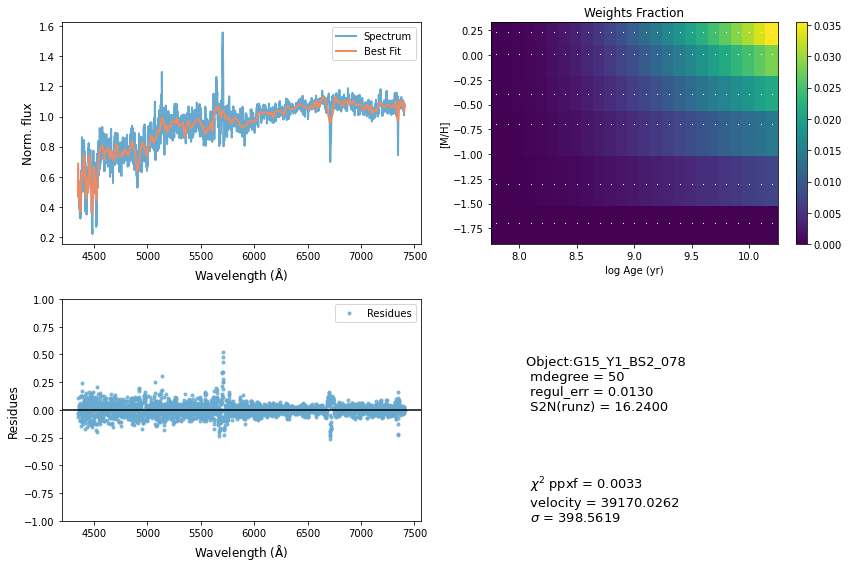

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53100       431     0.041    -0.015
 comp.  1:     52965       115
 comp.  2:     52370      1000
Gas Reddening E(B-V): 9.269
chi2/DOF: 0.006945
method = capfit; Jac calls: 23; Func calls: 1396; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3392       1.4   52965   115
Comp:  2       Unknown       4876   2.9e+02   52370  1000
Comp:  2       Unknown       5085   3.1e+02   52370  1000
Comp:  2       Unknown          0       9.8   52370  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.96
Weighted <[M/H]>: -1.09
Weighted <logAge> [yr]: 7.96
Weighted <[M/H]>: -1.09
M/L_r: 0.1611
Current $\chi^2$: 0.0069
Elapsed time in PPXF: 25.04 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


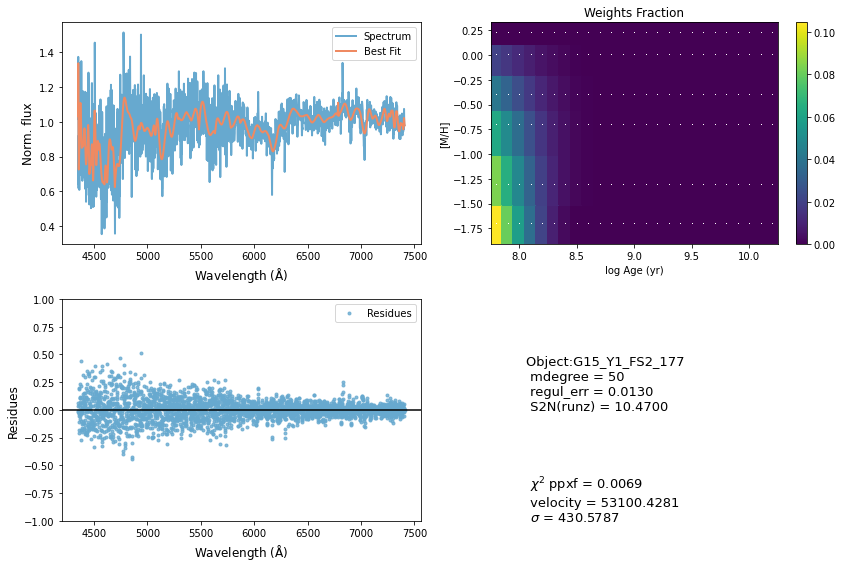

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51593       247    -0.024    -0.024
 comp.  1:     51614       321
 comp.  2:     51959        82
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01431
method = capfit; Jac calls: 11; Func calls: 666; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  75 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      7.937       4.3   51614   321
Comp:  2       Unknown     0.9225       5.8   51959    82
Comp:  2       Unknown      3.746       5.9   51959    82
Comp:  2       Unknown      0.285       3.3   51959    82
---------------------------------------------------------
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.847
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.847
M/L_r: 1.743
Current $\chi^2$: 0.0143
Elapsed time in PPXF: 14.29 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


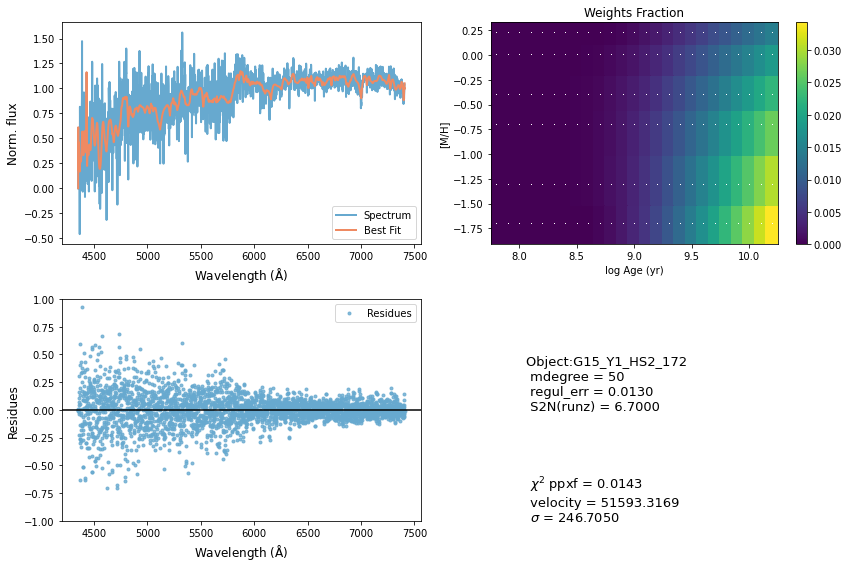

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43458      1000     0.019    -0.053
 comp.  1:     45458       180
 comp.  2:     45338       103
Gas Reddening E(B-V): 5.678
chi2/DOF: 0.005949
method = capfit; Jac calls: 16; Func calls: 967; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.7   45458   180
Comp:  2       Unknown      1.839       3.4   45338   103
Comp:  2       Unknown          0       1.8   45338   103
---------------------------------------------------------
Weighted <logAge> [yr]: 8.17
Weighted <[M/H]>: -0.934
Weighted <logAge> [yr]: 8.17
Weighted <[M/H]>: -0.934
M/L_r: 0.1874
Current $\chi^2$: 0.0059
Elapsed time in PPXF: 19.92 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


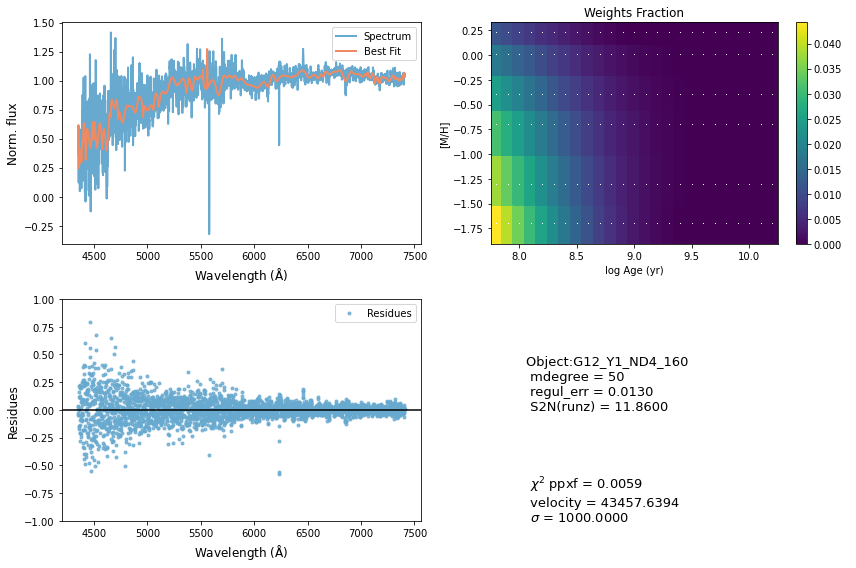

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48889      1000    -0.035    -0.041
 comp.  1:     49203       180
 comp.  2:     49351       319
Gas Reddening E(B-V): 9.990
chi2/DOF: 0.006373
method = capfit; Jac calls: 15; Func calls: 908; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown   0.003387       1.8   49203   180
Comp:  2       Unknown       1520     7e+02   49351   319
Comp:  2       Unknown       1537   7.1e+02   49351   319
Comp:  2       Unknown          0       5.2   49351   319
---------------------------------------------------------
Weighted <logAge> [yr]: 9.56
Weighted <[M/H]>: -1.05
Weighted <logAge> [yr]: 9.56
Weighted <[M/H]>: -1.05
M/L_r: 0.8776
Current $\chi^2$: 0.0064
Elapsed time in PPXF: 19.07 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


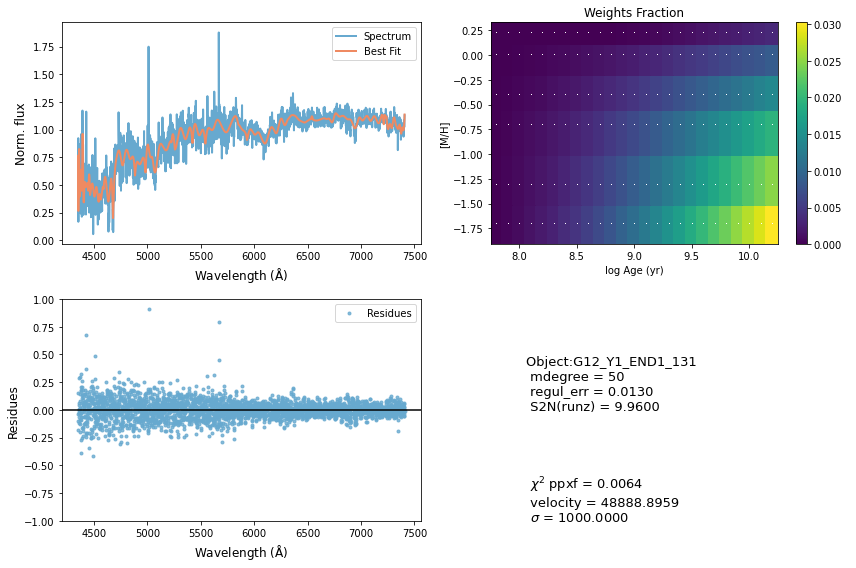

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55532       180     0.000     0.000
 comp.  1:     55532       180
 comp.  2:     55532       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00724
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2096       3.7   55532   180
Comp:  2       Unknown          0       6.9   55532   180
Comp:  2       Unknown          0       6.7   55532   180
Comp:  2       Unknown          0       4.6   55532   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0072
Elapsed time in PPXF: 1.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


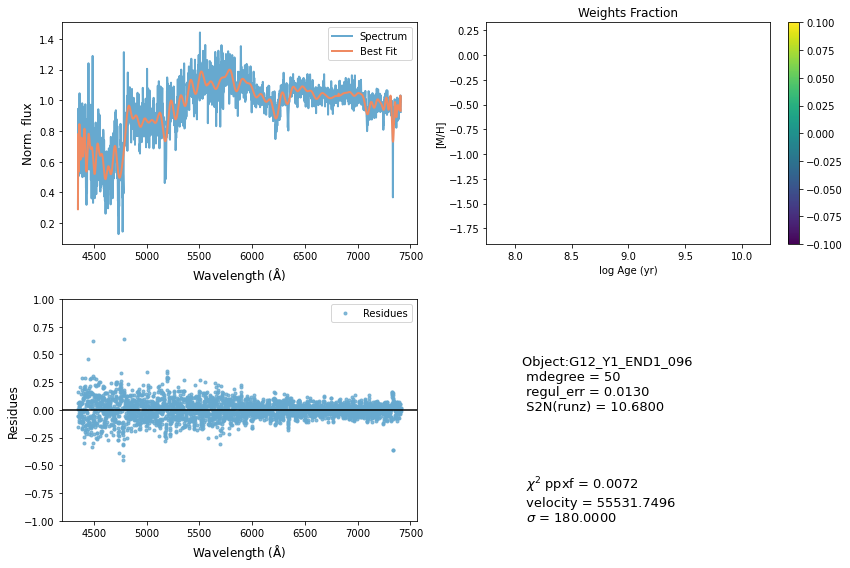

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54997      1000    -0.025    -0.024
 comp.  1:     55067       257
 comp.  2:     55008       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003509
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  17 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7961       5.1   55067   257
Comp:  2       Unknown          0       5.8   55008   180
Comp:  2       Unknown          0       5.8   55008   180
Comp:  2       Unknown          0       5.4   55008   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.19
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.19
M/L_r: 0.1577
Current $\chi^2$: 0.0035
Elapsed time in PPXF: 1.12 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


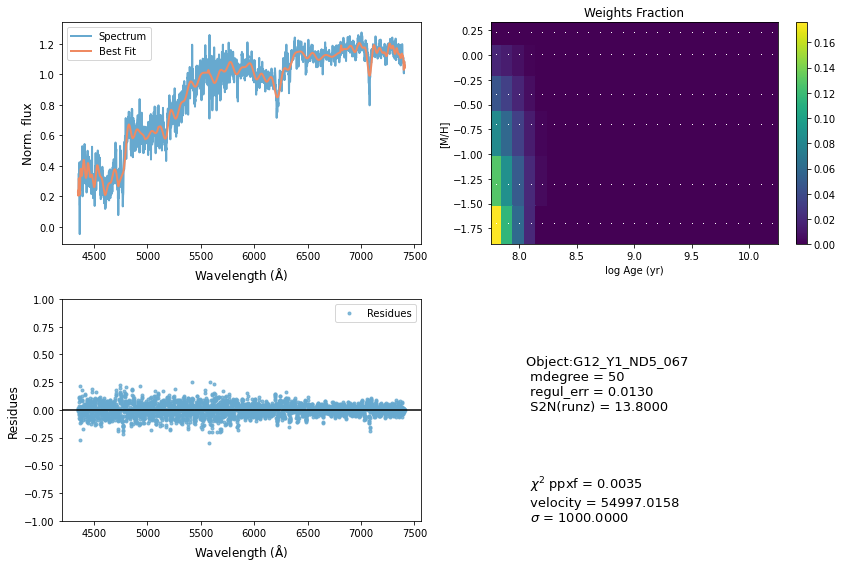

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41673       180     0.000     0.000
 comp.  1:     41673       180
 comp.  2:     41673       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005492
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  0 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.7   41673   180
Comp:  2       Unknown          0       4.4   41673   180
Comp:  2       Unknown          0       2.5   41673   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0055
Elapsed time in PPXF: 0.89 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


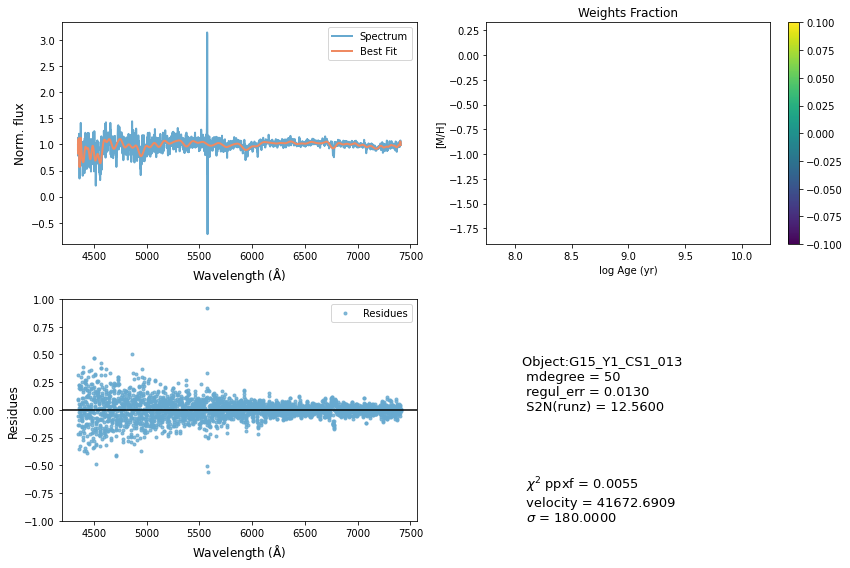

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     76456      1000    -0.020    -0.060
 comp.  1:     74456       180
 comp.  2:     74850       135
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01824
method = capfit; Jac calls: 15; Func calls: 905; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  84 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.2   74456   180
Comp:  2       Unknown      2.844       8.3   74850   135
Comp:  2       Unknown          0       6.5   74850   135
Comp:  2       Unknown      1.397       2.9   74850   135
---------------------------------------------------------
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.405
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.405
M/L_r: 2.061
Current $\chi^2$: 0.0182
Elapsed time in PPXF: 17.42 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


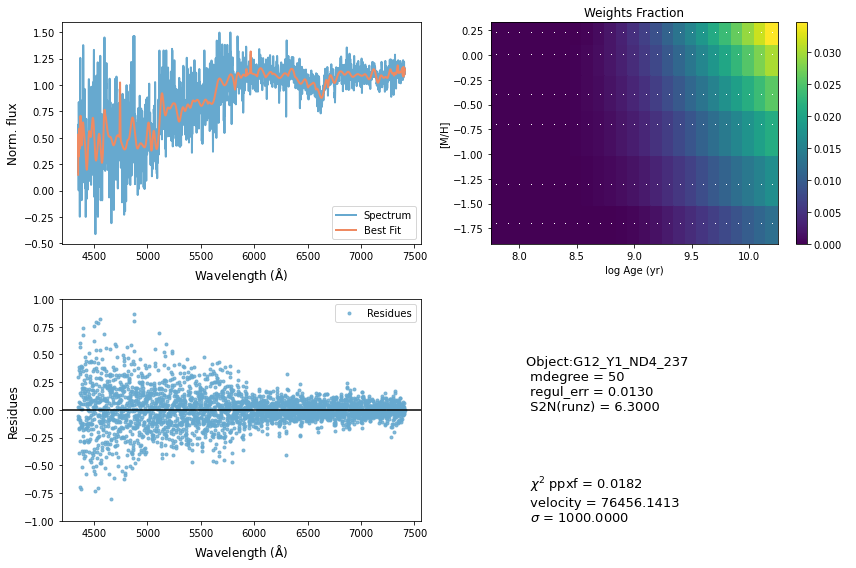

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60865       650    -0.063    -0.227
 comp.  1:     61072       673
 comp.  2:     60828        31
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003184
method = capfit; Jac calls: 20; Func calls: 1212; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  31 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.25       8.1   61072   673
Comp:  2       Unknown     0.7719       4.1   60828    31
Comp:  2       Unknown          0       3.9   60828    31
Comp:  2       Unknown     0.3411       2.4   60828    31
---------------------------------------------------------
Weighted <logAge> [yr]: 8.19
Weighted <[M/H]>: -0.191
Weighted <logAge> [yr]: 8.19
Weighted <[M/H]>: -0.191
M/L_r: 0.228
Current $\chi^2$: 0.0032
Elapsed time in PPXF: 28.33 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


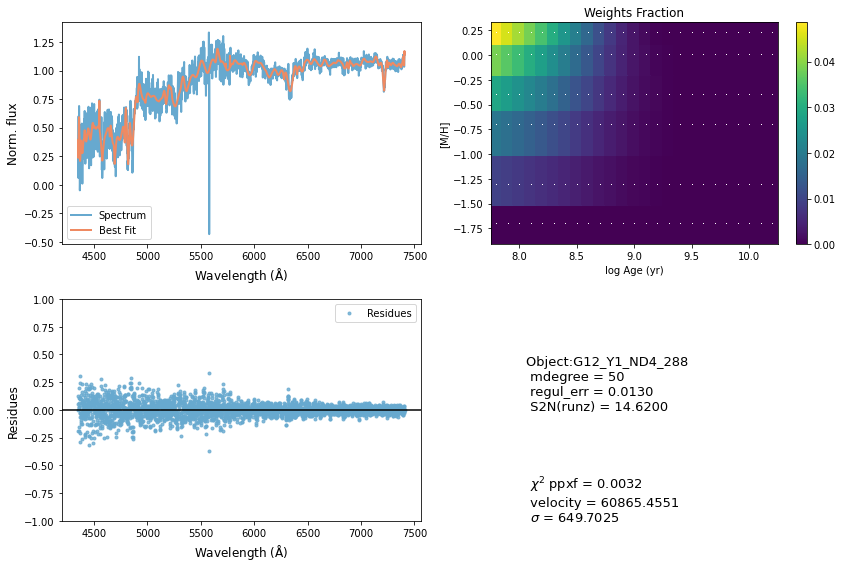

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50120       760    -0.009    -0.009
 comp.  1:     50407       180
 comp.  2:     50458       271
Gas Reddening E(B-V): 6.608
chi2/DOF: 0.005478
method = capfit; Jac calls: 2; Func calls: 126; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.3   50407   180
Comp:  2       Unknown          0         5   50458   271
Comp:  2       Unknown       2.05       8.5   50458   271
Comp:  2       Unknown      1.223       5.5   50458   271
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0055
Elapsed time in PPXF: 1.74 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


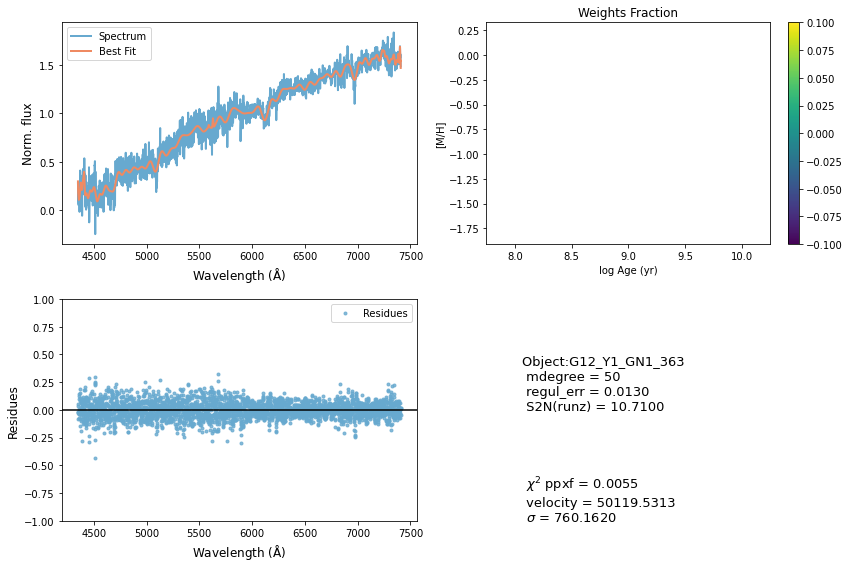

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50962       211    -0.029    -0.029
 comp.  1:     51064        13
 comp.  2:     51000         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009177
method = capfit; Jac calls: 3; Func calls: 182; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4481       2.2   51064    13
Comp:  2       Unknown          0       2.9   51000     1
Comp:  2       Unknown        0.6         3   51000     1
Comp:  2       Unknown     0.4008       2.5   51000     1
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0092
Elapsed time in PPXF: 2.55 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


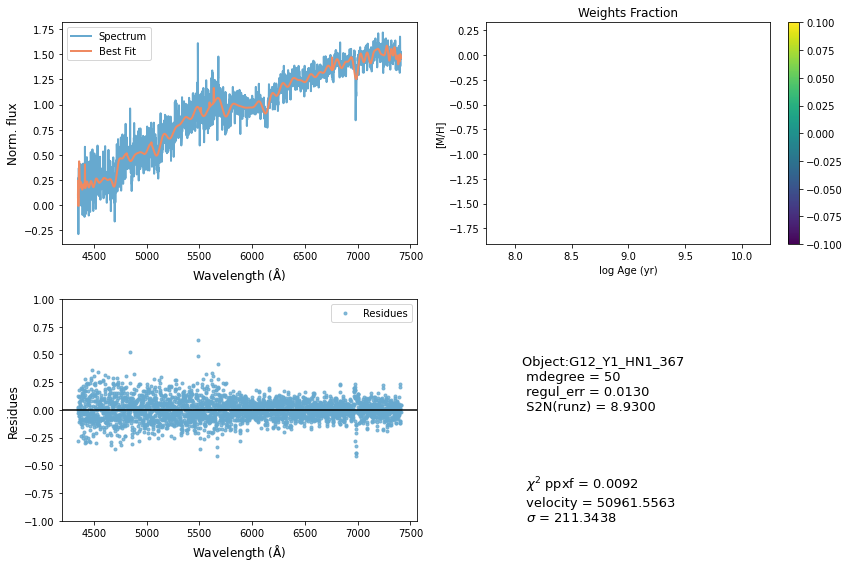

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     67794      1000     0.030    -0.053
 comp.  1:     68864       364
 comp.  2:     68604       131
Gas Reddening E(B-V): 4.278
chi2/DOF: 0.01177
method = capfit; Jac calls: 16; Func calls: 972; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2853       2.9   68864   364
Comp:  2       Unknown       1.48       4.7   68604   131
Comp:  2       Unknown          0       4.6   68604   131
Comp:  2       Unknown      1.097       3.1   68604   131
---------------------------------------------------------
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.343
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.343
M/L_r: 2.032
Current $\chi^2$: 0.0118
Elapsed time in PPXF: 21.21 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


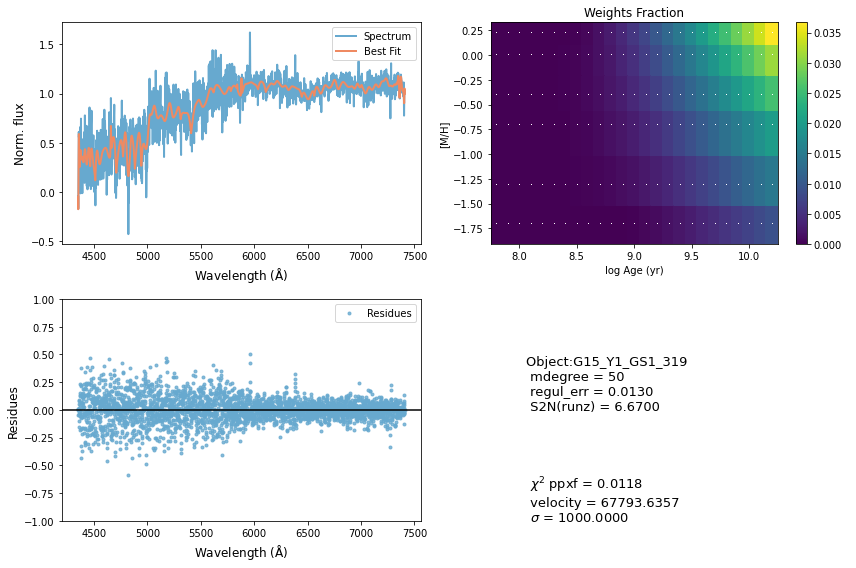

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64062       310    -0.001    -0.011
 comp.  1:     64210       321
 comp.  2:     63920       180
Gas Reddening E(B-V): 0.093
chi2/DOF: 0.04993
method = capfit; Jac calls: 8; Func calls: 488; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  71 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.683       4.9   64210   321
Comp:  2       Unknown          0       6.8   63920   180
Comp:  2       Unknown          0       6.8   63920   180
Comp:  2       Unknown    0.08015       4.2   63920   180
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.298
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.298
M/L_r: 2.609
Current $\chi^2$: 0.0499
Elapsed time in PPXF: 7.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


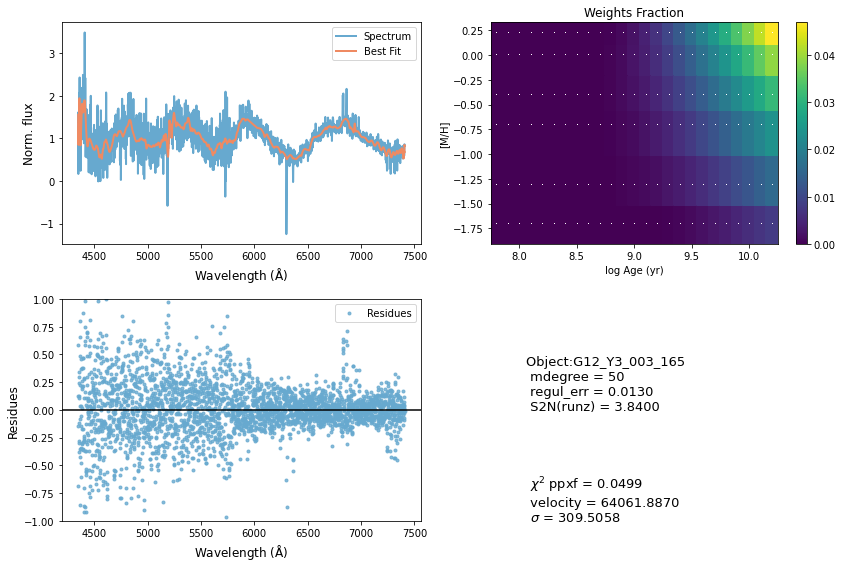

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46165       830    -0.062    -0.034
 comp.  1:     46773       423
 comp.  2:     45854       737
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003095
method = capfit; Jac calls: 24; Func calls: 1452; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.882         6   46773   423
Comp:  2       Unknown          0        60   45854   737
Comp:  2       Unknown  1.028e+04        64   45854   737
Comp:  2       Unknown      1.222       9.3   45854   737
Comp:  2       Unknown     0.5504       5.1   45854   737
---------------------------------------------------------
Weighted <logAge> [yr]: 8.4
Weighted <[M/H]>: -1.09
Weighted <logAge> [yr]: 8.4
Weighted <[M/H]>: -1.09
M/L_r: 0.2134
Current $\chi^2$: 0.0031
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


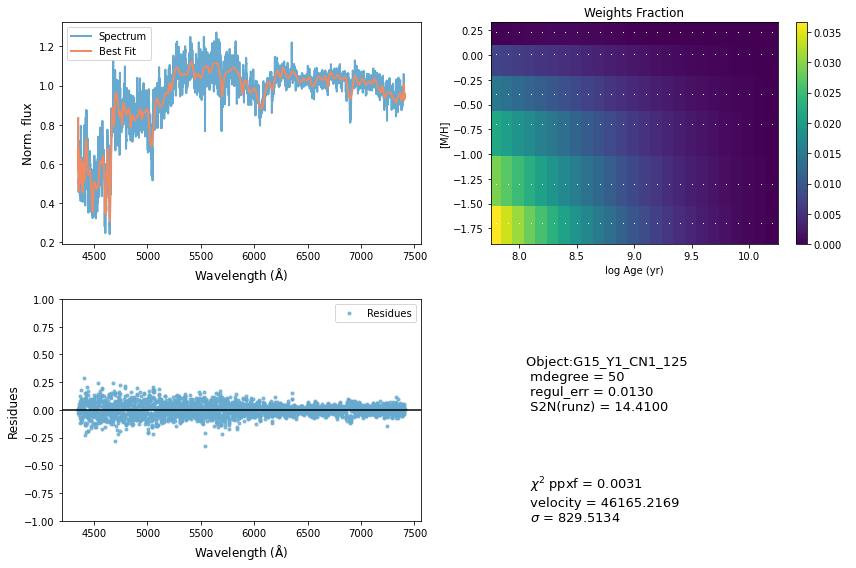

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35231       456     0.063     0.093
 comp.  1:     35071       192
 comp.  2:     35510        87
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004378
method = capfit; Jac calls: 16; Func calls: 963; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  113 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1907       4.6   35071   192
Comp:  2       Unknown     0.7955       3.1   35510    87
Comp:  2       Unknown          0       2.2   35510    87
Comp:  2       Unknown     0.0437       2.3   35510    87
---------------------------------------------------------
Weighted <logAge> [yr]: 9.28
Weighted <[M/H]>: -0.185
Weighted <logAge> [yr]: 9.28
Weighted <[M/H]>: -0.185
M/L_r: 0.7841
Current $\chi^2$: 0.0044
Elapsed time in PPXF: 17.65 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


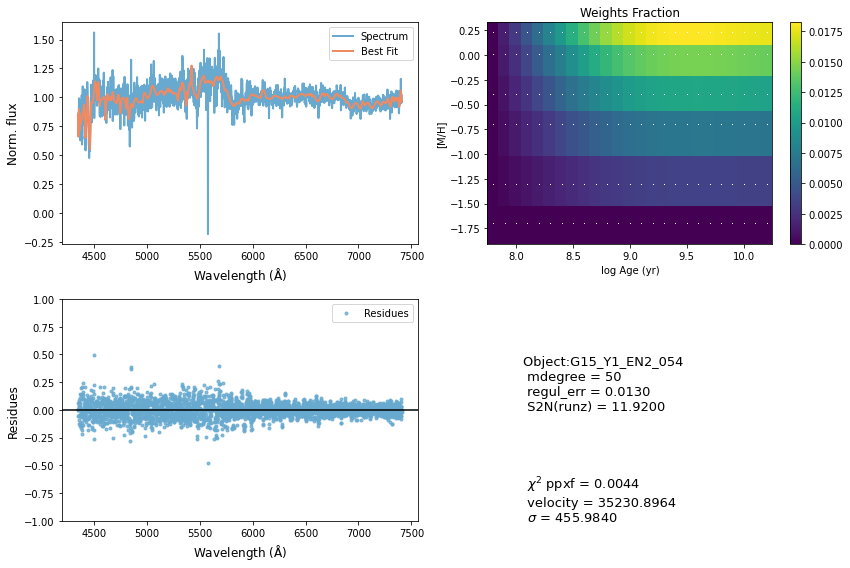

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39626       510     0.160     0.095
 comp.  1:     39604         1
 comp.  2:     38979       116
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.002429
method = capfit; Jac calls: 14; Func calls: 850; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  99 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.01964       2.1   39604     1
Comp:  2       Unknown     0.2766       3.4   38979   116
Comp:  2       Unknown     0.2064       2.4   38979   116
---------------------------------------------------------
Weighted <logAge> [yr]: 9.72
Weighted <[M/H]>: -0.587
Weighted <logAge> [yr]: 9.72
Weighted <[M/H]>: -0.587
M/L_r: 1.634
Current $\chi^2$: 0.0024
Elapsed time in PPXF: 18.12 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


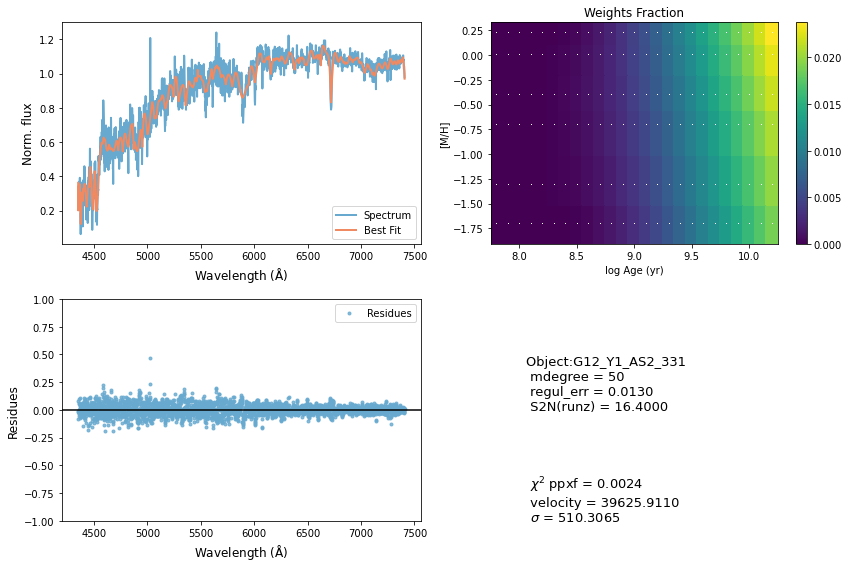

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49800       180     0.000     0.000
 comp.  1:     49800       180
 comp.  2:     49800       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003231
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.6   49800   180
Comp:  2       Unknown          0       6.4   49800   180
Comp:  2       Unknown     0.6031       6.6   49800   180
Comp:  2       Unknown          0       4.7   49800   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.104
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.104
M/L_r: 5.738
Current $\chi^2$: 0.0032
Elapsed time in PPXF: 0.93 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


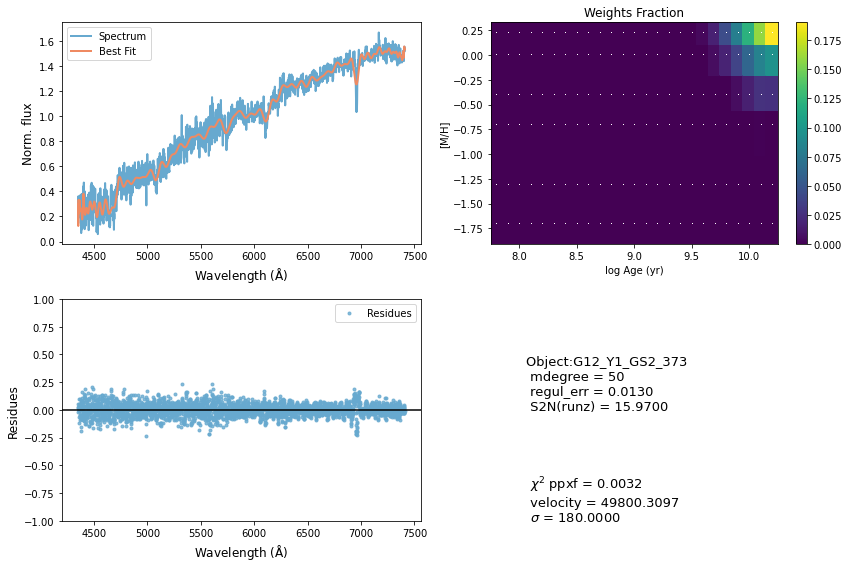

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52335      1000    -0.044    -0.029
 comp.  1:     53928        89
 comp.  2:     54587       228
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007353
method = capfit; Jac calls: 16; Func calls: 973; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  15 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8571       2.8   53928    89
Comp:  2       Unknown      4.357       9.7   54587   228
Comp:  2       Unknown          0       9.6   54587   228
Comp:  2       Unknown      2.095       5.7   54587   228
---------------------------------------------------------
Weighted <logAge> [yr]: 8.11
Weighted <[M/H]>: -0.214
Weighted <logAge> [yr]: 8.11
Weighted <[M/H]>: -0.214
M/L_r: 0.2088
Current $\chi^2$: 0.0074
Elapsed time in PPXF: 19.83 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


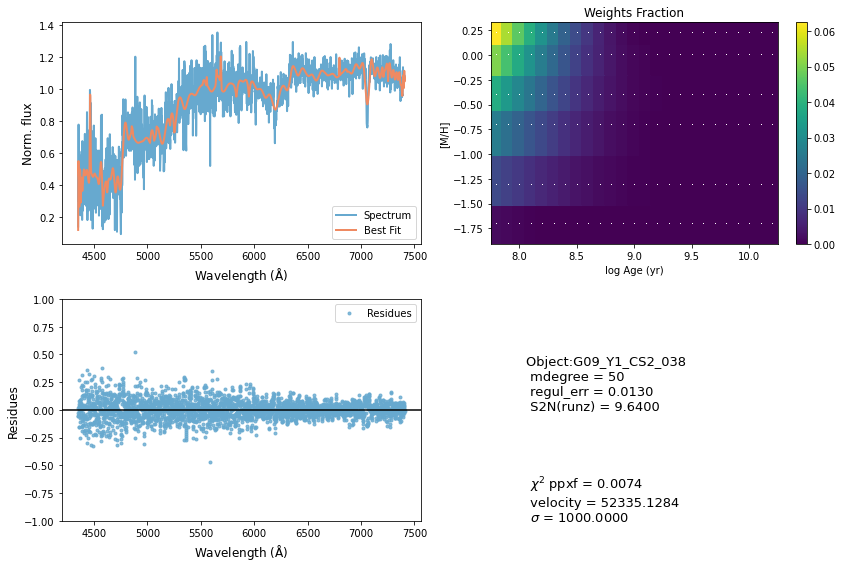

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45941       716    -0.006    -0.094
 comp.  1:     47526        68
 comp.  2:     46922       579
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.003619
method = capfit; Jac calls: 16; Func calls: 972; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1562       1.5   47526    68
Comp:  2       Unknown  1.956e+05   9.5e+02   46922   579
Comp:  2       Unknown   1.97e+05   9.6e+02   46922   579
Comp:  2       Unknown          0       8.5   46922   579
Comp:  2       Unknown      1.761       5.9   46922   579
---------------------------------------------------------
Weighted <logAge> [yr]: 9.63
Weighted <[M/H]>: -0.312
Weighted <logAge> [yr]: 9.63
Weighted <[M/H]>: -0.312
M/L_r: 1.467
Current $\chi^2$: 0.0036
Elap

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


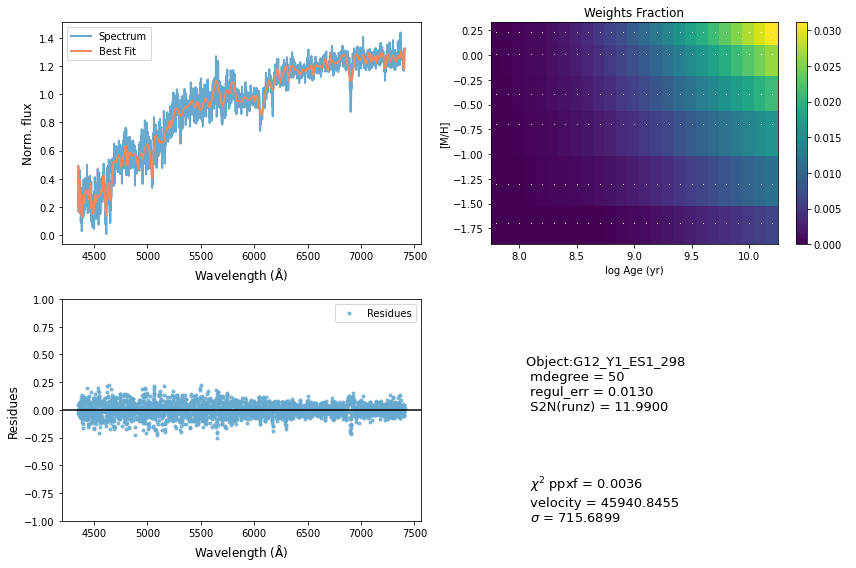

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46473       193    -0.023    -0.022
 comp.  1:     46471       159
 comp.  2:     46515       134
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01252
method = capfit; Jac calls: 11; Func calls: 666; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.08613       3.5   46471   159
Comp:  2       Unknown      21.48       5.4   46515   134
Comp:  2       Unknown      1.685       5.5   46515   134
Comp:  2       Unknown          0       2.2   46515   134
---------------------------------------------------------
Weighted <logAge> [yr]: 9.27
Weighted <[M/H]>: -1.12
Weighted <logAge> [yr]: 9.27
Weighted <[M/H]>: -1.12
M/L_r: 0.5167
Current $\chi^2$: 0.0125
Elapsed time in PPXF: 11.71 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


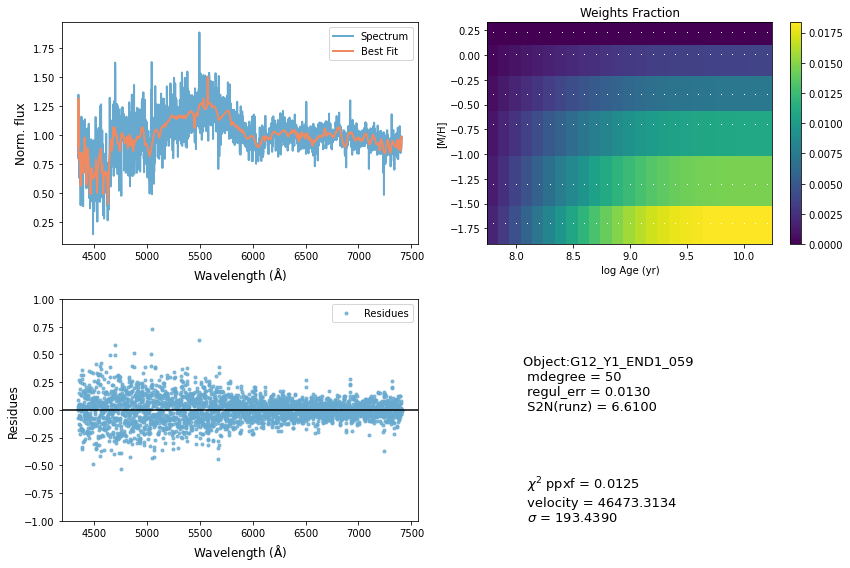

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42368       180     0.000     0.000
 comp.  1:     42368       180
 comp.  2:     42368       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00302
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.8   42368   180
Comp:  2       Unknown     0.2119       4.2   42368   180
Comp:  2       Unknown    0.04702       2.7   42368   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0030
Elapsed time in PPXF: 0.86 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


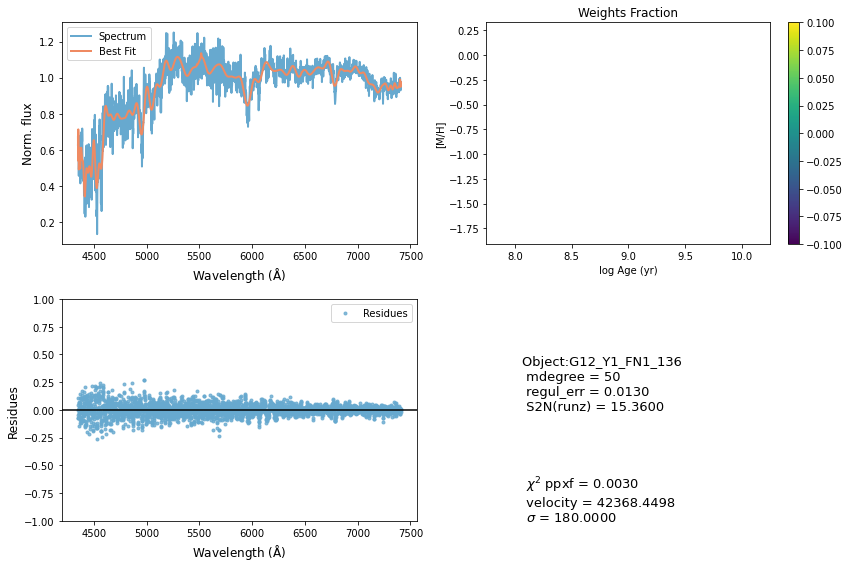

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34338       188    -0.011     0.036
 comp.  1:     34219       291
 comp.  2:     33886        98
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.002785
method = capfit; Jac calls: 13; Func calls: 792; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  29 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.462       5.3   34219   291
Comp:  2       Unknown     0.4144       3.1   33886    98
Comp:  2       Unknown          0       2.2   33886    98
Comp:  2       Unknown    0.04002       2.2   33886    98
---------------------------------------------------------
Weighted <logAge> [yr]: 7.96
Weighted <[M/H]>: -1.12
Weighted <logAge> [yr]: 7.96
Weighted <[M/H]>: -1.12
M/L_r: 0.1604
Current $\chi^2$: 0.0028
Elapsed time in PPXF: 14.11 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


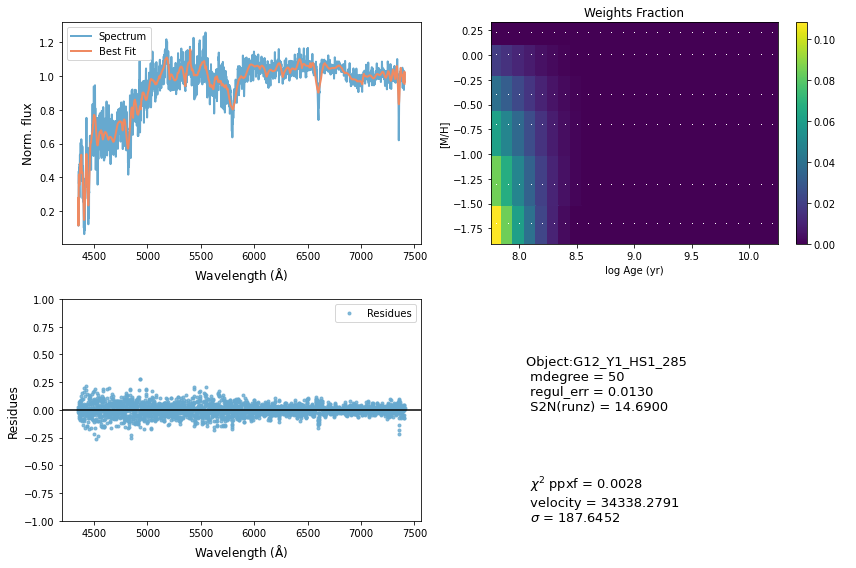

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37186       180     0.000     0.000
 comp.  1:     37186       180
 comp.  2:     37186       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02054
method = capfit; Jac calls: 1; Func calls: 66; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       1.26       3.9   37186   180
Comp:  2       Unknown          0       4.6   37186   180
Comp:  2       Unknown          0       2.5   37186   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0205
Elapsed time in PPXF: 0.89 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


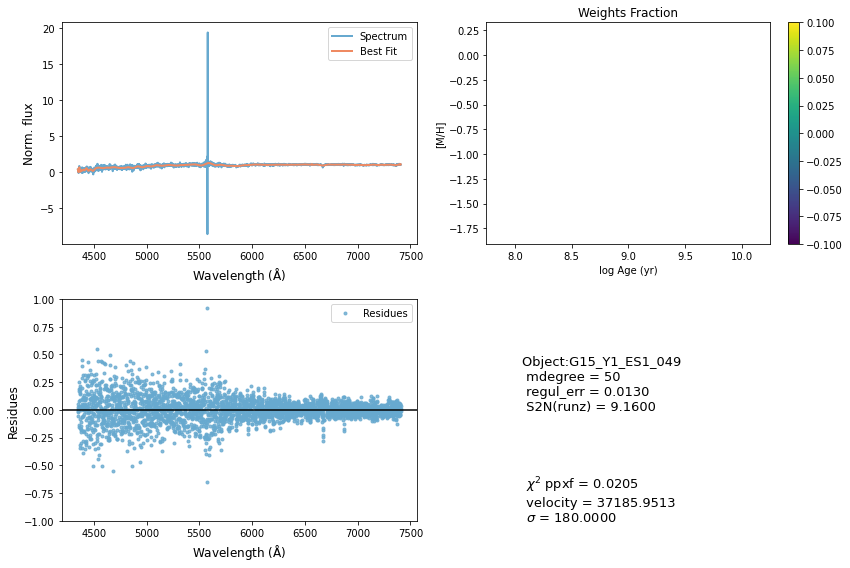

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     69475      1000     0.126     0.012
 comp.  1:     69528      1000
 comp.  2:     67810       708
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00227
method = capfit; Jac calls: 18; Func calls: 1090; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  67 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      47.29        11   69528  1000
Comp:  2       Unknown          0        33   67810   708
Comp:  2       Unknown      3.886        33   67810   708
Comp:  2       Unknown     0.8459       8.4   67810   708
---------------------------------------------------------
Weighted <logAge> [yr]: 9.54
Weighted <[M/H]>: -0.249
Weighted <logAge> [yr]: 9.54
Weighted <[M/H]>: -0.249
M/L_r: 1.202
Current $\chi^2$: 0.0023
Elapsed time in PPXF: 25.66 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


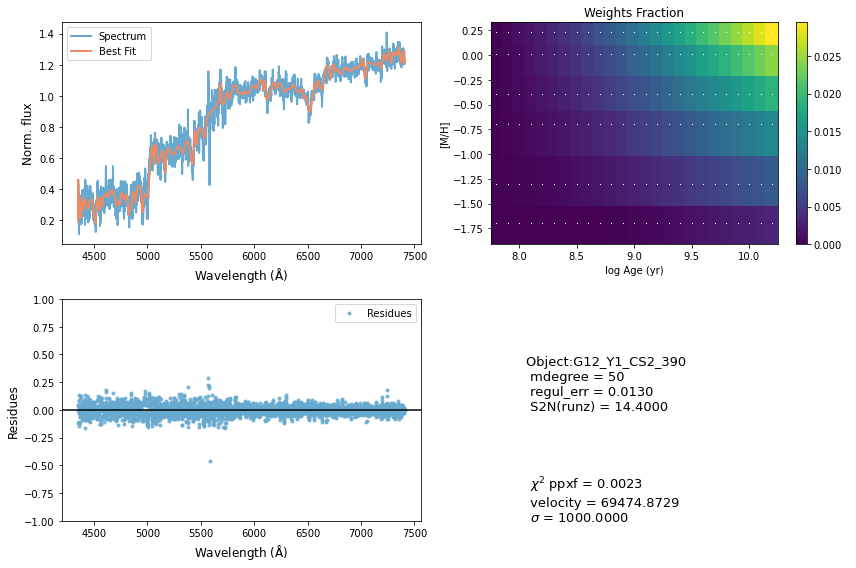

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     65385      1000    -0.032    -0.029
 comp.  1:     65958       180
 comp.  2:     65951       221
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004401
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  42 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.1   65958   180
Comp:  2       Unknown          0       7.9   65951   221
Comp:  2       Unknown          0         8   65951   221
Comp:  2       Unknown     0.9659       4.4   65951   221
---------------------------------------------------------
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.194
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.194
M/L_r: 3.399
Current $\chi^2$: 0.0044
Elapsed time in PPXF: 0.90 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


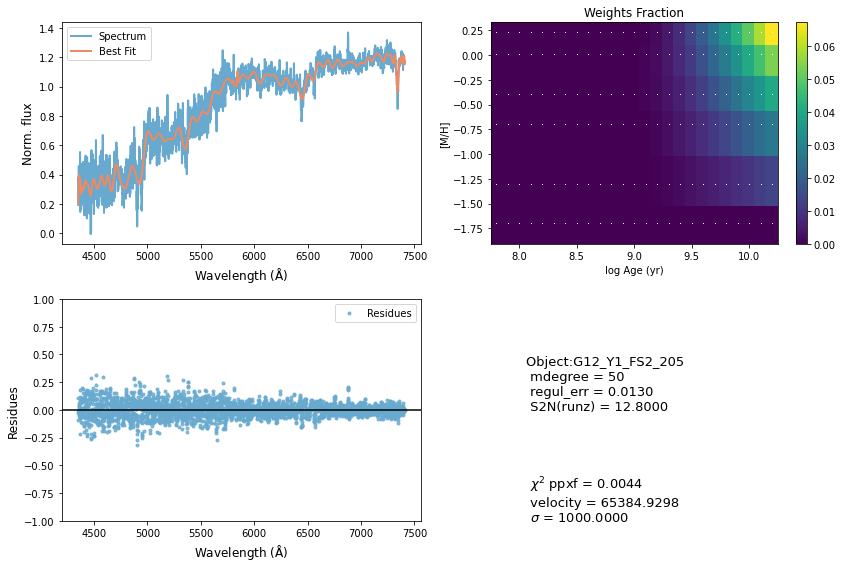

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64953       180     0.000     0.000
 comp.  1:     64953       180
 comp.  2:     64953       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004475
method = capfit; Jac calls: 1; Func calls: 68; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown   0.006945       5.1   64953   180
Comp:  2       Unknown          0       5.4   64953   180
Comp:  2       Unknown          0       5.4   64953   180
Comp:  2       Unknown     0.2602       4.5   64953   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0045
Elapsed time in PPXF: 0.88 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


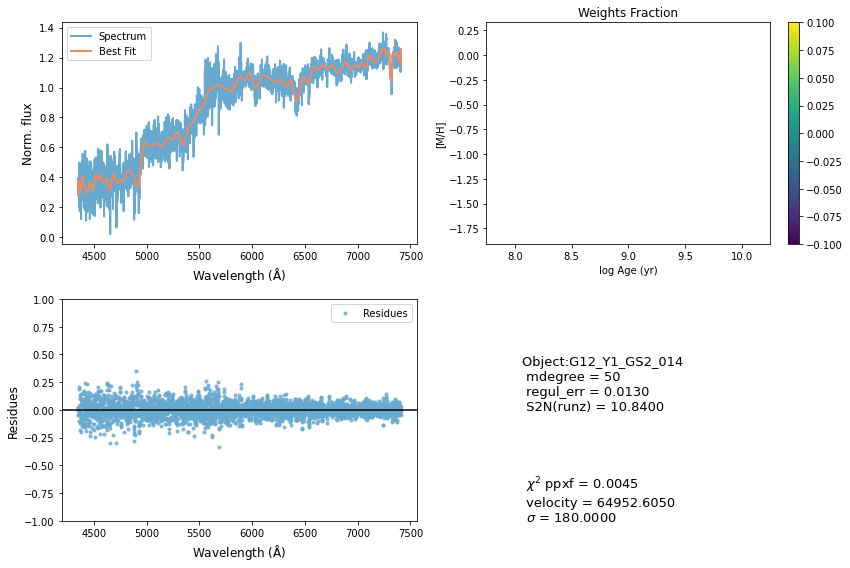

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49788       927    -0.009     0.004
 comp.  1:     47915        89
 comp.  2:     48026       289
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005454
method = capfit; Jac calls: 20; Func calls: 1207; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  58 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       0.35       2.6   47915    89
Comp:  2       Unknown      5.616        15   48026   289
Comp:  2       Unknown      22.51        15   48026   289
Comp:  2       Unknown          0       5.2   48026   289
Comp:  2       Unknown     0.1921       3.1   48026   289
---------------------------------------------------------
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.734
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.734
M/L_r: 1.475
Current $\chi^2$: 0.0055
El

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


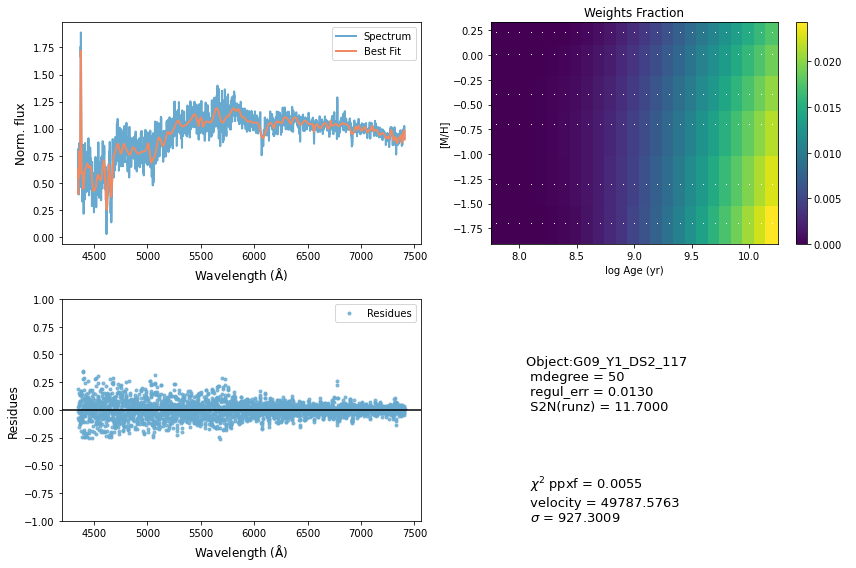

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48850      1000     0.134     0.064
 comp.  1:     50330        27
 comp.  2:     50398        77
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003579
method = capfit; Jac calls: 17; Func calls: 1029; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  115 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2418       2.3   50330    27
Comp:  2       Unknown      0.658       3.2   50398    77
Comp:  2       Unknown     0.7323       3.2   50398    77
Comp:  2       Unknown     0.4726       3.4   50398    77
---------------------------------------------------------
Weighted <logAge> [yr]: 9.54
Weighted <[M/H]>: -0.403
Weighted <logAge> [yr]: 9.54
Weighted <[M/H]>: -0.403
M/L_r: 1.13
Current $\chi^2$: 0.0036
Elapsed time in PPXF: 27.70 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


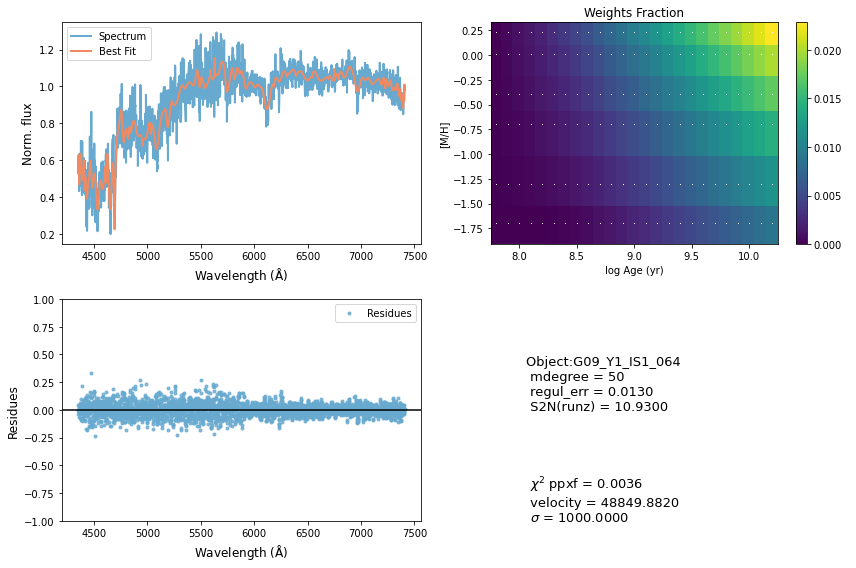

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62094       262    -0.033     0.160
 comp.  1:     64224       454
 comp.  2:     63918        66
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.004214
method = capfit; Jac calls: 11; Func calls: 675; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3628       4.1   64224   454
Comp:  2       Unknown          0      0.12   63918    66
Comp:  2       Unknown          0      0.35   63918    66
Comp:  2       Unknown     0.5286       3.1   63918    66
---------------------------------------------------------
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.658
Weighted <logAge> [yr]: 9.84
Weighted <[M/H]>: -0.658
M/L_r: 2.208
Current $\chi^2$: 0.0042
Elapsed time in PPXF: 12.30 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


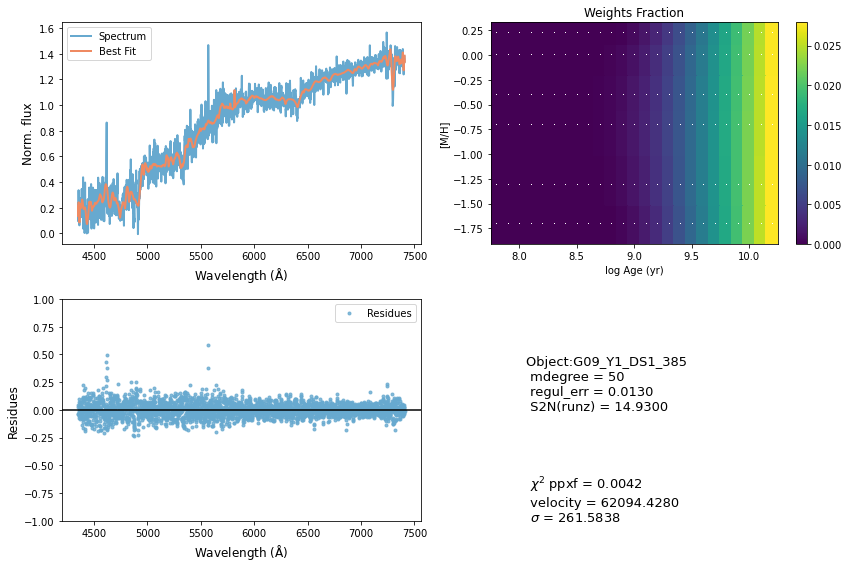

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60024       466     0.013     0.037
 comp.  1:     60128      1000
 comp.  2:     60176       203
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.01364
method = capfit; Jac calls: 18; Func calls: 1091; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      15.92       6.2   60128  1000
Comp:  2       Unknown      0.479   2.1e+02   60176   203
Comp:  2       Unknown          0   2.1e+02   60176   203
Comp:  2       Unknown      2.049       4.3   60176   203
---------------------------------------------------------
Weighted <logAge> [yr]: 9.58
Weighted <[M/H]>: -0.934
Weighted <logAge> [yr]: 9.58
Weighted <[M/H]>: -0.934
M/L_r: 0.93
Current $\chi^2$: 0.0136
Elapsed time in PPXF: 25.34 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


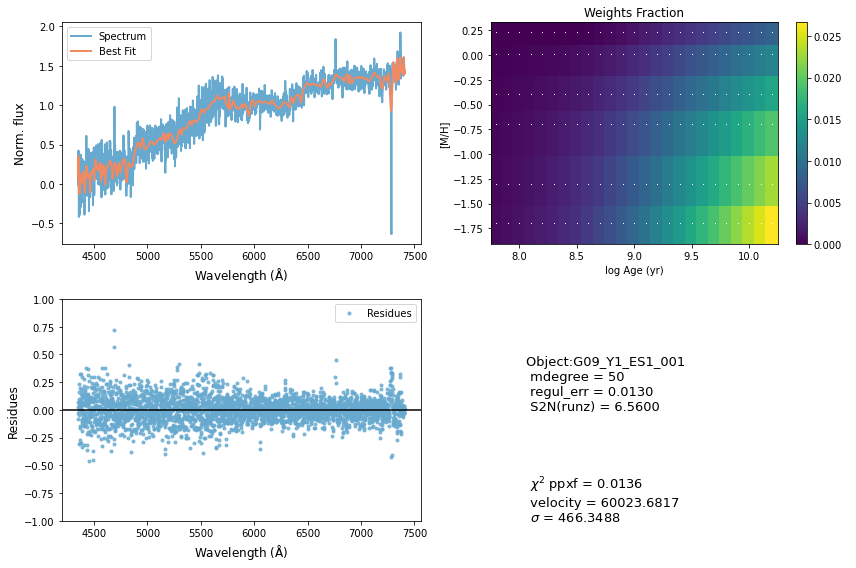

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36041       264    -0.014    -0.094
 comp.  1:     36116       517
 comp.  2:     36315       134
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009652
method = capfit; Jac calls: 16; Func calls: 969; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  81 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.174       7.1   36116   517
Comp:  2       Unknown      2.443       3.6   36315   134
Comp:  2       Unknown          0       2.5   36315   134
---------------------------------------------------------
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.275
Weighted <logAge> [yr]: 9.71
Weighted <[M/H]>: -0.275
M/L_r: 1.846
Current $\chi^2$: 0.0097
Elapsed time in PPXF: 20.15 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


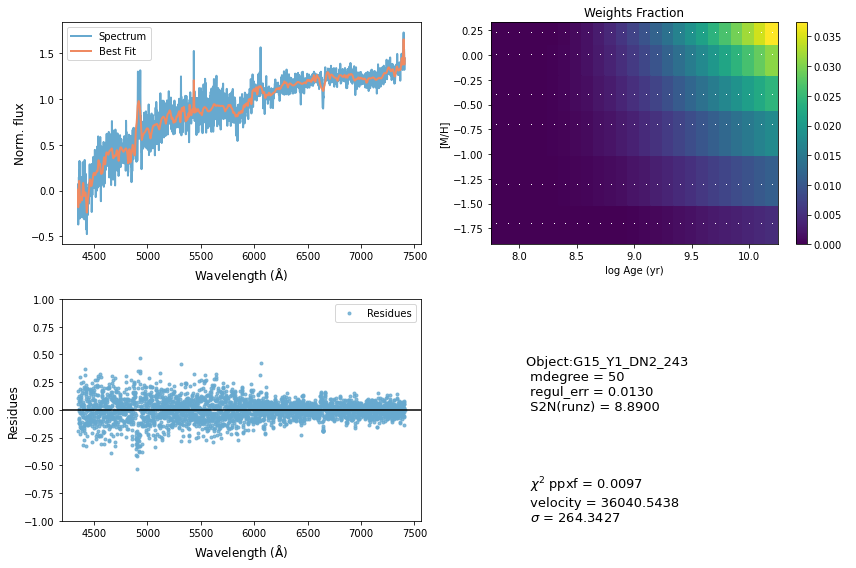

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34088       352    -0.004     0.005
 comp.  1:     33991       180
 comp.  2:     33639       173
Gas Reddening E(B-V): 8.985
chi2/DOF: 0.003119
method = capfit; Jac calls: 8; Func calls: 489; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.2   33991   180
Comp:  2       Unknown     0.9721       3.8   33639   173
Comp:  2       Unknown          0       3.1   33639   173
Comp:  2       Unknown    0.06327       2.8   33639   173
---------------------------------------------------------
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.237
Weighted <logAge> [yr]: 9.82
Weighted <[M/H]>: -0.237
M/L_r: 2.557
Current $\chi^2$: 0.0031
Elapsed time in PPXF: 9.09 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


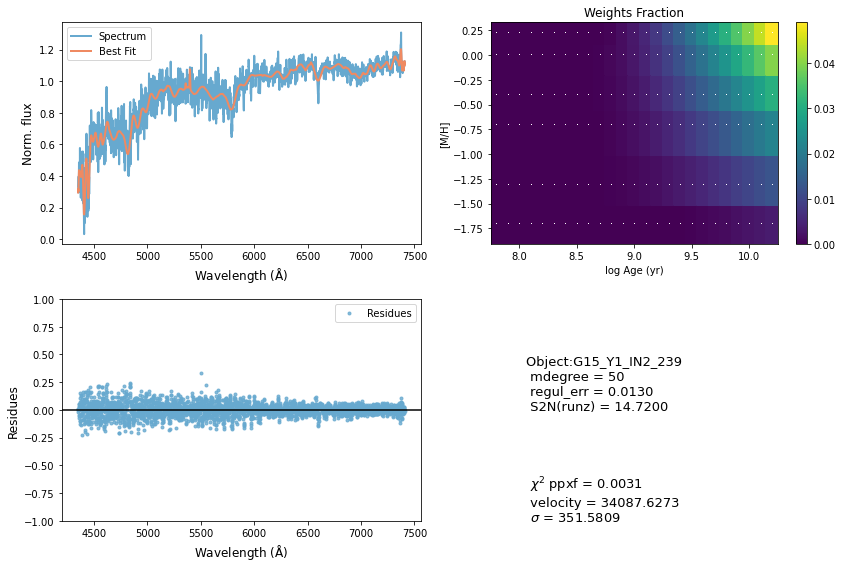

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39062       186     0.300     0.300
 comp.  1:     39016       215
 comp.  2:     39167       121
Gas Reddening E(B-V): 1.205
chi2/DOF: 0.0402
method = capfit; Jac calls: 15; Func calls: 919; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      40.48       2.4   39016   215
Comp:  2       Unknown     0.7356       3.3   39167   121
Comp:  2       Unknown    0.06231         2   39167   121
---------------------------------------------------------
Weighted <logAge> [yr]: 8.03
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 8.03
Weighted <[M/H]>: -1.11
M/L_r: 0.1656
Current $\chi^2$: 0.0402
Elapsed time in PPXF: 16.41 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


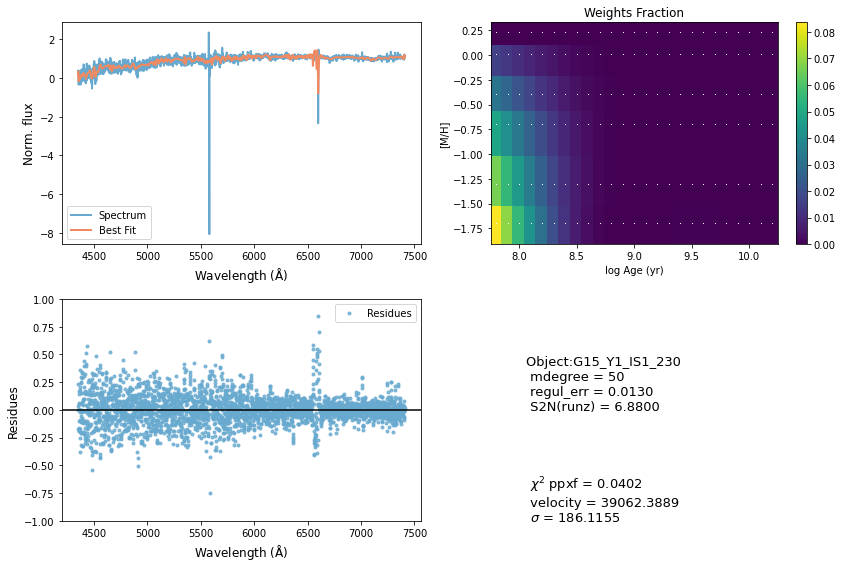

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43707      1000     0.003    -0.073
 comp.  1:     44408       950
 comp.  2:     45698       202
Gas Reddening E(B-V): 8.242
chi2/DOF: 0.002314
method = capfit; Jac calls: 24; Func calls: 1454; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.521         5   44408   950
Comp:  2       Unknown     0.9247       4.5   45698   202
Comp:  2       Unknown      0.174       3.1   45698   202
---------------------------------------------------------
Weighted <logAge> [yr]: 9.46
Weighted <[M/H]>: -0.189
Weighted <logAge> [yr]: 9.46
Weighted <[M/H]>: -0.189
M/L_r: 1.025
Current $\chi^2$: 0.0023
Elapsed time in PPXF: 29.46 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


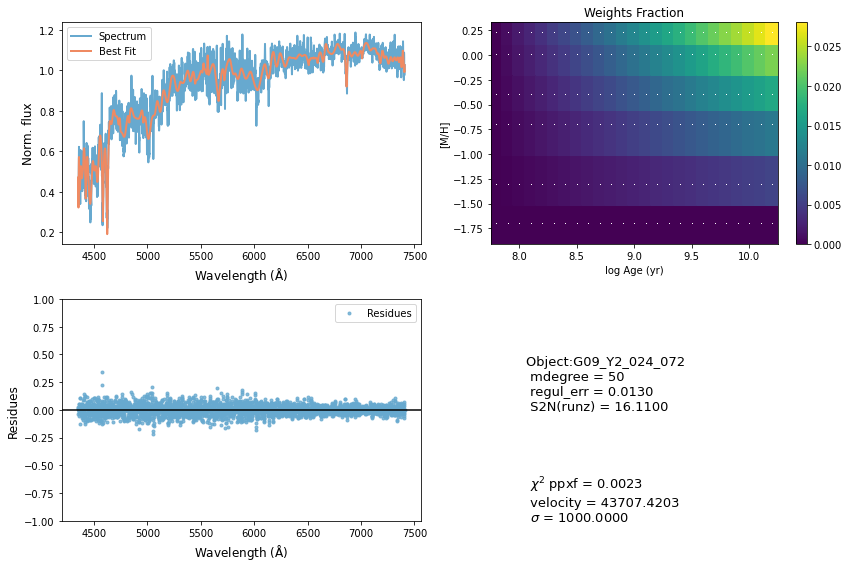

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46873       709    -0.080     0.072
 comp.  1:     47371        72
 comp.  2:     47343         1
Gas Reddening E(B-V): 7.455
chi2/DOF: 0.008491
method = capfit; Jac calls: 20; Func calls: 1205; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3502       1.2   47371    72
Comp:  2       Unknown          0     0.054   47343     1
Comp:  2       Unknown   4.03e-05      0.28   47343     1
Comp:  2       Unknown     0.1388       2.4   47343     1
Comp:  2       Unknown          0       1.2   47343     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.46
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.46
Weighted <[M/H]>: -1.11
M/L_r: 0.6923
Current $\chi^2$: 0.0085
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


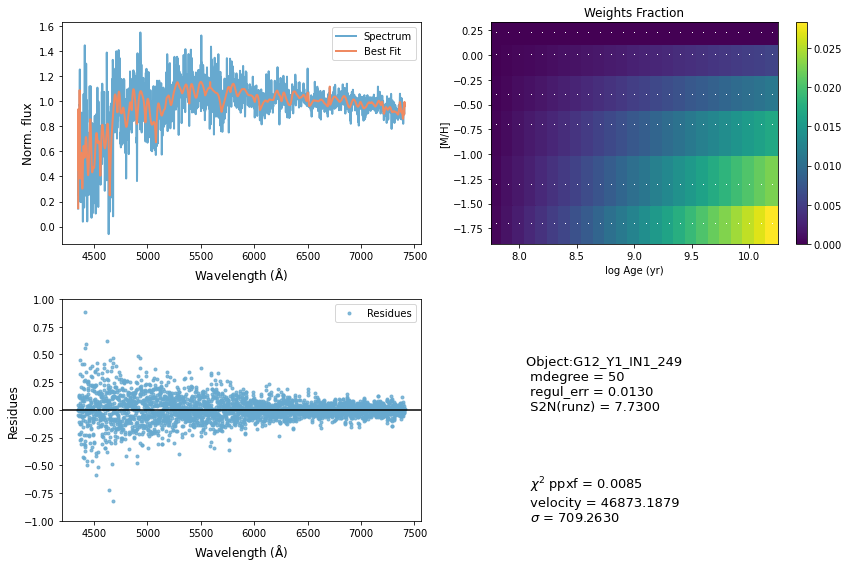

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43949       180     0.000     0.000
 comp.  1:     43949       180
 comp.  2:     43949       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004142
method = capfit; Jac calls: 1; Func calls: 65; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.1   43949   180
Comp:  2       Unknown          0       4.1   43949   180
Comp:  2       Unknown     0.3356       2.7   43949   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0041
Elapsed time in PPXF: 1.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


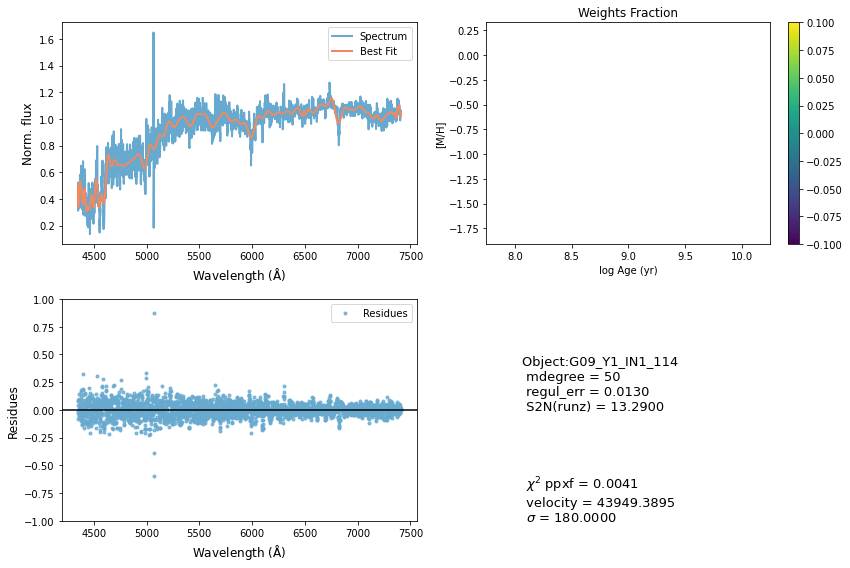

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53790       895    -0.112    -0.094
 comp.  1:     52277        96
 comp.  2:     52516       279
Gas Reddening E(B-V): 3.589
chi2/DOF: 0.003975
method = capfit; Jac calls: 11; Func calls: 670; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2143       1.6   52277    96
Comp:  2       Unknown      3.122        11   52516   279
Comp:  2       Unknown      2.045        11   52516   279
Comp:  2       Unknown     0.3628       5.4   52516   279
---------------------------------------------------------
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.605
Weighted <logAge> [yr]: 9.74
Weighted <[M/H]>: -0.605
M/L_r: 1.723
Current $\chi^2$: 0.0040
Elapsed time in PPXF: 12.49 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


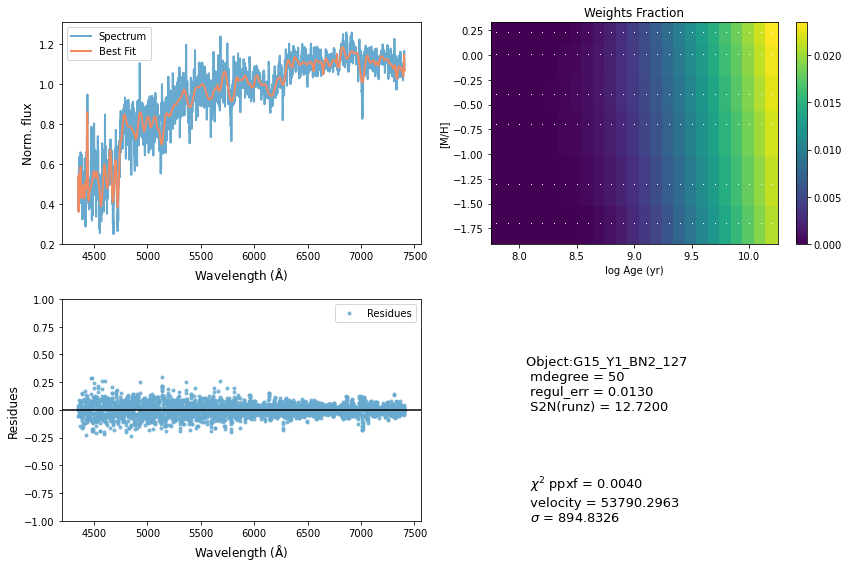

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35213      1000     0.006     0.032
 comp.  1:     35484       180
 comp.  2:     35417        79
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.01255
method = capfit; Jac calls: 13; Func calls: 795; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.1   35484   180
Comp:  2       Unknown     0.7565       2.6   35417    79
Comp:  2       Unknown     0.2218         2   35417    79
---------------------------------------------------------
Weighted <logAge> [yr]: 9.4
Weighted <[M/H]>: -1.12
Weighted <logAge> [yr]: 9.4
Weighted <[M/H]>: -1.12
M/L_r: 0.6255
Current $\chi^2$: 0.0126
Elapsed time in PPXF: 16.49 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


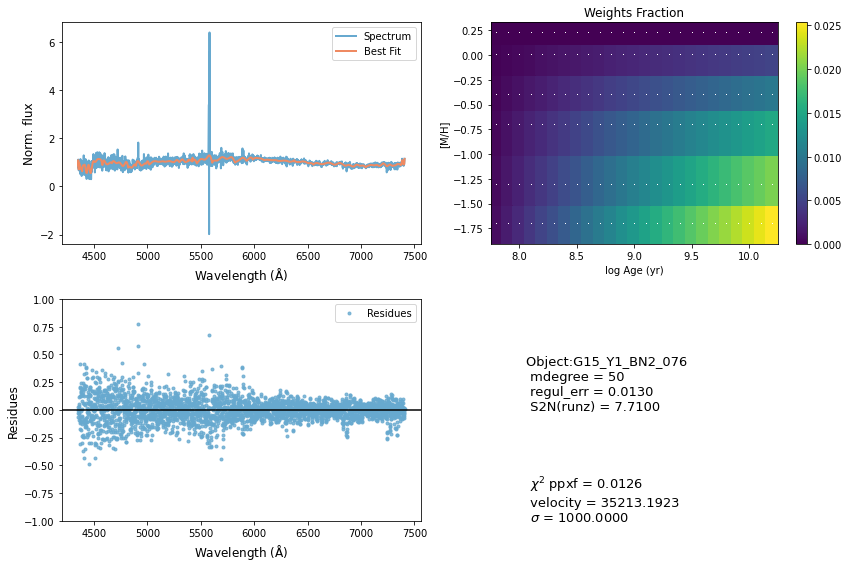

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44976      1000    -0.003    -0.073
 comp.  1:     47033        39
 comp.  2:     46854       238
Gas Reddening E(B-V): 3.690
chi2/DOF: 0.006878
method = capfit; Jac calls: 19; Func calls: 1152; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1861       1.3   47033    39
Comp:  2       Unknown      23.48         8   46854   238
Comp:  2       Unknown          0       8.6   46854   238
Comp:  2       Unknown     0.7631       7.7   46854   238
Comp:  2       Unknown          0       3.4   46854   238
---------------------------------------------------------
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.354
Weighted <logAge> [yr]: 9.7
Weighted <[M/H]>: -0.354
M/L_r: 1.738
Current $\chi^2$: 0.0069
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


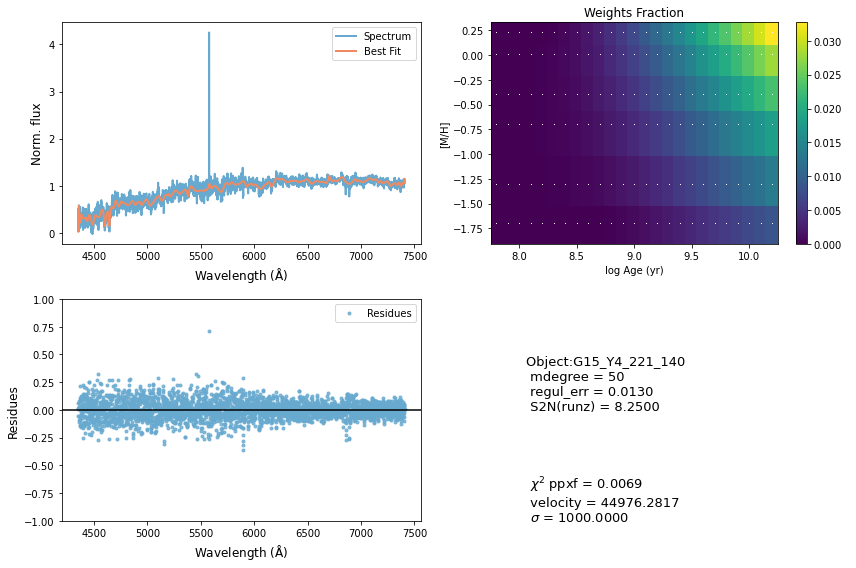

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     24136       233     0.041     0.036
 comp.  1:     24309       306
 comp.  2:     24080        77
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.005361
method = capfit; Jac calls: 14; Func calls: 846; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.7   24309   306
Comp:  2       Unknown          0       1.3   24080    77
Comp:  2       Unknown     0.0811       1.3   24080    77
Comp:  2       Unknown          0       2.6   24080    77
Comp:  2       Unknown     0.7978       2.2   24080    77
Comp:  2       Unknown          0       1.7   24080    77
---------------------------------------------------------
Weighted <logAge> [yr]: 9.38
Weighted <[M/H]>: -1.07
Weighted <logAge> [yr]: 9.38
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


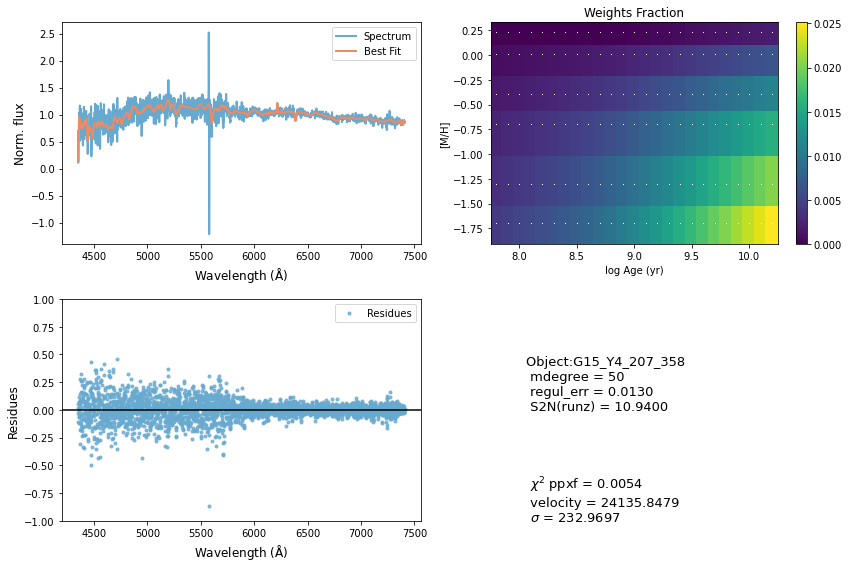

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47440       553    -0.002     0.019
 comp.  1:     45942        36
 comp.  2:     46006       106
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004989
method = capfit; Jac calls: 14; Func calls: 852; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  84 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2291       2.3   45942    36
Comp:  2       Unknown     0.4295       3.4   46006   106
Comp:  2       Unknown          0       2.1   46006   106
---------------------------------------------------------
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.95
Weighted <logAge> [yr]: 9.78
Weighted <[M/H]>: -0.95
M/L_r: 1.632
Current $\chi^2$: 0.0050
Elapsed time in PPXF: 17.21 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


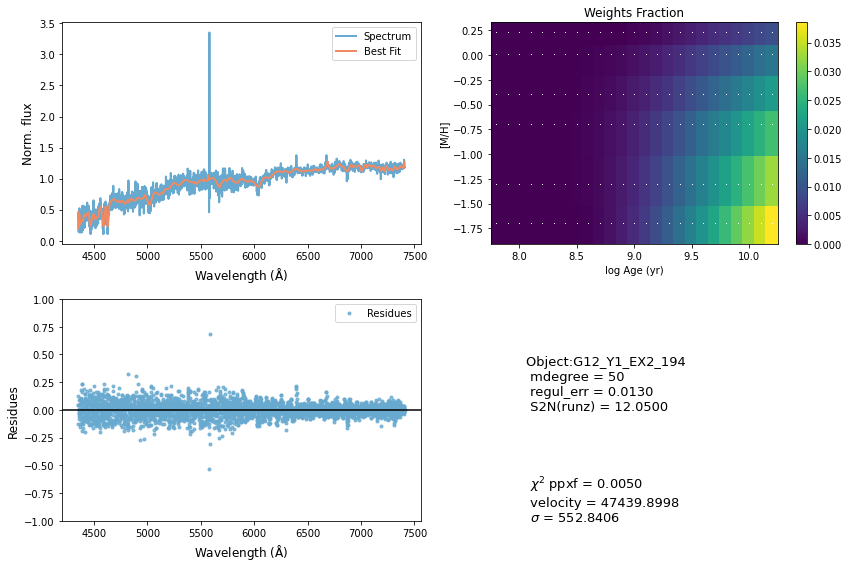

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52391       999     0.004    -0.001
 comp.  1:     54367        62
 comp.  2:     54815       172
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006654
method = capfit; Jac calls: 13; Func calls: 790; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4662       2.5   54367    62
Comp:  2       Unknown          0       6.5   54815   172
Comp:  2       Unknown      3.312       6.6   54815   172
Comp:  2       Unknown      0.907       4.9   54815   172
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0067
Elapsed time in PPXF: 10.26 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


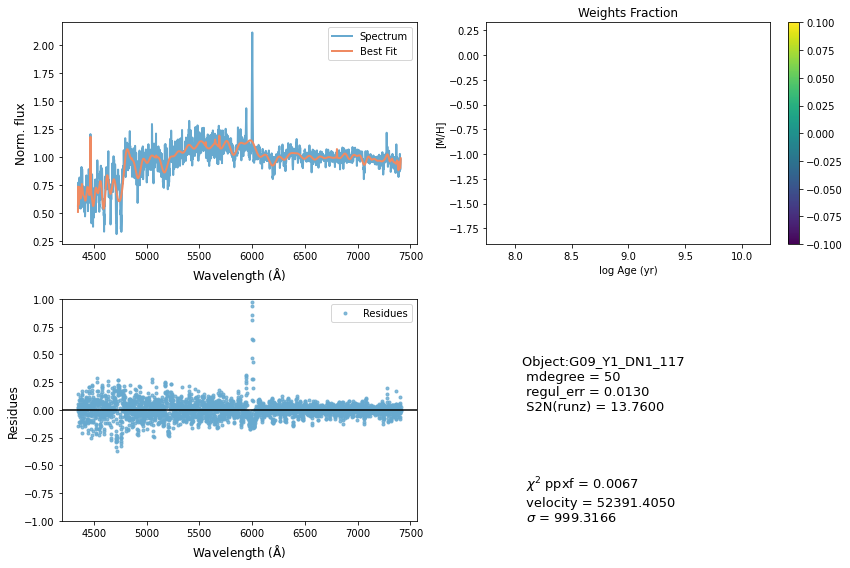

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41094       321     0.000     0.002
 comp.  1:     40844       242
 comp.  2:     40977        20
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006756
method = capfit; Jac calls: 17; Func calls: 1027; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  120 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.332       4.1   40844   242
Comp:  2       Unknown     0.6842       2.4   40977    20
Comp:  2       Unknown    0.02326       1.3   40977    20
---------------------------------------------------------
Weighted <logAge> [yr]: 9.28
Weighted <[M/H]>: -0.211
Weighted <logAge> [yr]: 9.28
Weighted <[M/H]>: -0.211
M/L_r: 0.7292
Current $\chi^2$: 0.0068
Elapsed time in PPXF: 22.82 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


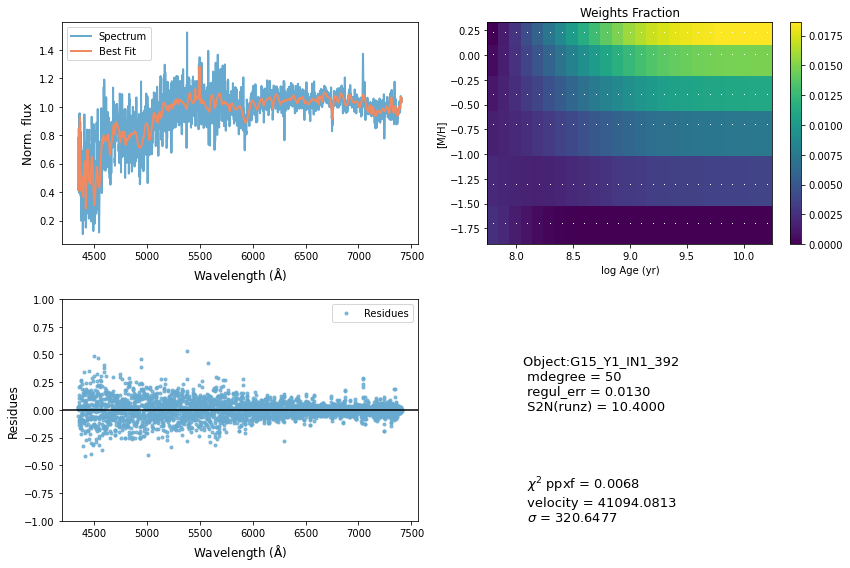

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53985       258    -0.069    -0.130
 comp.  1:     54126         1
 comp.  2:     54391       354
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.002559
method = capfit; Jac calls: 8; Func calls: 497; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       0.02       1.1   54126     1
Comp:  2       Unknown      56.26   4.1e+02   54391   354
Comp:  2       Unknown      61.92   4.2e+02   54391   354
Comp:  2       Unknown      1.405       6.6   54391   354
---------------------------------------------------------
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.81
Weighted <[M/H]>: -1.11
M/L_r: 1.679
Current $\chi^2$: 0.0026
Elapsed time in PPXF: 10.34 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


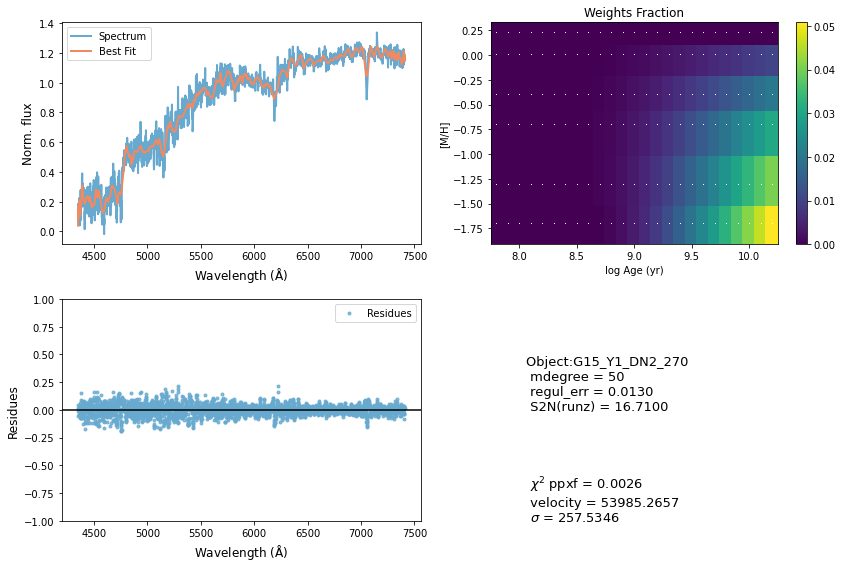

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54953         1    -0.033    -0.033
 comp.  1:     54704       180
 comp.  2:     54644       157
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.003978
method = capfit; Jac calls: 2; Func calls: 126; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         2   54704   180
Comp:  2       Unknown      13.26   3.7e+02   54644   157
Comp:  2       Unknown      12.98   3.8e+02   54644   157
Comp:  2       Unknown  0.0009542       4.6   54644   157
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0040
Elapsed time in PPXF: 2.46 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


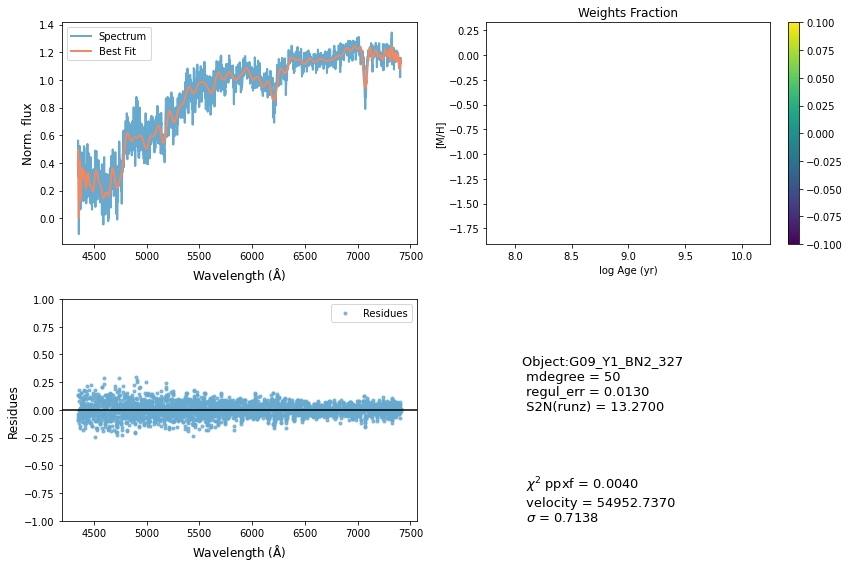

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52689       462     0.117     0.045
 comp.  1:     52434       302
 comp.  2:     52377       115
Gas Reddening E(B-V): 1.401
chi2/DOF: 0.008605
method = capfit; Jac calls: 21; Func calls: 1269; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.547       2.7   52434   302
Comp:  2       Unknown          0       6.9   52377   115
Comp:  2       Unknown      4.396         7   52377   115
Comp:  2       Unknown     0.2008       3.9   52377   115
---------------------------------------------------------
Weighted <logAge> [yr]: 9.24
Weighted <[M/H]>: -0.199
Weighted <logAge> [yr]: 9.24
Weighted <[M/H]>: -0.199
M/L_r: 0.5075
Current $\chi^2$: 0.0086
Elapsed time in PPXF: 27.43 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


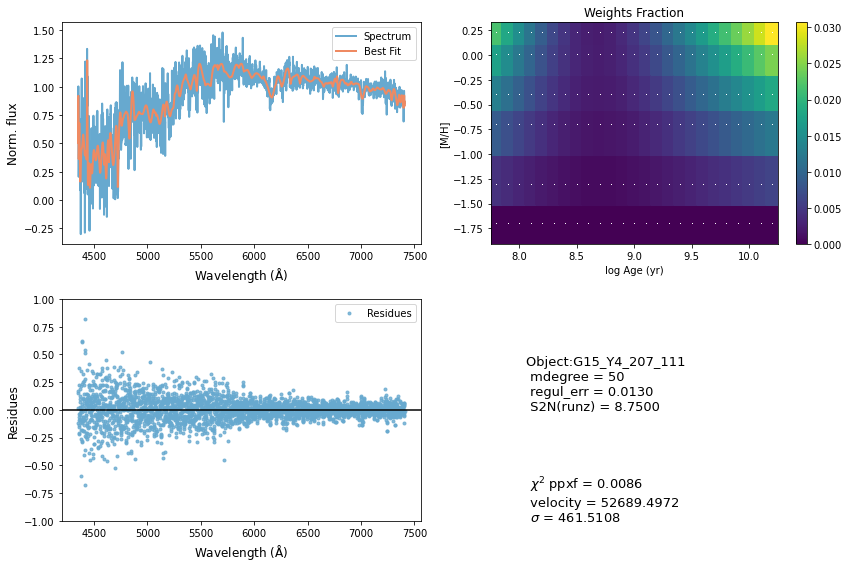

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     26170       531     0.112     0.191
 comp.  1:     26183       590
 comp.  2:     26347       226
Gas Reddening E(B-V): 8.274
chi2/DOF: 0.002488
method = capfit; Jac calls: 17; Func calls: 1032; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      15.56       4.3   26183   590
Comp:  2       Unknown     0.6238       2.5   26347   226
Comp:  2       Unknown          0       2.5   26347   226
Comp:  2       Unknown     0.8789       4.3   26347   226
Comp:  2       Unknown     0.1574       3.5   26347   226
Comp:  2       Unknown          0       3.1   26347   226
---------------------------------------------------------
Weighted <logAge> [yr]: 9.03
Weighted <[M/H]>: -1.11
Weighted <logAge> [yr]: 9.03
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


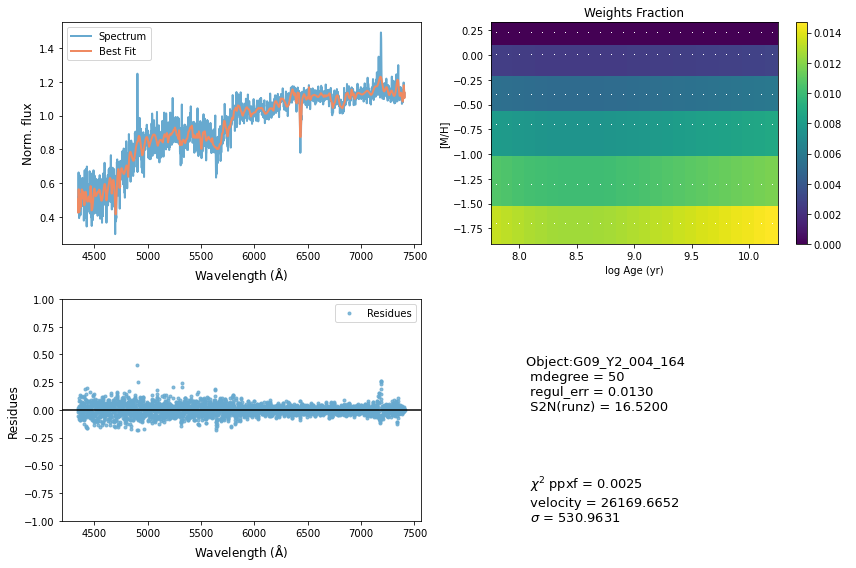

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62967      1000    -0.049    -0.049
 comp.  1:     60967       180
 comp.  2:     60967       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01497
method = capfit; Jac calls: 1; Func calls: 66; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  24 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.2   60967   180
Comp:  2       Unknown          0       6.4   60967   180
Comp:  2       Unknown          0       6.4   60967   180
Comp:  2       Unknown          0       3.6   60967   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.1
M/L_r: 0.1585
Current $\chi^2$: 0.0150
Elapsed time in PPXF: 0.89 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


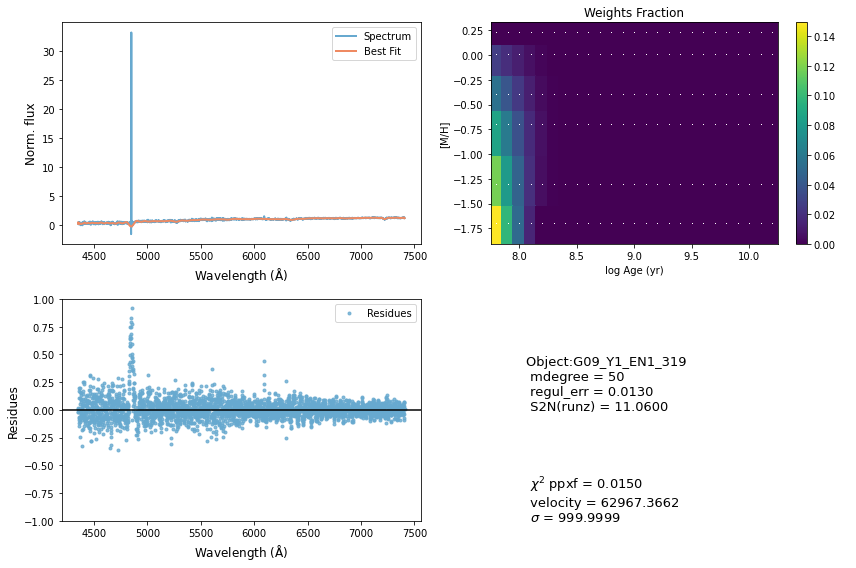

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46057      1000     0.153    -0.059
 comp.  1:     44559       188
 comp.  2:     43859       335
Gas Reddening E(B-V): 6.422
chi2/DOF: 0.001519
method = capfit; Jac calls: 18; Func calls: 1092; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1886       2.8   44559   188
Comp:  2       Unknown      1.451       5.4   43859   335
Comp:  2       Unknown          0       4.8   43859   335
---------------------------------------------------------
Weighted <logAge> [yr]: 9.57
Weighted <[M/H]>: -0.192
Weighted <logAge> [yr]: 9.57
Weighted <[M/H]>: -0.192
M/L_r: 1.307
Current $\chi^2$: 0.0015
Elapsed time in PPXF: 24.30 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


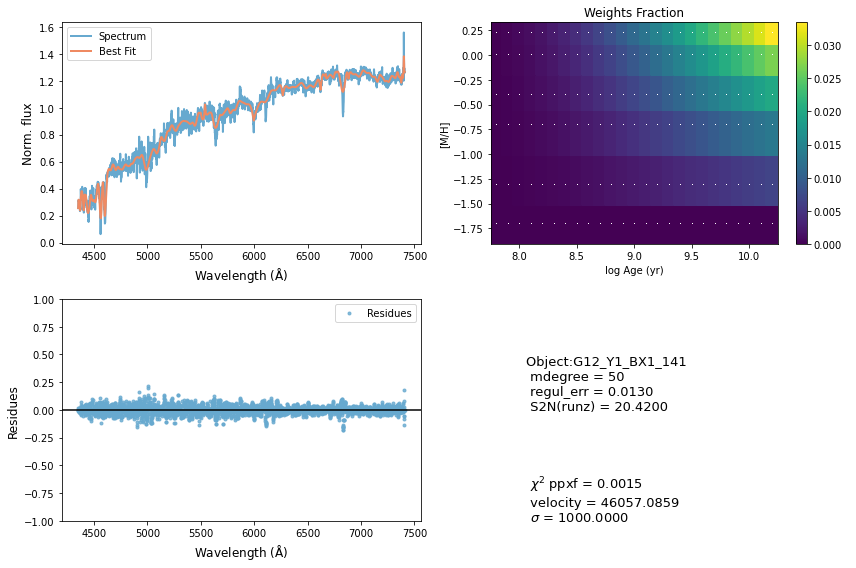

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62931       982     0.174     0.154
 comp.  1:     62696      1000
 comp.  2:     63545      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 2.675
method = capfit; Jac calls: 14; Func calls: 856; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  81 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      612.3        13   62696  1000
Comp:  2       Unknown      134.6        44   63545  1000
Comp:  2       Unknown          0        44   63545  1000
Comp:  2       Unknown          0        11   63545  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -0.499
Weighted <logAge> [yr]: 9.68
Weighted <[M/H]>: -0.499
M/L_r: 1.527
Current $\chi^2$: 2.6749
Elapsed time in PPXF: 16.88 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


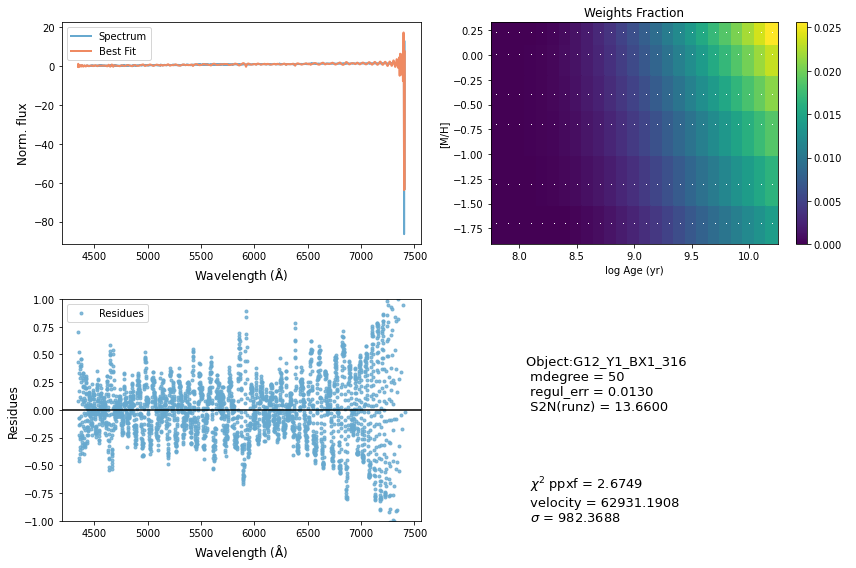

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41469       753     0.009     0.013
 comp.  1:     40962        70
 comp.  2:     40808        26
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00375
method = capfit; Jac calls: 17; Func calls: 1033; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  94 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3611       2.6   40962    70
Comp:  2       Unknown     0.6672       2.4   40808    26
Comp:  2       Unknown          0       1.4   40808    26
---------------------------------------------------------
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: -0.292
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: -0.292
M/L_r: 1.594
Current $\chi^2$: 0.0038
Elapsed time in PPXF: 23.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


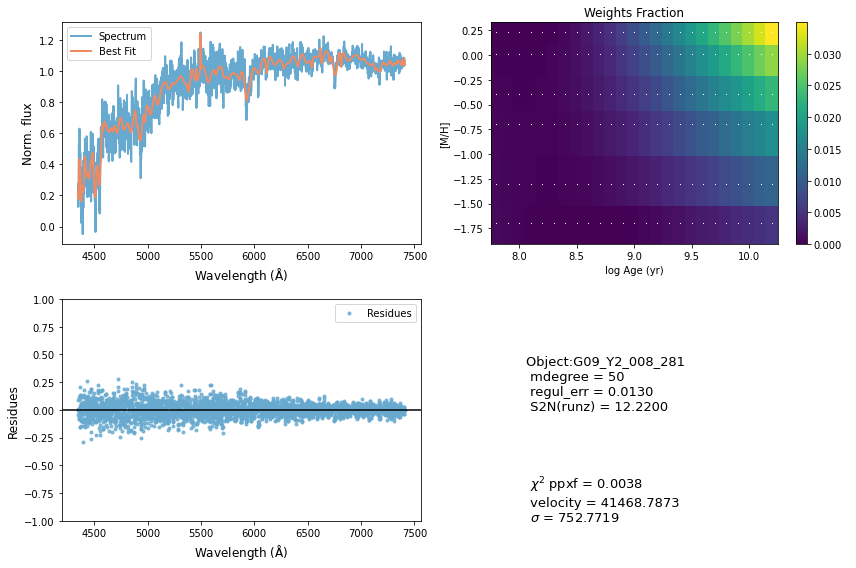

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[SII]6716' '[SII]6731' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     28621       129    -0.063    -0.122
 comp.  1:     28537       297
 comp.  2:     28908       808
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004606
method = capfit; Jac calls: 7; Func calls: 425; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7923       5.7   28537   297
Comp:  2       Unknown          0       8.9   28908   808
Comp:  2       Unknown          0       8.9   28908   808
Comp:  2       Unknown      1.872       8.2   28908   808
Comp:  2       Unknown          0         6   28908   808
Comp:  2       Unknown      17.06       5.9   28908   808
---------------------------------------------------------
Weighted <logAge> [yr]: 7.87
Weighted <[M/H]>: -1.25
Weighted <logAge> [yr]: 7.87
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


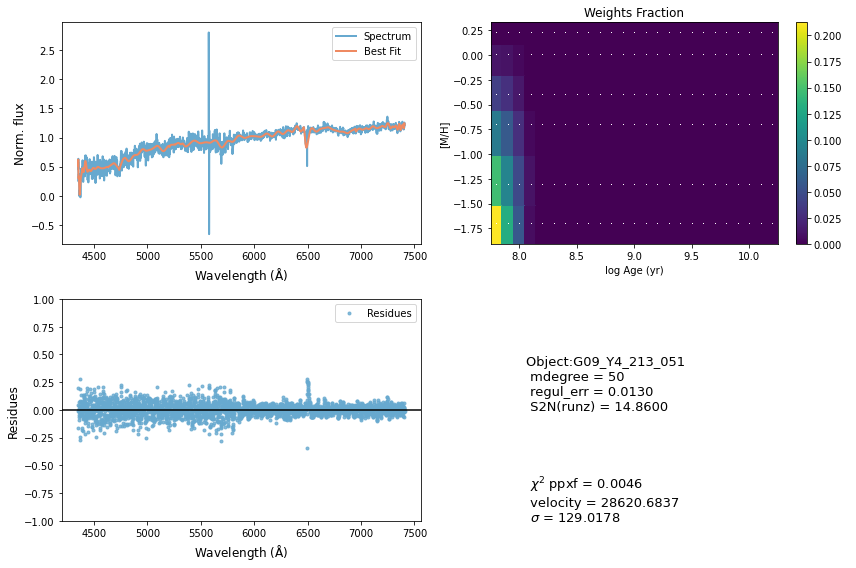

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54860       183    -0.002    -0.002
 comp.  1:     54862       181
 comp.  2:     54864       177
Gas Reddening E(B-V): 0.043
chi2/DOF: 0.005981
method = capfit; Jac calls: 1; Func calls: 68; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1608       3.9   54862   181
Comp:  2       Unknown          0       5.7   54864   177
Comp:  2       Unknown          0       5.6   54864   177
Comp:  2       Unknown     0.5595       5.7   54864   177
---------------------------------------------------------
Weighted <logAge> [yr]: 9.27
Weighted <[M/H]>: -1.37
Weighted <logAge> [yr]: 9.27
Weighted <[M/H]>: -1.37
M/L_r: 0.611
Current $\chi^2$: 0.0060
Elapsed time in PPXF: 1.39 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


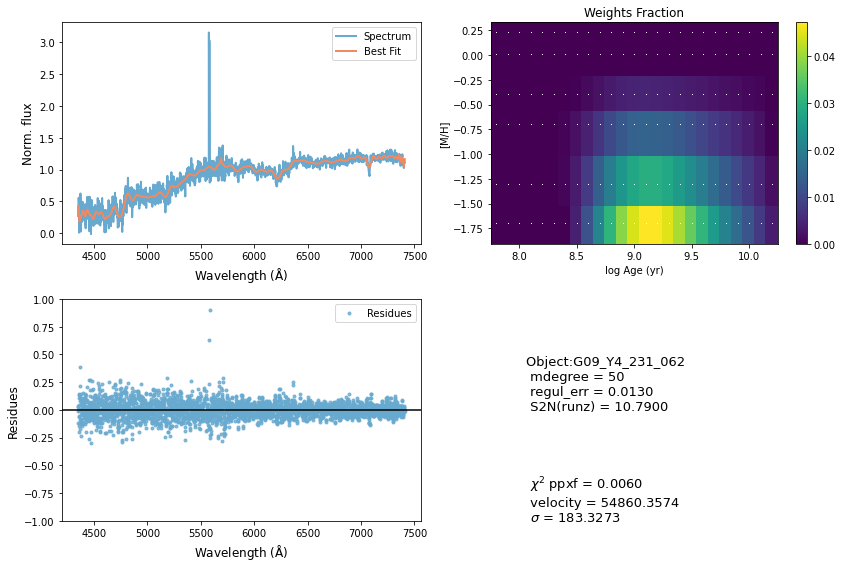

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33453       431     0.043     0.163
 comp.  1:     33453       372
 comp.  2:     33451       429
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.001887
method = capfit; Jac calls: 17; Func calls: 1033; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  60 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.502       6.6   33453   372
Comp:  2       Unknown          0         6   33451   429
Comp:  2       Unknown      0.713       4.8   33451   429
Comp:  2       Unknown      5.795         5   33451   429
---------------------------------------------------------
Weighted <logAge> [yr]: 9.14
Weighted <[M/H]>: -0.208
Weighted <logAge> [yr]: 9.14
Weighted <[M/H]>: -0.208
M/L_r: 0.6389
Current $\chi^2$: 0.0019
Elapsed time in PPXF: 19.94 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


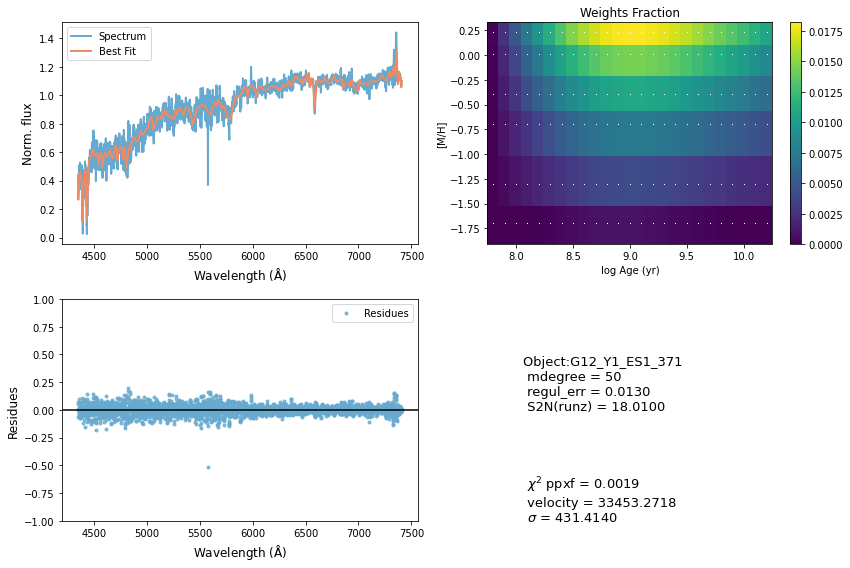

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60128       649     0.010    -0.052
 comp.  1:     60044       148
 comp.  2:     59879       135
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.006367
method = capfit; Jac calls: 14; Func calls: 852; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.9   60044   148
Comp:  2       Unknown      51.33   2.2e+02   59879   135
Comp:  2       Unknown      53.06   2.3e+02   59879   135
Comp:  2       Unknown     0.7911       3.4   59879   135
---------------------------------------------------------
Weighted <logAge> [yr]: 9.6
Weighted <[M/H]>: -0.208
Weighted <logAge> [yr]: 9.6
Weighted <[M/H]>: -0.208
M/L_r: 1.369
Current $\chi^2$: 0.0064
Elapsed time in PPXF: 21.62 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


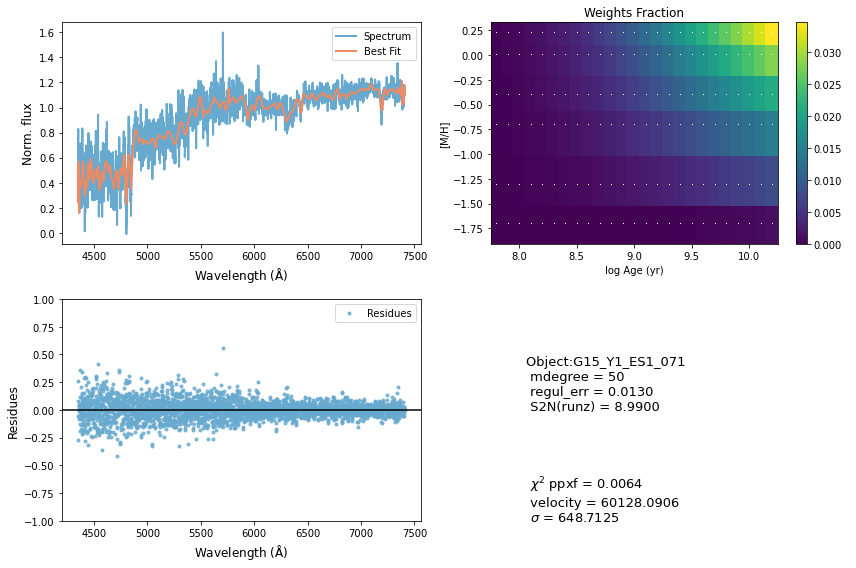

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30593       254    -0.103    -0.089
 comp.  1:     30513       280
 comp.  2:     31446       712
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004878
method = capfit; Jac calls: 13; Func calls: 785; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  74 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.571         5   30513   280
Comp:  2       Unknown          0       7.6   31446   712
Comp:  2       Unknown     0.2698       5.7   31446   712
Comp:  2       Unknown      9.537         5   31446   712
---------------------------------------------------------
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.44
Weighted <logAge> [yr]: 9.77
Weighted <[M/H]>: -0.44
M/L_r: 2.042
Current $\chi^2$: 0.0049
Elapsed time in PPXF: 15.93 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


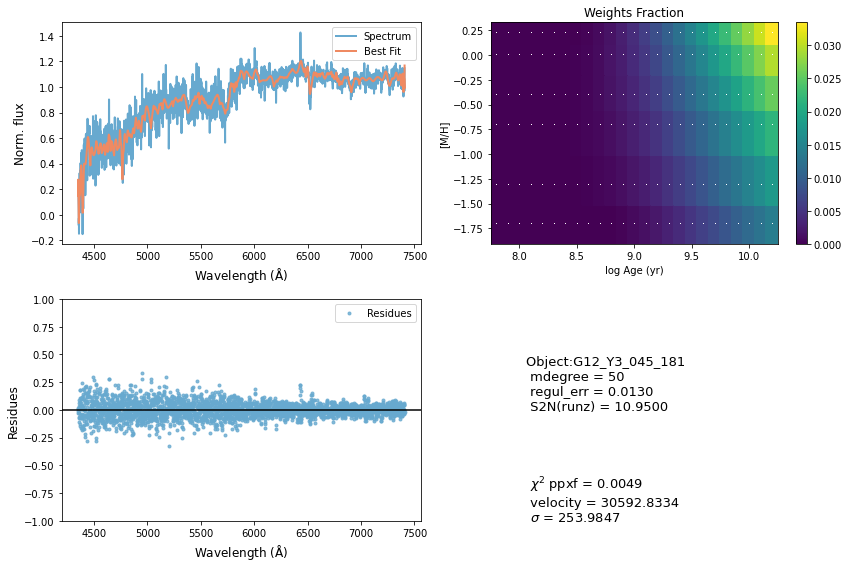

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     66025      1000    -0.005     0.054
 comp.  1:     66324        93
 comp.  2:     66036       527
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02469
method = capfit; Jac calls: 9; Func calls: 553; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  75 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.772       3.7   66324    93
Comp:  2       Unknown      1.683        23   66036   527
Comp:  2       Unknown       4.33        23   66036   527
Comp:  2       Unknown     0.9839       8.9   66036   527
---------------------------------------------------------
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.415
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.415
M/L_r: 2.178
Current $\chi^2$: 0.0247
Elapsed time in PPXF: 13.92 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


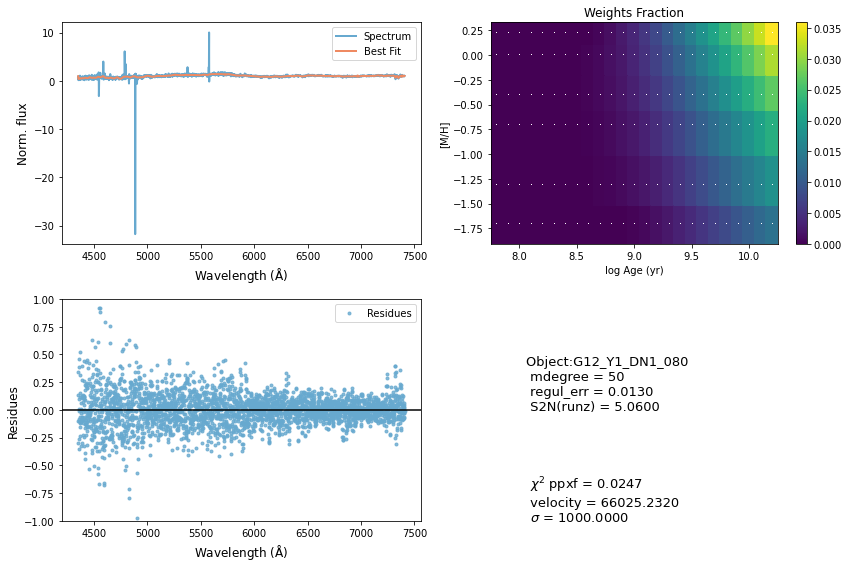

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46556      1000     0.031    -0.062
 comp.  1:     48186       291
 comp.  2:     48142       394
Gas Reddening E(B-V): 4.732
chi2/DOF: 0.003979
method = capfit; Jac calls: 18; Func calls: 1091; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4391       2.5   48186   291
Comp:  2       Unknown      1.899        16   48142   394
Comp:  2       Unknown      44.23        17   48142   394
Comp:  2       Unknown          0       6.5   48142   394
Comp:  2       Unknown     0.9678       4.1   48142   394
---------------------------------------------------------
Weighted <logAge> [yr]: 9.3
Weighted <[M/H]>: -0.191
Weighted <logAge> [yr]: 9.3
Weighted <[M/H]>: -0.191
M/L_r: 0.7192
Current $\chi^2$: 0.0040
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


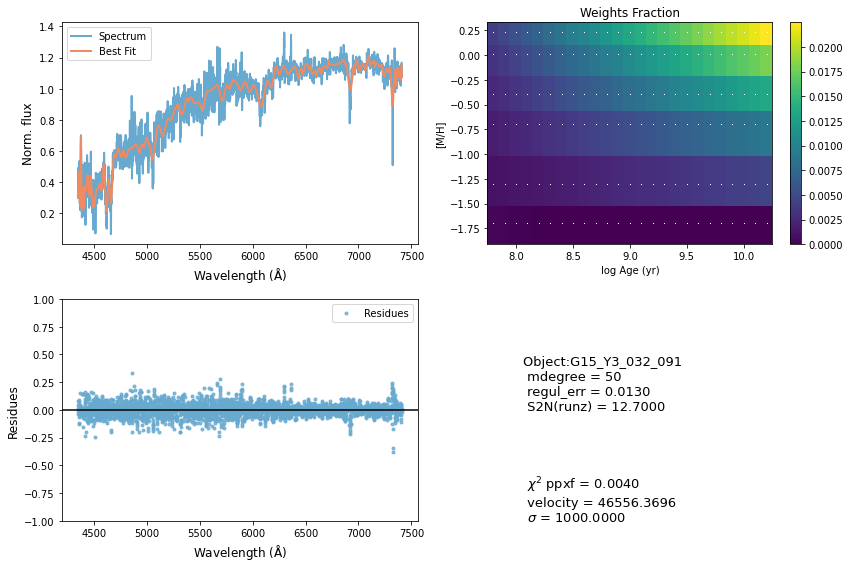

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72540      1000    -0.003    -0.114
 comp.  1:     74420         1
 comp.  2:     74637       102
Gas Reddening E(B-V): 3.893
chi2/DOF: 0.01662
method = capfit; Jac calls: 13; Func calls: 789; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7447       1.1   74420     1
Comp:  2       Unknown    0.02441       3.3   74637   102
Comp:  2       Unknown      1.378       3.3   74637   102
Comp:  2       Unknown          0       2.7   74637   102
---------------------------------------------------------
Weighted <logAge> [yr]: 8.69
Weighted <[M/H]>: -0.502
Weighted <logAge> [yr]: 8.69
Weighted <[M/H]>: -0.502
M/L_r: 0.3518
Current $\chi^2$: 0.0166
Elapsed time in PPXF: 14.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


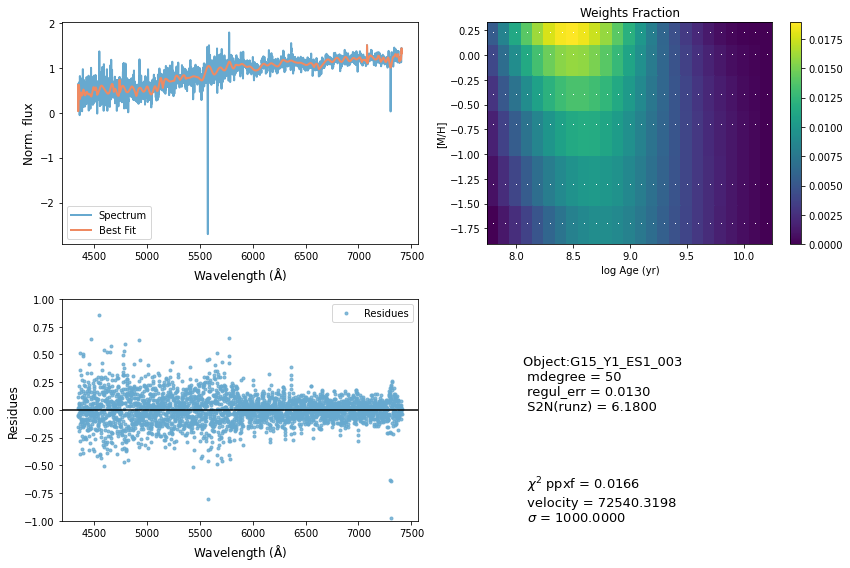

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34938       342    -0.025     0.024
 comp.  1:     35022        38
 comp.  2:     34855       180
Gas Reddening E(B-V): 5.982
chi2/DOF: 0.004435
method = capfit; Jac calls: 11; Func calls: 667; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1413       1.1   35022    38
Comp:  2       Unknown          0       4.1   34855   180
Comp:  2       Unknown          0       3.2   34855   180
Comp:  2       Unknown    0.02867       2.5   34855   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.03
Weighted <[M/H]>: -1.13
Weighted <logAge> [yr]: 8.03
Weighted <[M/H]>: -1.13
M/L_r: 0.1648
Current $\chi^2$: 0.0044
Elapsed time in PPXF: 11.29 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


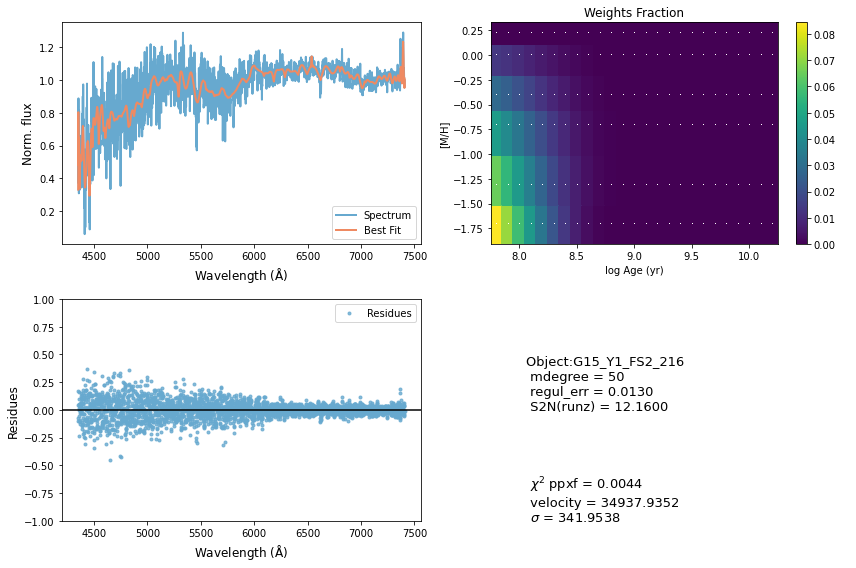

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64472       382     0.024     0.035
 comp.  1:     64820       180
 comp.  2:     64646       205
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.005704
method = capfit; Jac calls: 3; Func calls: 190; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.2   64820   180
Comp:  2       Unknown          0         8   64646   205
Comp:  2       Unknown          0       8.1   64646   205
Comp:  2       Unknown      2.625       4.6   64646   205
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.0361
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.0361
M/L_r: 4.956
Current $\chi^2$: 0.0057
Elapsed time in PPXF: 2.71 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


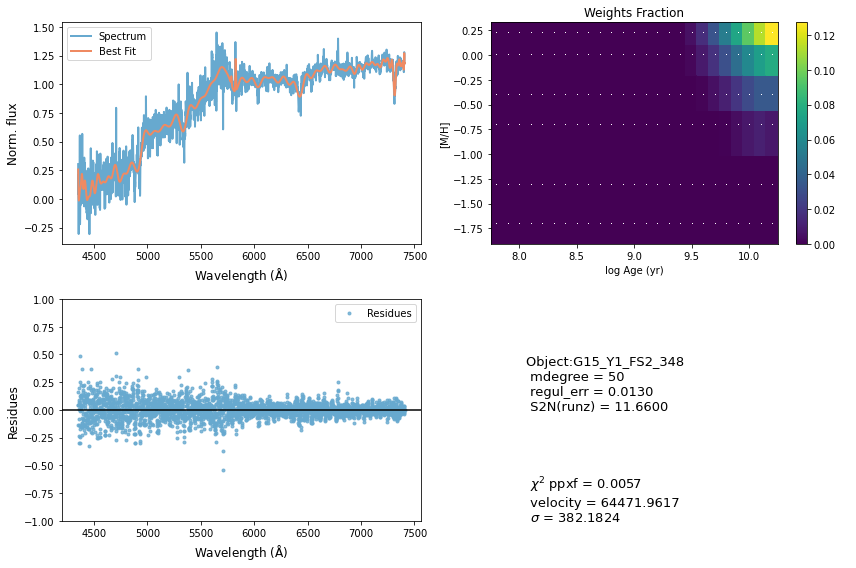

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     29790       354     0.069     0.064
 comp.  1:     29914        28
 comp.  2:     29598       556
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006291
method = capfit; Jac calls: 14; Func calls: 849; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  79 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.597         2   29914    28
Comp:  2       Unknown       1.94       7.3   29598   556
Comp:  2       Unknown      1.322       4.9   29598   556
Comp:  2       Unknown          0       3.8   29598   556
---------------------------------------------------------
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.445
Weighted <logAge> [yr]: 9.79
Weighted <[M/H]>: -0.445
M/L_r: 2.16
Current $\chi^2$: 0.0063
Elapsed time in PPXF: 14.58 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


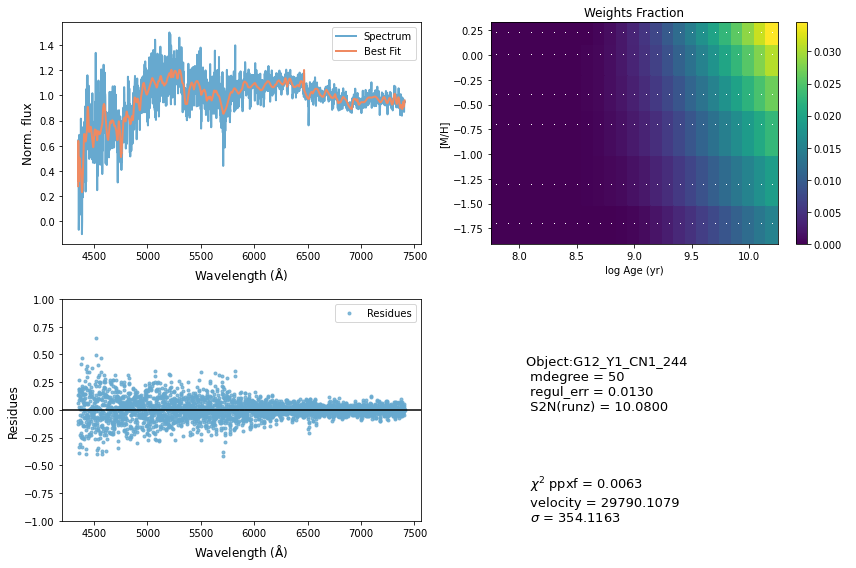

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72671       197    -0.022    -0.049
 comp.  1:     72597       141
 comp.  2:     72440       313
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.008462
method = capfit; Jac calls: 14; Func calls: 843; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  18 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       1.99       4.2   72597   141
Comp:  2       Unknown      2.188       9.9   72440   313
Comp:  2       Unknown          0       9.9   72440   313
Comp:  2       Unknown     0.4513       5.4   72440   313
---------------------------------------------------------
Weighted <logAge> [yr]: 7.97
Weighted <[M/H]>: -1.08
Weighted <logAge> [yr]: 7.97
Weighted <[M/H]>: -1.08
M/L_r: 0.1615
Current $\chi^2$: 0.0085
Elapsed time in PPXF: 16.17 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


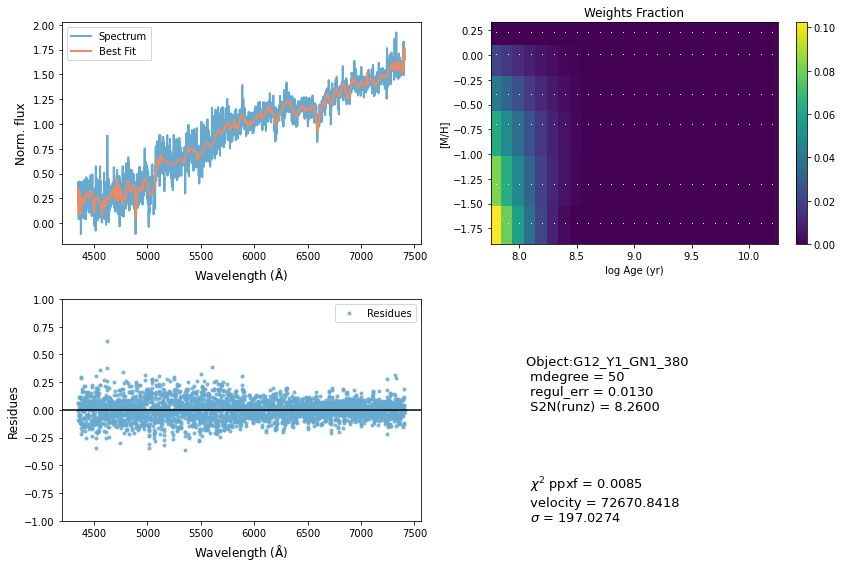

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43111      1000    -0.013    -0.012
 comp.  1:     41111       180
 comp.  2:     41051       194
Gas Reddening E(B-V): 9.478
chi2/DOF: 0.008444
method = capfit; Jac calls: 3; Func calls: 185; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.8   41111   180
Comp:  2       Unknown      1.088       4.1   41051   194
Comp:  2       Unknown     0.8618       2.7   41051   194
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.264
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: -0.264
M/L_r: 2.86
Current $\chi^2$: 0.0084
Elapsed time in PPXF: 3.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


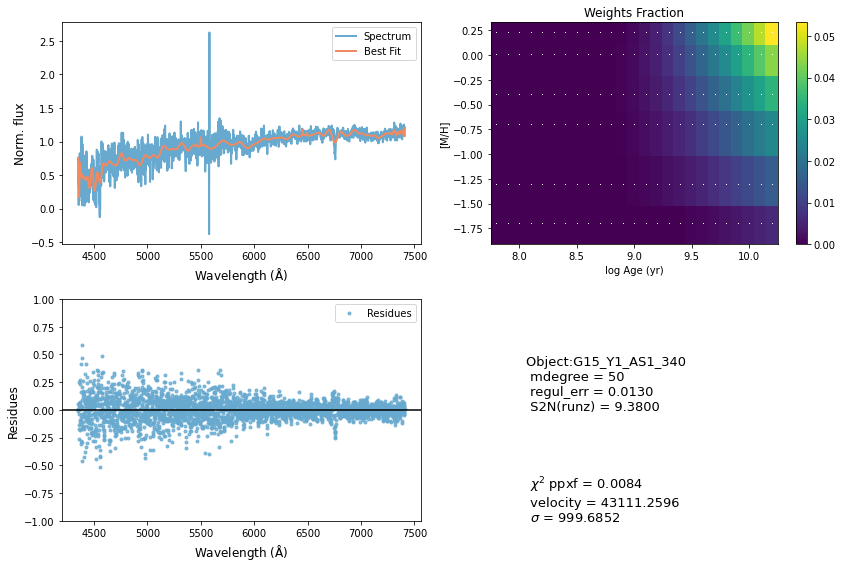

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     67605      1000    -0.030     0.098
 comp.  1:     65657       180
 comp.  2:     65767       497
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005892
method = capfit; Jac calls: 15; Func calls: 910; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  33 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.8   65657   180
Comp:  2       Unknown     0.5235        18   65767   497
Comp:  2       Unknown          0        18   65767   497
Comp:  2       Unknown      3.544       7.1   65767   497
---------------------------------------------------------
Weighted <logAge> [yr]: 8.07
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 8.07
Weighted <[M/H]>: -1.1
M/L_r: 0.1697
Current $\chi^2$: 0.0059
Elapsed time in PPXF: 17.07 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


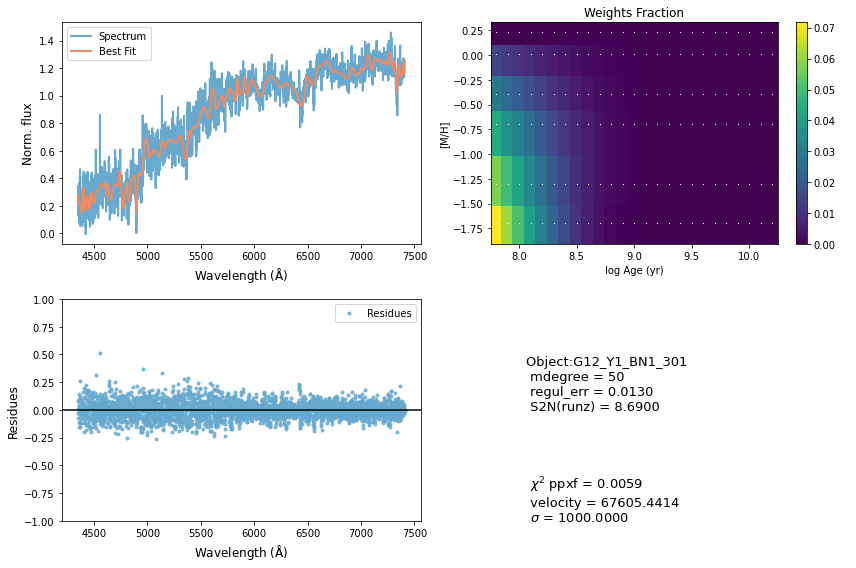

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44986       180    -0.002    -0.002
 comp.  1:     44935       440
 comp.  2:     44986       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01667
method = capfit; Jac calls: 7; Func calls: 425; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.191       6.7   44935   440
Comp:  2       Unknown  0.0004927       4.3   44986   180
Comp:  2       Unknown          0       3.1   44986   180
---------------------------------------------------------
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
Weighted <logAge> [yr]: nan
Weighted <[M/H]>: nan
M/L_r: nan
Current $\chi^2$: 0.0167
Elapsed time in PPXF: 7.30 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: RuntimeWarning: invalid value encountered in true_divide


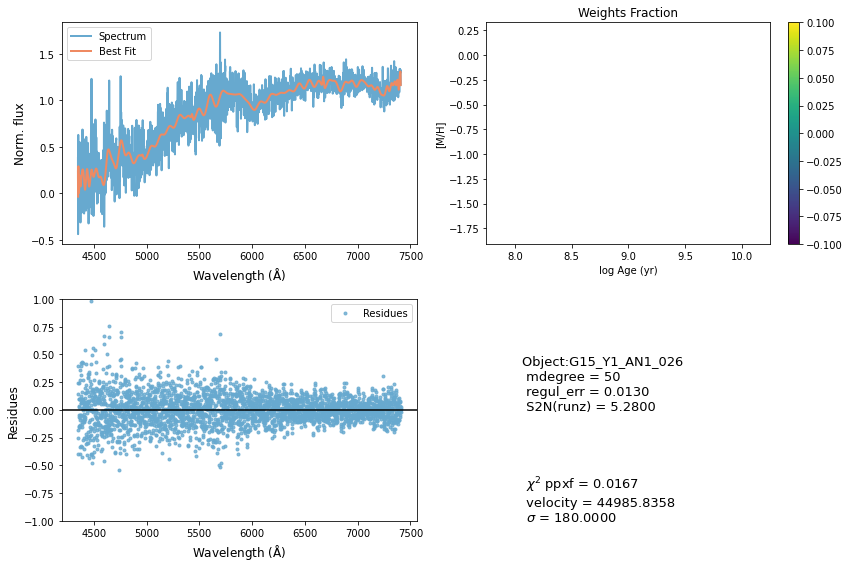

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47089       235    -0.019     0.007
 comp.  1:     46878       367
 comp.  2:     47110       771
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.002228
method = capfit; Jac calls: 8; Func calls: 488; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  9 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.806       6.1   46878   367
Comp:  2       Unknown          0        41   47110   771
Comp:  2       Unknown          0        43   47110   771
Comp:  2       Unknown      0.964       9.6   47110   771
Comp:  2       Unknown          0       5.8   47110   771
---------------------------------------------------------
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.16
Weighted <logAge> [yr]: 7.89
Weighted <[M/H]>: -1.16
M/L_r: 0.1577
Current $\chi^2$: 0.0022
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


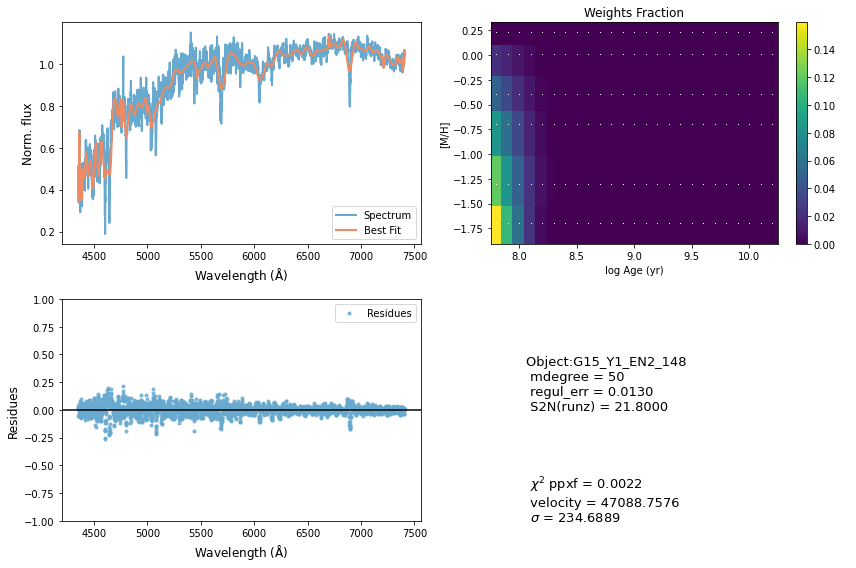

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36645       592    -0.085    -0.126
 comp.  1:     36448       545
 comp.  2:     36186       142
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.004146
method = capfit; Jac calls: 19; Func calls: 1152; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.784         3   36448   545
Comp:  2       Unknown     0.5436       3.5   36186   142
Comp:  2       Unknown    0.03427       2.5   36186   142
---------------------------------------------------------
Weighted <logAge> [yr]: 8.1
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 8.1
Weighted <[M/H]>: -1.1
M/L_r: 0.1731
Current $\chi^2$: 0.0041
Elapsed time in PPXF: 25.00 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


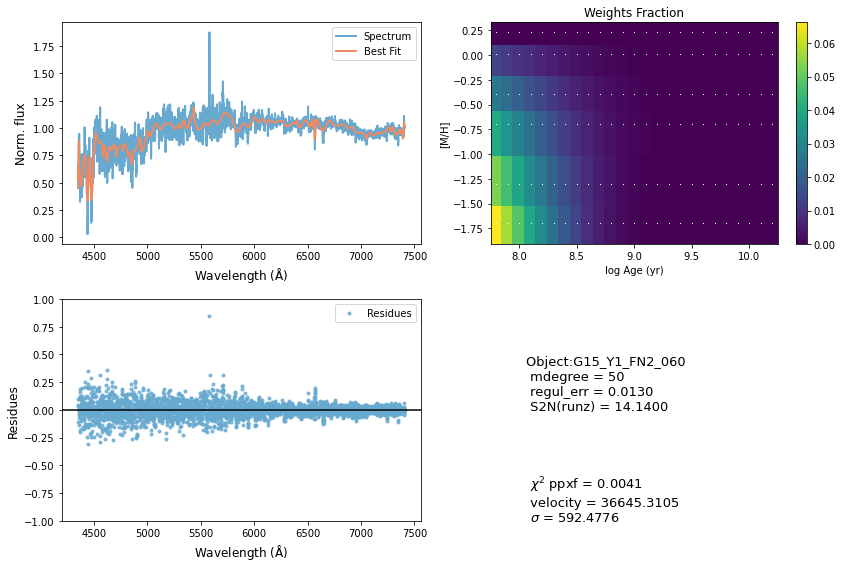

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36799       154    -0.060    -0.055
 comp.  1:     36963       135
 comp.  2:     37009        97
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004434
method = capfit; Jac calls: 26; Func calls: 1568; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  141 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4488       3.5   36963   135
Comp:  2       Unknown     0.4292       3.2   37009    97
Comp:  2       Unknown     0.0223         2   37009    97
---------------------------------------------------------
Weighted <logAge> [yr]: 9.26
Weighted <[M/H]>: -0.657
Weighted <logAge> [yr]: 9.26
Weighted <[M/H]>: -0.657
M/L_r: 0.5854
Current $\chi^2$: 0.0044
Elapsed time in PPXF: 32.69 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


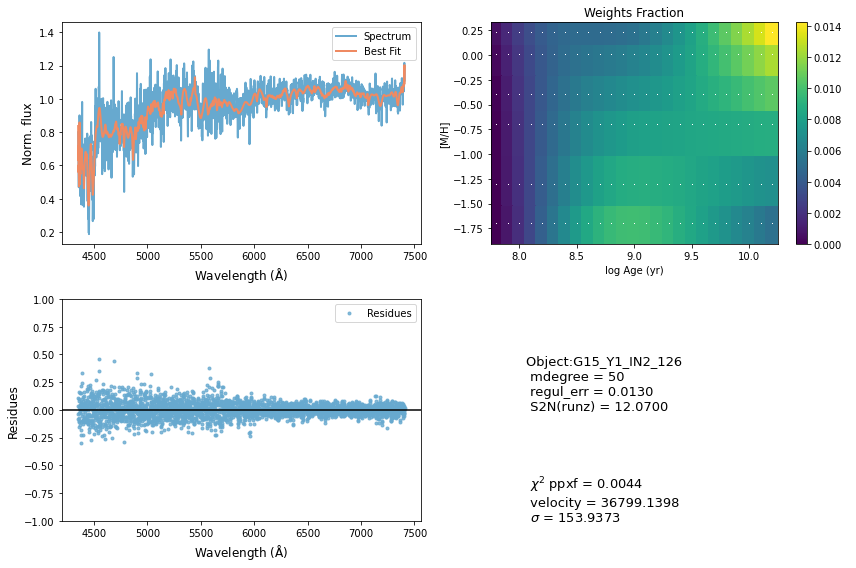

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44109      1000     0.023     0.013
 comp.  1:     42519       180
 comp.  2:     42646        65
Gas Reddening E(B-V): 8.661
chi2/DOF: 0.01309
method = capfit; Jac calls: 16; Func calls: 967; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.9   42519   180
Comp:  2       Unknown     0.7643       2.7   42646    65
Comp:  2       Unknown     0.3202       1.8   42646    65
---------------------------------------------------------
Weighted <logAge> [yr]: 9.56
Weighted <[M/H]>: -0.996
Weighted <logAge> [yr]: 9.56
Weighted <[M/H]>: -0.996
M/L_r: 0.8958
Current $\chi^2$: 0.0131
Elapsed time in PPXF: 19.37 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


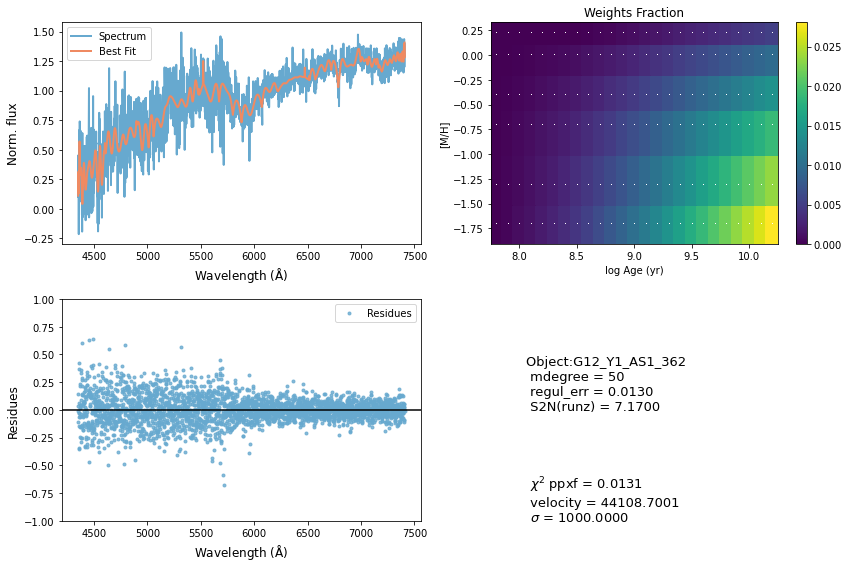

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38418       103    -0.001     0.007
 comp.  1:     38476       182
 comp.  2:     38623        48
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.02372
method = capfit; Jac calls: 12; Func calls: 731; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9783       1.7   38476   182
Comp:  2       Unknown          0       1.4   38623    48
Comp:  2       Unknown     0.4653       1.5   38623    48
---------------------------------------------------------
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.879
Weighted <logAge> [yr]: 9.75
Weighted <[M/H]>: -0.879
M/L_r: 1.574
Current $\chi^2$: 0.0237
Elapsed time in PPXF: 14.42 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


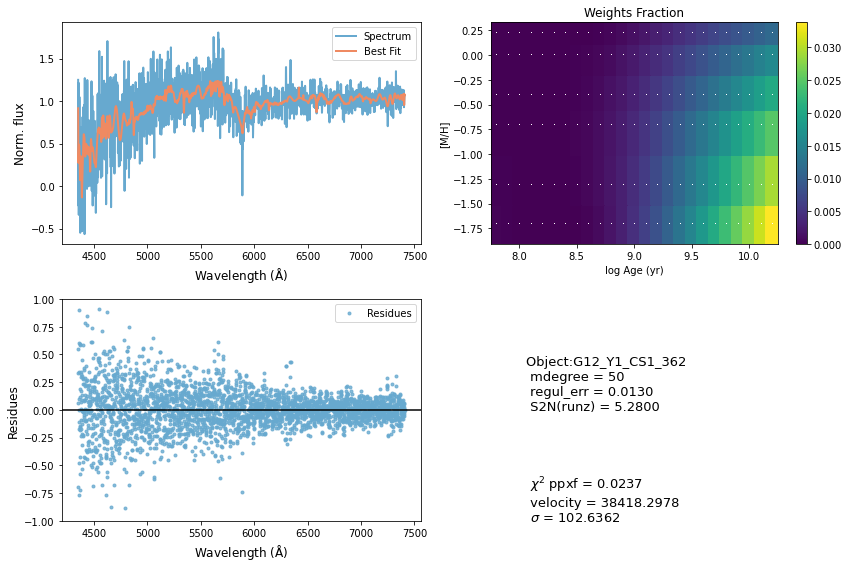

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33915         1    -0.001     0.003
 comp.  1:     33837       179
 comp.  2:     34182       164
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007173
method = capfit; Jac calls: 10; Func calls: 606; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  20 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9805         4   33837   179
Comp:  2       Unknown     0.4282       3.8   34182   164
Comp:  2       Unknown     0.6482       2.8   34182   164
Comp:  2       Unknown          0       2.5   34182   164
---------------------------------------------------------
Weighted <logAge> [yr]: 7.92
Weighted <[M/H]>: -1.16
Weighted <logAge> [yr]: 7.92
Weighted <[M/H]>: -1.16
M/L_r: 0.1583
Current $\chi^2$: 0.0072
Elapsed time in PPXF: 8.79 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


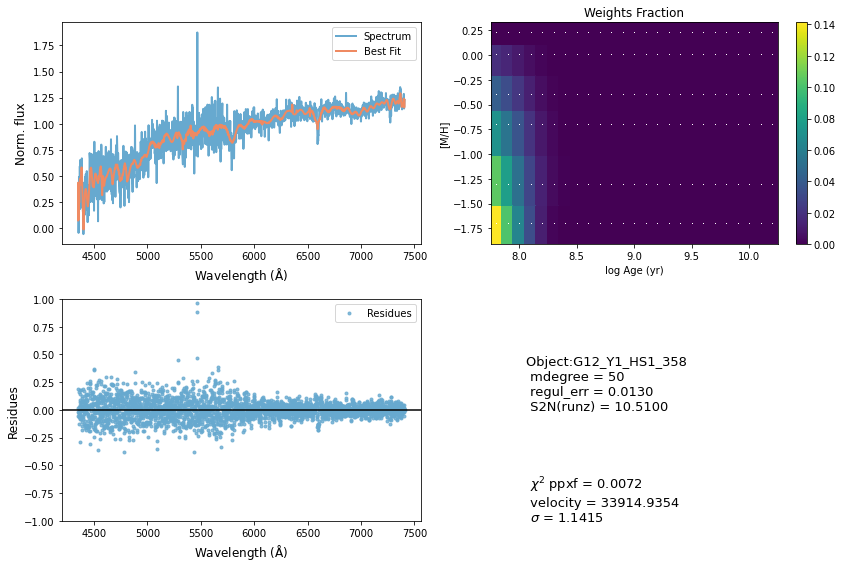

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44984         1    -0.033    -0.033
 comp.  1:     47016       248
 comp.  2:     46984       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00273
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2685       4.4   47016   248
Comp:  2       Unknown     0.3359        11   46984   180
Comp:  2       Unknown          0        10   46984   180
Comp:  2       Unknown          0       5.2   46984   180
Comp:  2       Unknown          0       2.6   46984   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.31
Weighted <[M/H]>: 0.0765
Weighted <logAge> [yr]: 8.31
Weighted <[M/H]>: 0.0765
M/L_r: 0.3067
Current $\chi^2$: 0.0027
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


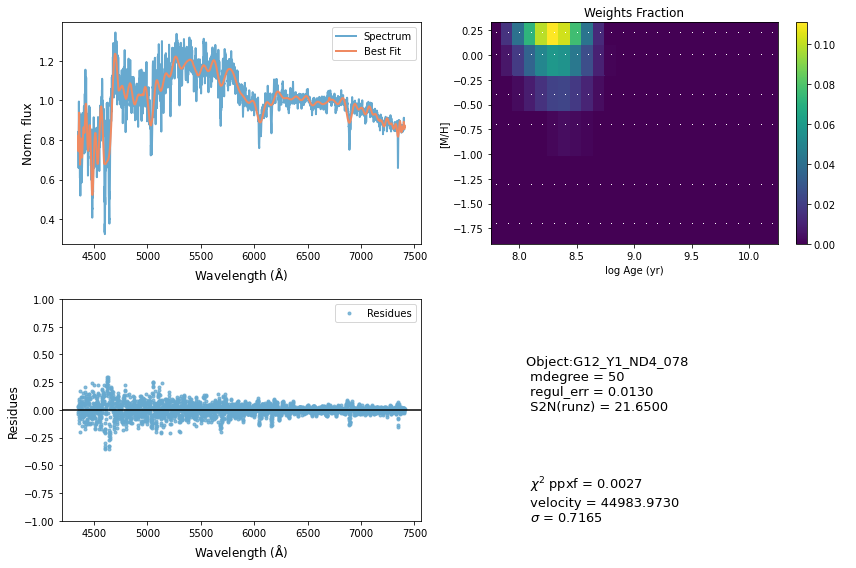

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     57853       143    -0.003     0.002
 comp.  1:     57909       239
 comp.  2:     57818         1
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01495
method = capfit; Jac calls: 13; Func calls: 786; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  77 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.693       3.5   57909   239
Comp:  2       Unknown     0.1558       4.9   57818     1
Comp:  2       Unknown          0       4.7   57818     1
Comp:  2       Unknown     0.4173       2.6   57818     1
---------------------------------------------------------
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.417
Weighted <logAge> [yr]: 9.83
Weighted <[M/H]>: -0.417
M/L_r: 2.401
Current $\chi^2$: 0.0149
Elapsed time in PPXF: 16.21 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


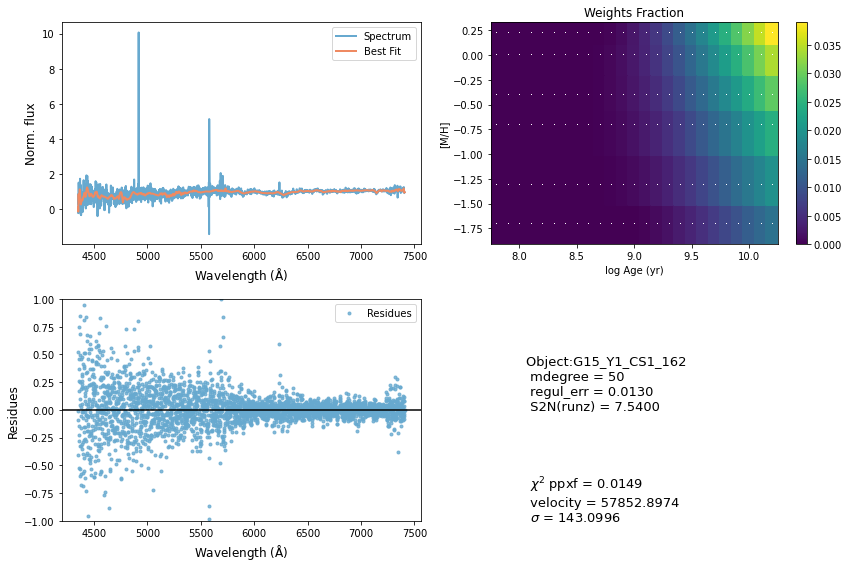

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40473       180     0.000     0.000
 comp.  1:     40473       180
 comp.  2:     40473       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004607
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  36 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.8   40473   180
Comp:  2       Unknown          0       4.2   40473   180
Comp:  2       Unknown          0       2.6   40473   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: -0.158
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: -0.158
M/L_r: 4.534
Current $\chi^2$: 0.0046
Elapsed time in PPXF: 1.18 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


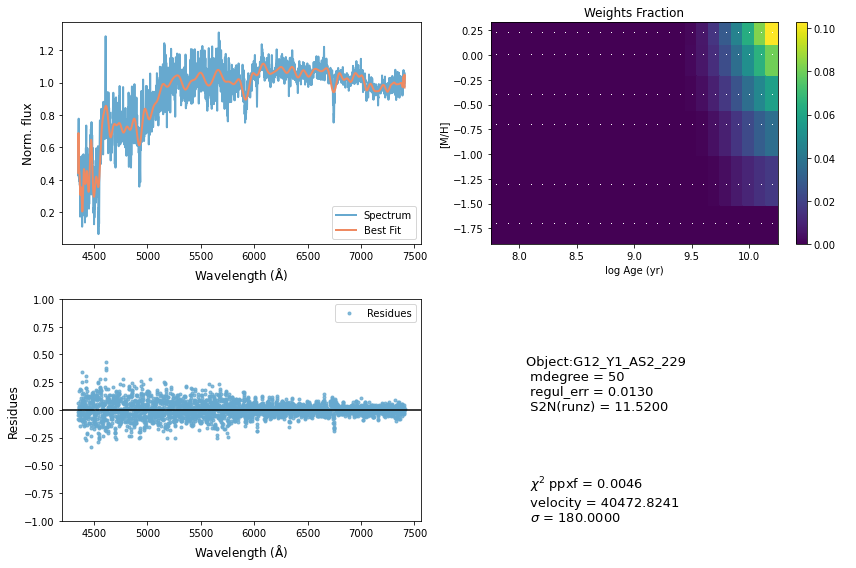

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     73282       823    -0.107    -0.135
 comp.  1:     71559       692
 comp.  2:     71326         1
Gas Reddening E(B-V): 0.363
chi2/DOF: 0.004326
method = capfit; Jac calls: 20; Func calls: 1216; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  27 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.185       7.5   71559   692
Comp:  2       Unknown     0.4711       2.4   71326     1
Comp:  2       Unknown          0       2.2   71326     1
Comp:  2       Unknown          0       2.1   71326     1
---------------------------------------------------------
Weighted <logAge> [yr]: 8.6
Weighted <[M/H]>: -0.313
Weighted <logAge> [yr]: 8.6
Weighted <[M/H]>: -0.313
M/L_r: 0.2826
Current $\chi^2$: 0.0043
Elapsed time in PPXF: 24.68 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


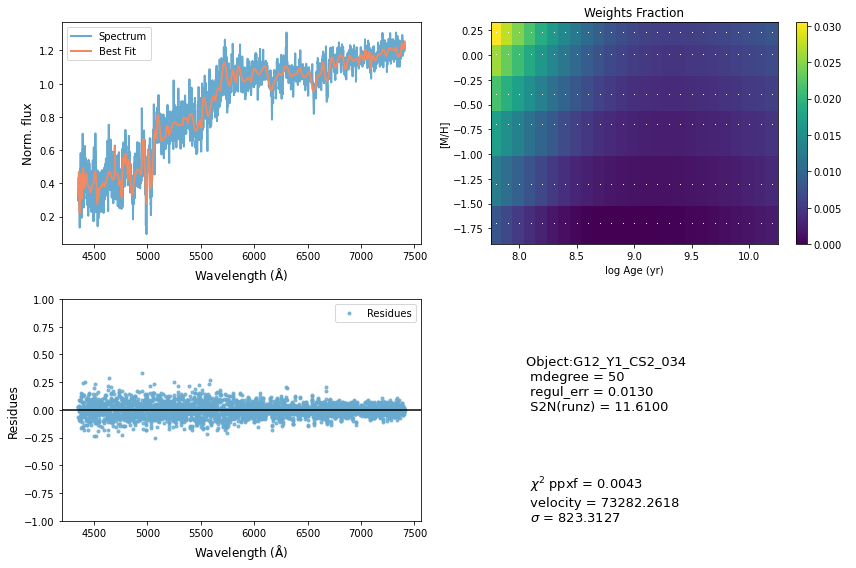

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37853       682     0.006     0.004
 comp.  1:     38012       567
 comp.  2:     37982       112
Gas Reddening E(B-V): 5.881
chi2/DOF: 0.003284
method = capfit; Jac calls: 14; Func calls: 854; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.246       4.1   38012   567
Comp:  2       Unknown          0       3.3   37982   112
Comp:  2       Unknown     0.5849       2.4   37982   112
---------------------------------------------------------
Weighted <logAge> [yr]: 9.66
Weighted <[M/H]>: -0.279
Weighted <logAge> [yr]: 9.66
Weighted <[M/H]>: -0.279
M/L_r: 1.621
Current $\chi^2$: 0.0033
Elapsed time in PPXF: 17.53 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


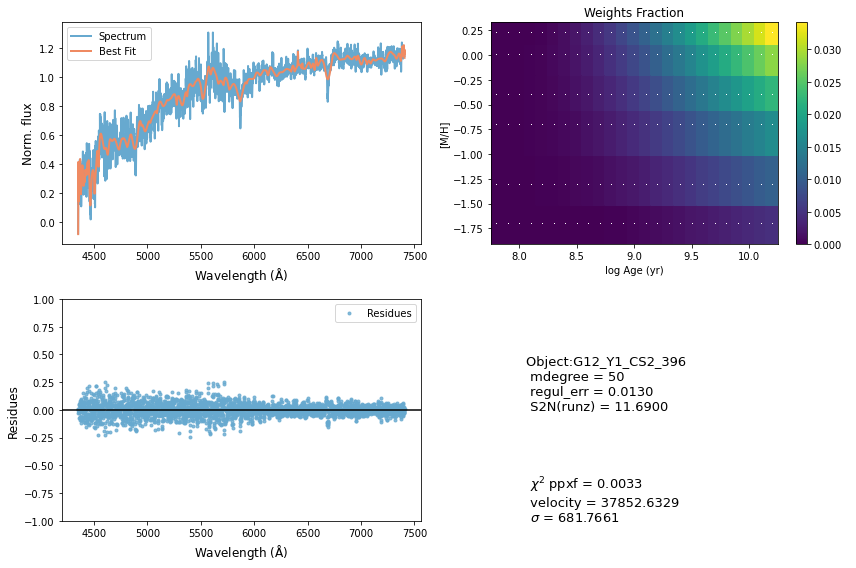

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46859        64    -0.064    -0.061
 comp.  1:     48894       894
 comp.  2:     48201       244
Gas Reddening E(B-V): 1.313
chi2/DOF: 0.006595
method = capfit; Jac calls: 12; Func calls: 727; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.418       5.7   48894   894
Comp:  2       Unknown          0       9.9   48201   244
Comp:  2       Unknown      7.986        10   48201   244
Comp:  2       Unknown     0.1854       5.3   48201   244
Comp:  2       Unknown     0.3879       3.2   48201   244
---------------------------------------------------------
Weighted <logAge> [yr]: 8.61
Weighted <[M/H]>: -1.1
Weighted <logAge> [yr]: 8.61
Weighted <[M/H]>: -1.1
M/L_r: 0.2214
Current $\chi^2$: 0.0066
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


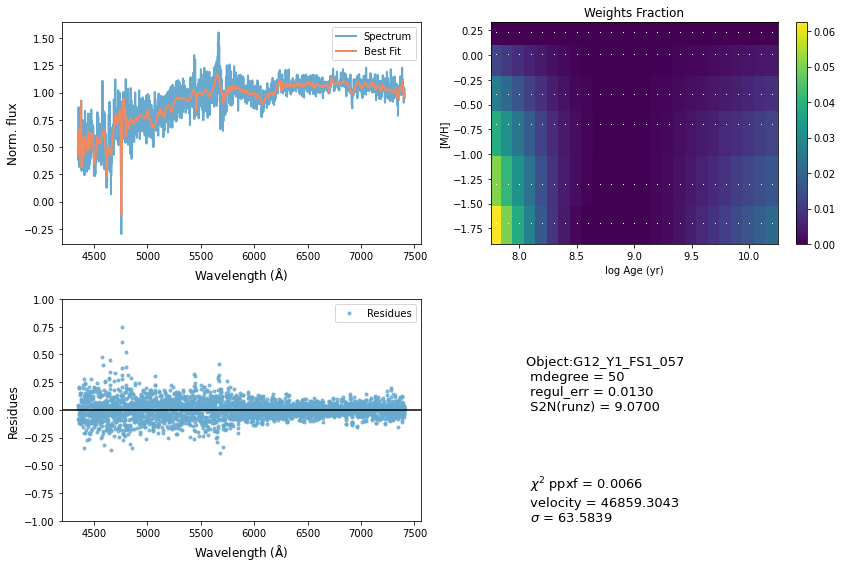

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     32929         1    -0.026    -0.026
 comp.  1:     34929       180
 comp.  2:     34945       254
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.002935
method = capfit; Jac calls: 1; Func calls: 62; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.2   34929   180
Comp:  2       Unknown          0       4.4   34945   254
Comp:  2       Unknown     0.2178       3.6   34945   254
Comp:  2       Unknown          0       3.1   34945   254
---------------------------------------------------------
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.192
Weighted <logAge> [yr]: 9.92
Weighted <[M/H]>: -0.192
M/L_r: 3.399
Current $\chi^2$: 0.0029
Elapsed time in PPXF: 0.92 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


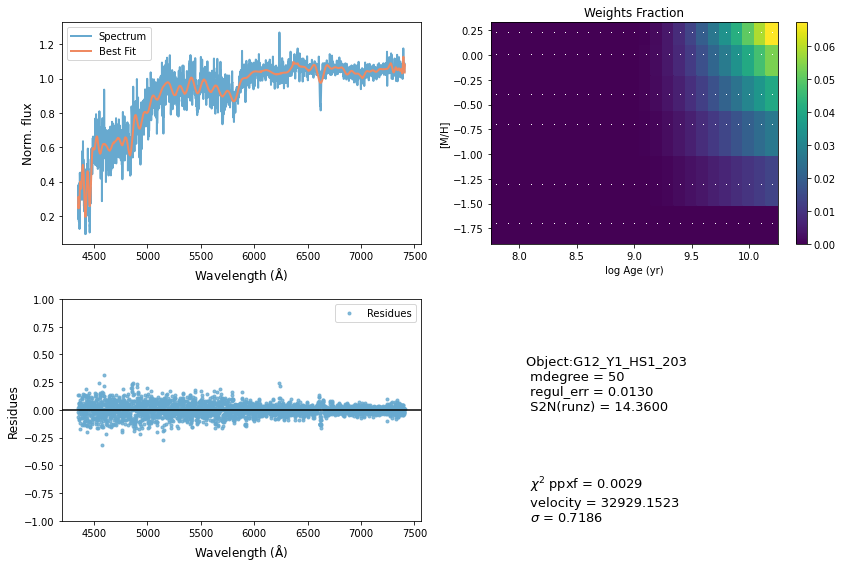

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51593       987     0.165     0.039
 comp.  1:     51172       550
 comp.  2:     51509       311
Gas Reddening E(B-V): 6.521
chi2/DOF: 0.005875
method = capfit; Jac calls: 17; Func calls: 1037; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.911       3.1   51172   550
Comp:  2       Unknown      5.897       5.3   51509   311
Comp:  2       Unknown      4.463       8.4   51509   311
Comp:  2       Unknown      1.164       5.9   51509   311
---------------------------------------------------------
Weighted <logAge> [yr]: 9.62
Weighted <[M/H]>: -0.585
Weighted <logAge> [yr]: 9.62
Weighted <[M/H]>: -0.585
M/L_r: 1.265
Current $\chi^2$: 0.0059
Elapsed time in PPXF: 21.49 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


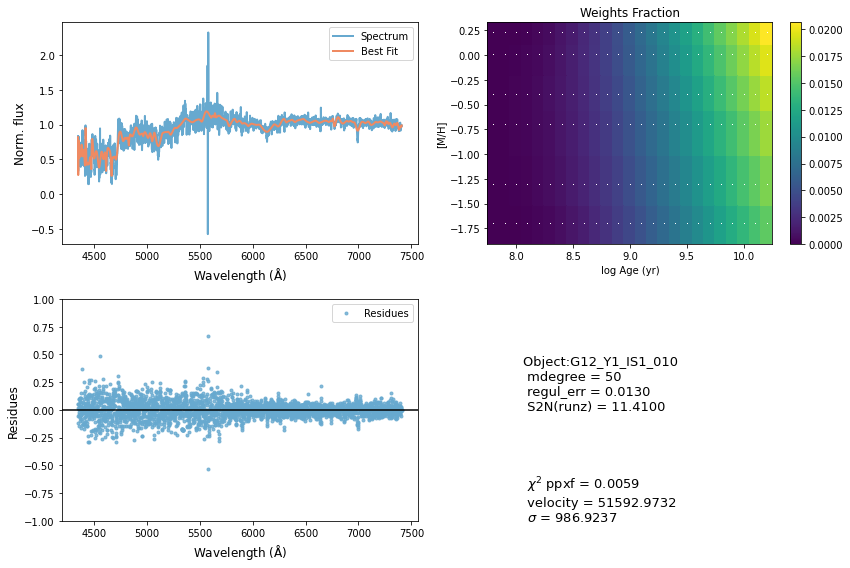

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38867       441     0.042    -0.004
 comp.  1:     39114       712
 comp.  2:     38728        27
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003488
method = capfit; Jac calls: 15; Func calls: 911; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  123 / 153
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      14.17       9.5   39114   712
Comp:  2       Unknown          0       2.3   38728    27
Comp:  2       Unknown     0.3541       1.8   38728    27
---------------------------------------------------------
Weighted <logAge> [yr]: 9.06
Weighted <[M/H]>: -0.809
Weighted <logAge> [yr]: 9.06
Weighted <[M/H]>: -0.809
M/L_r: 0.4631
Current $\chi^2$: 0.0035
Elapsed time in PPXF: 19.45 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


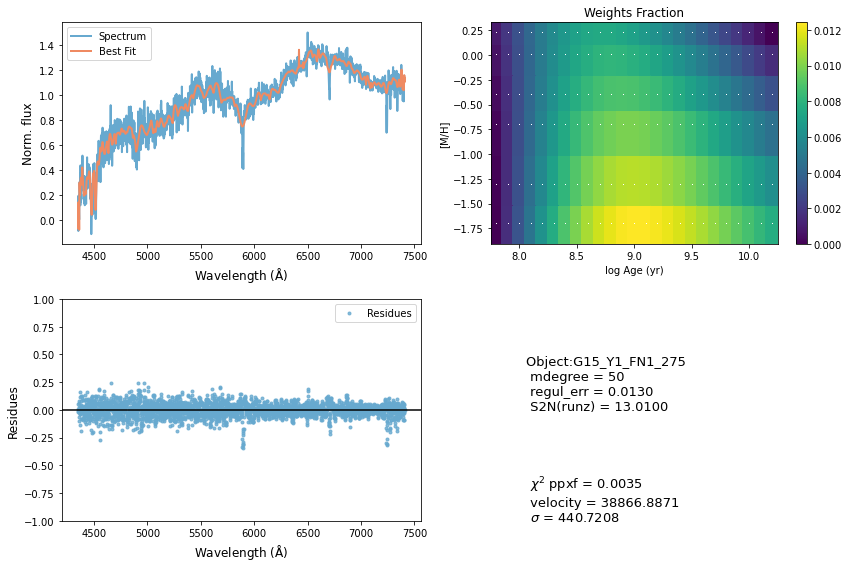

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     77178       180     0.000     0.000
 comp.  1:     77178       180
 comp.  2:     77178       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005807
method = capfit; Jac calls: 1; Func calls: 64; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.7   77178   180
Comp:  2       Unknown     0.1522       5.9   77178   180
Comp:  2       Unknown     0.2293       5.9   77178   180
Comp:  2       Unknown          0       3.5   77178   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.73
Weighted <[M/H]>: -1.16
Weighted <logAge> [yr]: 8.73
Weighted <[M/H]>: -1.16
M/L_r: 0.342
Current $\chi^2$: 0.0058
Elapsed time in PPXF: 1.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


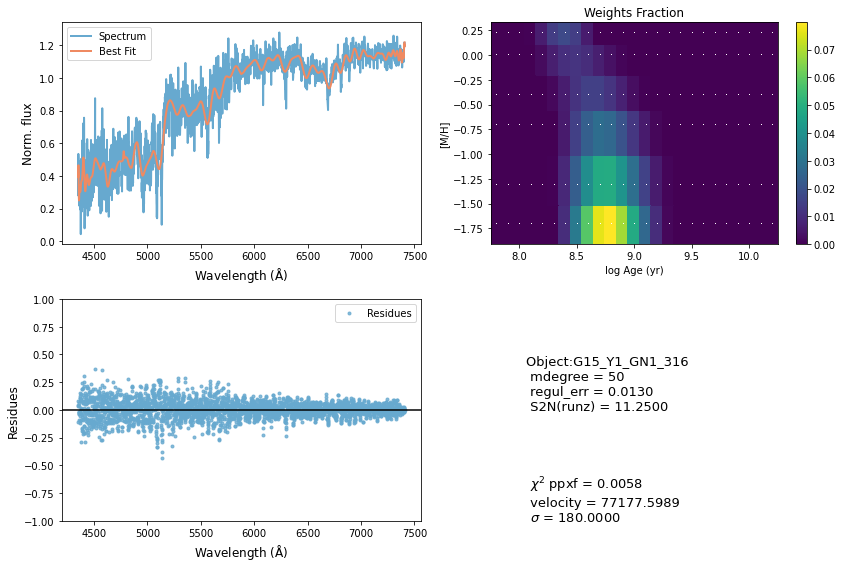

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:95: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52271      1000     0.133    -0.044
 comp.  1:     51664       482
 comp.  2:     51891       265
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00502
method = capfit; Jac calls: 33; Func calls: 1993; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  93 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.707       6.9   51664   482
Comp:  2       Unknown      1.718        10   51891   265
Comp:  2       Unknown      3.551        10   51891   265
Comp:  2       Unknown          0       5.4   51891   265
---------------------------------------------------------
Weighted <logAge> [yr]: 9.55
Weighted <[M/H]>: -0.208
Weighted <logAge> [yr]: 9.55
Weighted <[M/H]>: -0.208
M/L_r: 1.232
Current $\chi^2$: 0.0050
Elapsed time in PPXF: 44.49 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:100: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


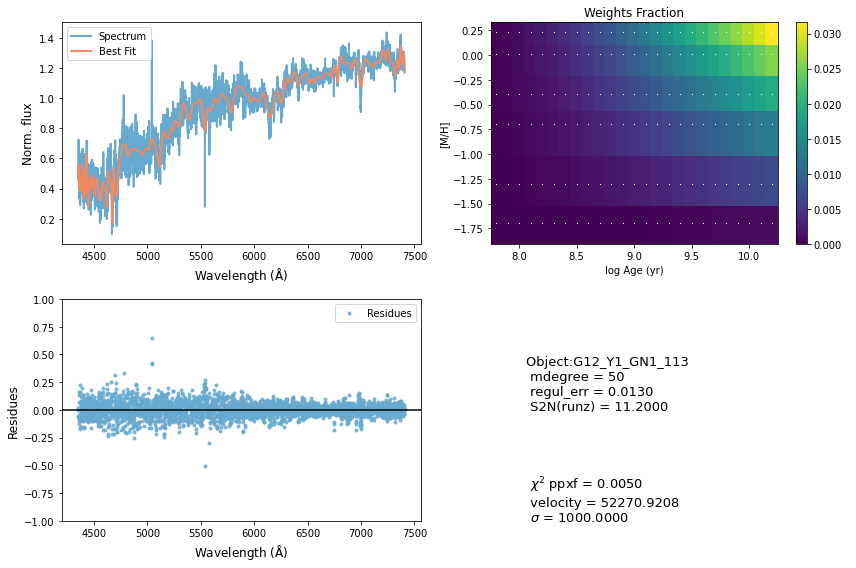

In [17]:
start_time = time.time()
ids_vel = ['CATAID']
for each_sed in range(len(seds_list)):
    
    # settings for the progress bar widget above: does not influence in ppxf -------------------------------------
    bar.value += each_sed/2.                                          # signal to increment the progress bar
    if each_sed<len(seds_list): 
        bar.bar_style = ""                                            # blue when in progress
    else: 
        bar.bar_style = "success"                                     # green when it finishes        
        
    # flux -------------------------------------------------------------------------------------------------------
    sed_file  = os.path.join(seds_path, seds_list[each_sed])          # link between path and files
    sed_flux  = pf.getdata(sed_file)[0]                               # opening each spectra
    sed_err   = pf.getdata(sed_file)[1]                               # opening each spectra error
    
    # wavelength -------------------------------------------------------------------------------------------------
    sed_header = pf.open(sed_file)[0].header
    sed_wl_ini = sed_header['WMIN'] 
    sed_wl_stp = sed_header['CD1_1']
    sed_wl     = np.arange(sed_flux.size)*(sed_wl_stp)+sed_wl_ini     # sed wavelength    
#     plot_sed(sed_wl, sed_flux, sed_err)
    
    # cleaning flux and wavelength trash -------------------------------------------------------------------------
    idx_clean       = np.where((np.logical_not(np.isnan(sed_flux)))*(sed_err>0)) # indices where NAN is present
    flux_temp       = sed_flux[idx_clean]                                   # removing NAN values from spectra
    flux_temp_err   = sed_err[idx_clean]
    wavelength_temp = sed_wl[idx_clean]    
#     plot_sed(wavelength_temp, flux_temp, flux_temp_err)
    
    # limiting the spectrum regarding the wavelength range of the library ----------------------------------------
    wl_lib_idx = (wavelength_temp>wl_min) & (wavelength_temp<wl_max)       # MILES wavelength range
    flux       = flux_temp[wl_lib_idx]
    flux_err   = flux_temp_err[wl_lib_idx]
    wavelength = wavelength_temp[wl_lib_idx]    
#     plot_sed(wavelength, flux, flux_err)    
    
    # other important parameters ---------------------------------------------------------------------------------
    redshift  = sed_header['Z']
    cataid    = sed_header['CATAID']
#     fwhm_gama = wavelength*gama_resol
    fwhm_gama = 2.
    
    # ppxf -------------------------------------------------------------------------------------------------------
    vel_scale          = light_speed*np.log(wavelength[1]/wavelength[0])      # velocity scale - 
                                                                              # Eq.8 Capellari 2017
    
    ### setup templates ------------------------------------------------------------------------------------------
    #### stellar pops --------------------------------------------------------------------------------------------
    miles              = lib.miles(miles_lib, vel_scale, fwhm_gama)
    stellar_templates  = miles.templates.reshape(miles.templates.shape[0], -1)
    reg_dim            = miles.templates.shape[1:]
    dv                 = light_speed*(miles.log_lam_temp[0] - np.log(wavelength[0])) # eq.(8) of Cappellari (2017)
    vel                = light_speed*np.log(1 + redshift)                            # eq.(8) of Cappellari (2017)
    start              = [vel, 180.]
    
    #### gas templates -------------------------------------------------------------------------------------------
    wl_range_galaxy = np.array([np.min(wavelength), np.max(wavelength)])/(1 + redshift)
    gas_templates, gas_names, line_wave = util.emission_lines(miles.log_lam_temp, wl_range_galaxy, fwhm_gama, 
                                                              tie_balmer=tied_balmer, 
                                                              limit_doublets=limit_doublets)
    number_of_templates = stellar_templates.shape[1]
    number_of_forbidden = np.sum(["[" in a for a in gas_names])                 # forbidden lines contain "[*]"
    number_of_balmer    = len(gas_names) - number_of_forbidden
        
    component = (stellar_comp_w*number_of_templates)+(balmer_comp_w*number_of_balmer)+(forbid_comp_w
                                                                                       *number_of_forbidden)
        
    gas_component = np.array(component) > 0       # gas_component=True for gas templates
    start3        = [start, start, start]         # adopt the same starting value for the 3 components
    gas_reddening = 0 if tied_balmer else None  # If the Balmer lines are tied one should allow for gas reddening.
    
    
    #### all templates -------------------------------------------------------------------------------------------
    all_templates = np.column_stack([stellar_templates, gas_templates])
    
    ### rebinning the spectrum so it is at the same size as the templates (or smaller) ---------------------------
    new_shape          = stellar_templates[:,0].shape
    rebinning_function = sci.interp1d(wavelength, flux)   # for the flux
    wavelength_rebin   = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_rebin         = rebinning_function(wavelength_rebin)
    
    ### rebinning the error --------------------------------------------------------------------------------------
    rebin_func_error   = sci.interp1d(wavelength, flux_err)
    wl_rebin_error     = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_err_rebin     = rebin_func_error(wavelength_rebin)
    
    ### final galaxy spectrum and its error to be analysed -------------------------------------------------------
    galaxy             = flux_rebin/np.median(flux_rebin)           # Normalize spectrum to avoid numerical issues
    noise              = flux_err_rebin/np.median(flux_err_rebin)       # idem
    
#     plot_sed(wavelength_rebin, galaxy, noise)    
    
    ### SED FITTING WITH PPXF ------------------------------------------------------------------------------------
    start_time = time.clock()
    sed_fit = ppxf(templates=all_templates, galaxy=galaxy, noise=noise, velscale=vel_scale, start=start3, 
                   plot=False, lam=wavelength_rebin, moments=moments, degree=degree, mdegree=mdegree, 
                   regul=1./regul_err, reg_dim=reg_dim, vsyst=dv, clean=False, component=component, 
                   gas_component=gas_component, gas_reddening=gas_reddening)
    end_time = time.clock()
    
    ## output parameters -- most of them will become a dataframe at the end of the script  
    residues = (galaxy-sed_fit.bestfit)
    
    stellar_weights = sed_fit.weights[~gas_component]                       # Exclude weights of the gas templates
    stellar_weights = stellar_weights.reshape(reg_dim)/stellar_weights.sum()  # Normalized
    
    velocity = sed_fit.sol[0][0]
    sigma    = sed_fit.sol[0][1]
    
    mean_age.append(miles.mean_age_metal(stellar_weights)[0])
    mean_metal.append(miles.mean_age_metal(stellar_weights)[1])
    mass2light.append(miles.mass_to_light(stellar_weights, band="r"))
    ids.append(cataid)
    redshifts.append(redshift)
       
    print(r"Current $\chi^2$: %.4f" % (sed_fit.chi2))
    print('Elapsed time in PPXF: %.2f [min]' % ((end_time-start_time)/60))
    
    ### Saving fit results ---------------------------------------------------------------------------------------
    output = {}
    output['wavelength'] = wavelength_rebin
    output['flux']       = sed_fit.galaxy
    output['best_fit']   = sed_fit.bestfit
    
    output_df = pd.DataFrame(output)
    output_df.to_csv(os.path.join(results_path, 'fit_'+str(cataid)+'_d'+ str(degree)+'_'+str(mdegree)+
                                  '_'+str(wl_min) +'.csv'), index=False)
    vel_disp.append(sigma)
    ids_vel.append(cataid)

    ### Saving plots ---------------------------------------------------------------------------------------------
    plt.subplots(figsize=(12,8))
    
    #### plot01 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,1)
    plt.plot(wavelength_rebin, sed_fit.galaxy, '-', color=palette[-1], linewidth=lw, label="Spectrum")
    plt.plot(wavelength_rebin, sed_fit.bestfit, '-', color=palette[0], linewidth=lw, label="Best Fit")
#     plt.title("Object %s: S/N=%.4f" % (cataid, s2n_top10[each_sed]))
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)", fontsize=12)
    plt.ylabel("Norm. flux", fontsize=12)
    
    #### plot02 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,2)
    miles.plot(stellar_weights)
    
    #### plot03 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,3)
    plt.plot(wavelength_rebin, residues, '.', color=palette[-1], linewidth=lw, label="Residues", 
             alpha=transparency)
    plt.axhline(y=0, c='black')
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)", fontsize=12)
    plt.ylabel("Residues", fontsize=12)
    plt.ylim([-1,1])
    
    #### plot04 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,4)
    plt.text(0.1, 0.5, "Object:{:s} \n mdegree = {:d} \n regul_err = {:.4f}\n S2N(runz) = {:.4f}".
             format(sed_header['SPECID'], mdegree, regul_err, sed_header['SN']), fontsize=13)
    plt.text(0.1, 0.0, " \n $\chi^2$ ppxf = {:.4f} \n velocity = {:.4f} \n $\sigma$ = {:.4f}".
             format(sed_fit.chi2, velocity, sigma), fontsize=13)
    plt.axis('off') 
    figname = 'gal_'+str(cataid)+'_d'+str(degree)+'_m'+str(mdegree)+'_'+str(wl_min)
    plt.tight_layout()
    plt.savefig(os.path.join(results_path, figname +'.png'))
    plt.savefig(os.path.join(results_path, figname +'.pdf'))
    plt.show()

sigma_data = np.column_stack([ids_vel, vel_disp])
sigma_data = pd.DataFrame(sigma_data)
sigma_data.to_csv('../../LargeFilesResults/PSM_analysis/'+'veldisp_d'+str(degree)+'_m'+str(mdegree)+'.csv')
end_time = time.time()
